# Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from matplotlib.colors import LogNorm, Normalize
import matplotlib.patheffects as pe
import torch
from torch import nn
# from torch import optim
# import torch.optim.lr_scheduler as lr_scheduler
# import torch.nn.functional as F
# from torchvision import transforms as T
from torchvision import models
from torch.utils.data import Dataset, DataLoader, Subset
from sklearn.metrics import confusion_matrix, roc_curve, auc, brier_score_loss
from sklearn.calibration import calibration_curve
from sklearn.manifold import TSNE, Isomap
import glob
from astropy.visualization import simple_norm
import os
#from torchvision.io import read_image
from tqdm import tqdm
import pandas as pd
# from pytorch_grad_cam import GradCAM
# from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
# from pytorch_grad_cam.utils.image import show_cam_on_image
# from torchsummary import summary
# from torchinfo import summary
from scipy.stats import binned_statistic
from photutils.segmentation import detect_threshold, detect_sources
from skimage.transform import resize
# import shutil
import umap.umap_ as umap # Recommended way to import UMAP
from matplotlib.colors import LinearSegmentedColormap
from torchvision.models.feature_extraction import create_feature_extractor, get_graph_node_names
from SetRandomSeed import set_random_seeds, GeneratorSeed
from zoobot.pytorch.training.finetune import FinetuneableZoobotClassifier

/n/home09/aschechter/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/n/home09/aschechter/.local/lib/python3.10/site-packages/lightning/fabric/__init__.py:41: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.


In [2]:
print(np.load('/n/holystore01/LABS/hernquist_lab/Users/aschechter/NormalizedDataset/test/anymergers/mergerlabel.npy'))

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [ ]:
!pip show zoobot

Name: zoobot
Version: 2.9.0
Summary: Galaxy morphology classifiers
Home-page: https://github.com/mwalmsley/zoobot
Author: Mike Walmsley
Author-email: walmsleymk1@gmail.com
License: 
Location: /n/home09/aschechter/.conda/envs/zoobot2/lib/python3.10/site-packages
Editable project location: /n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/zoobot/zoobot
Requires: astropy, galaxy-datasets, h5py, huggingface_hub, matplotlib, numpy, pandas, pillow, pyarrow, scikit-learn, scipy, setuptools, tqdm, wandb, webdataset
Required-by: 


: 

In [3]:
#do i want notebook to keep going onto tsne or stop after umap
tsne = 'no'

In [4]:
pd.set_option('display.max_columns', 40)
set_random_seeds(626)
g = GeneratorSeed(626)

In [5]:
# Set the figure size to match one column in AASTeX (3.25 inches width)
width = 3.25
height = 2.5 # height can vary, 2.5 inches is just a suggestion
matplotlib.rcParams["font.size"] = "10"


# Training Curves

In [6]:
trainingloss = pd.read_pickle('nano_1_trial1_3.154957151204336e-07_loss') 
trainingacc  = pd.read_pickle('nano_1_trial1_3.154957151204336e-07_acc') 

In [7]:
cmap = matplotlib.colormaps['magma']

color1 = cmap(0.2)
color2 = cmap(0.3)
color3 = cmap(0.4)
color4 = cmap(0.5)
color5 = cmap(0.6)
color6 = cmap(0.7)

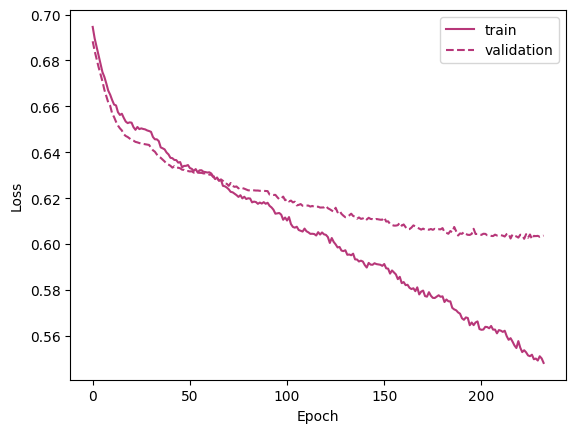

In [8]:
plt.figure()
plt.plot(np.arange(0,len(trainingloss['train'])), trainingloss['train'], color = color4, label = 'train')
plt.plot(np.arange(0,len(trainingloss['validation'])), trainingloss['validation'], linestyle = '--', color = color4, label = 'validation')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


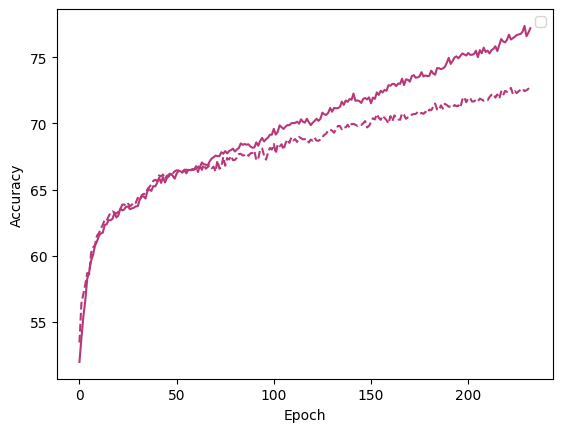

In [9]:
plt.figure()
plt.plot(np.arange(0,len(trainingacc['train'])), trainingacc['train'], color = color4)
plt.plot(np.arange(0,len(trainingacc['validation'])), trainingacc['validation'], linestyle = '--', color = color4)
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

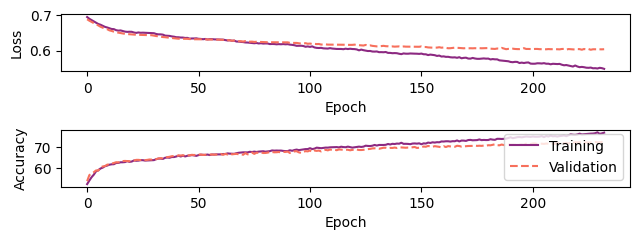

In [10]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize = (2*width, height))
ax1.plot(np.arange(0,len(trainingloss['train'])), trainingloss['train'], color = color3, label = 'Training')
ax1.plot(np.arange(0,len(trainingloss['validation'])), trainingloss['validation'], linestyle = '--', color = color6, label = 'Validation')

ax1.set_ylabel('Loss')
ax1.set_xlabel('Epoch')
#ax1.legend()

ax2.plot(np.arange(0,len(trainingacc['train'])), trainingacc['train'], color = color3, label = 'Training')
ax2.plot(np.arange(0,len(trainingacc['validation'])), trainingacc['validation'], linestyle = '--', color = color6, label = 'Validation')

ax2.set_ylabel('Accuracy')
ax2.set_xlabel('Epoch')
ax2.legend(loc = 4)

plt.tight_layout()
plt.savefig('trainingmetrics.png', dpi = 300)
plt.show()

# Read In Network

In [11]:

#Set up the model for inference

learning_rate=3.154957151204336e-07 #2.691630523637843e-06
lr_decay=0.9507084029946233
weight_decay=0.1 #1.921868518352624e-05 #0.01
dropout=0.5857621119556218
hidden_size=256
batch_size=256
BATCH_SIZE = 256
test_batch_size = 16
num_classes = 2
# model.fc = nn.Sequential(
#     nn.Dropout(dropout_rate),  # Add dropout here
#     nn.Linear(512, 256),
#     nn.ReLU(),
#     nn.Dropout(dropout_rate),
#     nn.Linear(256,2)# Adjust the output size to match your task (e.g., 2 classes)
# )

# CNNName = 'nano_OneCycleStrongWeight_drop_decay' + str(lr_decay) + 'lr' + str(learning_rate)

CNNName =  'nano_1_trial1_lr' + 'lr' + str(learning_rate)
###https://www.kaggle.com/code/kvpratama/pretrained-resnet18-in-pytorch
model = FinetuneableZoobotClassifier(name='hf_hub:mwalmsley/zoobot-encoder-convnext_nano', learning_rate=learning_rate,  # use a low learning rate
    layer_decay=lr_decay,  # reduce the learning rate from lr to lr^0.5 for each block deeper in the network
    # arguments specific to FinetuneableZoobotClassifier
    num_classes=2
)
model.head = nn.Sequential(
        nn.Dropout(dropout),
        nn.Linear(640, hidden_size), 
        nn.ReLU(),
        nn.Dropout(dropout),
        nn.Linear(hidden_size, num_classes)
    )
  
  
    
    ###https://www.kaggle.com/code/kvpratama/pretrained-resnet18-in-pytorch

  # Ensure the output layer is the same
#CNNName = 'ResNet_Adam_Cyclic' #AdamW_Reduce #AdamW_Cyclic #Adam_Reduce #Adam_Cyclic #SGD_Reduce #SGD_Cyclic
# Load the saved model state
# checkpoint = torch.load(CNNName +'_' + str(learning_rate) +'.pth', map_location=torch.device('cpu'))
checkpoint = torch.load('nano_1_trial1_lr3.154957151204336e-07_epoch120.pth', map_location=torch.device('cpu'))
#print("Best model was from epoch:", checkpoint['epoch'])
# Load the model weights from the checkpoint
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to('cpu')  # Ensure the model is on the correct device (GPU/CPU)
model.eval()  # Switch to evaluation mode

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [12]:
print("Original head:", model.head)

Original head: Sequential(
  (0): Dropout(p=0.5857621119556218, inplace=False)
  (1): Linear(in_features=640, out_features=256, bias=True)
  (2): ReLU()
  (3): Dropout(p=0.5857621119556218, inplace=False)
  (4): Linear(in_features=256, out_features=2, bias=True)
)


In [13]:
print(model)

FinetuneableZoobotClassifier(
  (encoder): ConvNeXt(
    (stem): Sequential(
      (0): Conv2d(3, 80, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((80,), eps=1e-06, elementwise_affine=True)
    )
    (stages): Sequential(
      (0): ConvNeXtStage(
        (downsample): Identity()
        (blocks): Sequential(
          (0): ConvNeXtBlock(
            (conv_dw): Conv2d(80, 80, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=80)
            (norm): LayerNorm2d((80,), eps=1e-06, elementwise_affine=True)
            (mlp): Mlp(
              (fc1): Conv2d(80, 320, kernel_size=(1, 1), stride=(1, 1))
              (act): GELU()
              (drop1): Dropout(p=0.0, inplace=False)
              (norm): Identity()
              (fc2): Conv2d(320, 80, kernel_size=(1, 1), stride=(1, 1))
              (drop2): Dropout(p=0.0, inplace=False)
            )
            (shortcut): Identity()
            (drop_path): Identity()
          )
          (1): ConvNeXtBlock(
         

In [14]:
from BinaryMergerDataset import BinaryMergerDataset, get_transforms
path = '/n/holystore01/LABS/hernquist_lab/Users/aschechter/NormalizedDataset/'
BATCH_SIZE = 256

cpu


In [15]:
test_mergers_dataset_orig = BinaryMergerDataset(path, 'test', mergers = True, transform = get_transforms(aug=False), codetest=False)
test_nonmergers_dataset_orig = BinaryMergerDataset(path, 'test', mergers = False, transform = get_transforms(aug=False), codetest=False)


test_dataset_full = torch.utils.data.ConcatDataset([test_mergers_dataset_orig, test_nonmergers_dataset_orig])
# Create a fixed permutation
indices = np.random.permutation(len(test_dataset_full))
shuffled_test_dataset = Subset(test_dataset_full, indices)

#test_dataloader = DataLoader(test_dataset_full, shuffle = False, num_workers = 0, batch_size=BATCH_SIZE)#num workers used to be 4
test_dataloader = DataLoader(shuffled_test_dataset, shuffle = False, num_workers = 0, batch_size=test_batch_size, generator=g)#num workers used to be 4

train_mergers_dataset_augment = BinaryMergerDataset(path, 'train', mergers = True, transform = get_transforms(aug=True), codetest=False)
train_nonmergers_dataset_augment = BinaryMergerDataset(path, 'train', mergers = False, transform = get_transforms(aug=True), codetest=False)

train_mergers_dataset_orig = BinaryMergerDataset(path, 'train', mergers = True, transform = get_transforms(aug=False), codetest=False)
train_nonmergers_dataset_orig = BinaryMergerDataset(path, 'train', mergers = False, transform = get_transforms(aug=False), codetest=False)

train_dataset_full = torch.utils.data.ConcatDataset([train_mergers_dataset_augment, train_nonmergers_dataset_augment, train_mergers_dataset_orig, train_nonmergers_dataset_orig])
train_dataloader = DataLoader(train_dataset_full, shuffle = True, num_workers = 0, batch_size=BATCH_SIZE, generator=g)

validation_mergers_dataset_orig = BinaryMergerDataset(path, 'validation', mergers = True, transform = get_transforms(aug=False), codetest=False)
validation_nonmergers_dataset_orig = BinaryMergerDataset(path, 'validation', mergers = False, transform = get_transforms(aug=False), codetest=False)

validation_dataset_full = torch.utils.data.ConcatDataset([validation_mergers_dataset_orig, validation_nonmergers_dataset_orig])
validation_dataloader = DataLoader(validation_dataset_full, shuffle = False, num_workers = 0, batch_size=BATCH_SIZE, generator=g)#num workers used to be 4



In [16]:
print(len(train_mergers_dataset_orig) + len(train_mergers_dataset_augment))
print(len(train_nonmergers_dataset_orig) + len(train_nonmergers_dataset_augment))

print(len(validation_mergers_dataset_orig))
print(len(validation_nonmergers_dataset_orig))

print(len(test_mergers_dataset_orig))
print(len(test_nonmergers_dataset_orig))

5904
5910
1170
1110
624
630


In [17]:
def get_accuracy(pred,original):
    #pred = (torch.sigmoid(pred) > 0.5).float() #pred is now 0 or 1
    #pred = pred.numpy()
    #original = original.numpy()
    # print(type(pred))
    # print(type(original))
    # if type(pred) != type(original):
    #     return np.nan
    # else:
    #     return np.mean(pred == original) * 100
    print(pred, original)
    return np.mean(pred == original) * 100

def plot_confusion_matrix(cm, classes, epoch, cm_raw=None): #help from chat GPT
    plt.figure(figsize=(3.5,3.5))
    if cm_raw is not None:
        labels = np.array([[f"{cm[i,j]:.2f}%\n({cm_raw[i,j]})" for j in range(cm.shape[1])] for i in range(cm.shape[0])])
        sns.heatmap(cm, annot=labels, fmt="", cmap='Purples', xticklabels=classes, yticklabels=classes, vmin = 0, vmax = 100,
                    square = True, cbar_kws={'label': 'Percentage', "shrink": 0.65})
    else:
        sns.heatmap(cm, annot=True, fmt=".2f", cmap='Purples', xticklabels=classes, yticklabels=classes, vmin = 0, vmax = 100,
                    square = True, cbar_kws={'label': 'Percentage', "shrink": 0.65})
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    #plt.title('Confusion Matrix ' + str(epoch) + ' Set')
    plt.tight_layout()
    plt.savefig('ConfusionMatrix_TestSet_' + CNNName +'.png', dpi = 300, bbox_inches="tight")
    plt.show()

In [18]:
print(get_graph_node_names(model))
feature_extractor_model = create_feature_extractor(model, return_nodes={'head.4': 'extracted_features',})
#feature_extractor_model = create_feature_extractor(model, return_nodes={'encoder.fc': 'extracted_features',})
# Set the feature extractor model to evaluation mode
feature_extractor_model.eval()
feature_extractor_model.to(device)

encoder_extractor_model = create_feature_extractor(model, return_nodes={'encoder': 'encoder_features'})
encoder_extractor_model.eval()
encoder_extractor_model.to(device)

(['x', 'encoder.stem.0', 'encoder.stem.1.permute', 'encoder.stem.1.encoder_stem_1_weight', 'encoder.stem.1.encoder_stem_1_bias', 'encoder.stem.1.layer_norm', 'encoder.stem.1.permute_1', 'encoder.stages.0.downsample', 'encoder.stages.0.blocks.0.conv_dw', 'encoder.stages.0.blocks.0.norm.permute', 'encoder.stages.0.blocks.0.norm.encoder_stages_0_blocks_0_norm_weight', 'encoder.stages.0.blocks.0.norm.encoder_stages_0_blocks_0_norm_bias', 'encoder.stages.0.blocks.0.norm.layer_norm', 'encoder.stages.0.blocks.0.norm.permute_1', 'encoder.stages.0.blocks.0.mlp.fc1', 'encoder.stages.0.blocks.0.mlp.act.gelu', 'encoder.stages.0.blocks.0.mlp.drop1', 'encoder.stages.0.blocks.0.mlp.norm', 'encoder.stages.0.blocks.0.mlp.fc2', 'encoder.stages.0.blocks.0.mlp.drop2', 'encoder.stages.0.blocks.0.encoder_stages_0_blocks_0_gamma', 'encoder.stages.0.blocks.0.reshape', 'encoder.stages.0.blocks.0.mul', 'encoder.stages.0.blocks.0.drop_path', 'encoder.stages.0.blocks.0.shortcut', 'encoder.stages.0.blocks.0.add', 

FinetuneableZoobotClassifier(
  (encoder): Module(
    (stem): Module(
      (0): Conv2d(3, 80, kernel_size=(4, 4), stride=(4, 4))
      (1): Module()
    )
    (stages): Module(
      (0): Module(
        (downsample): Identity()
        (blocks): Module(
          (0): Module(
            (conv_dw): Conv2d(80, 80, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=80)
            (norm): Module()
            (mlp): Module(
              (fc1): Conv2d(80, 320, kernel_size=(1, 1), stride=(1, 1))
              (drop1): Dropout(p=0.0, inplace=False)
              (norm): Identity()
              (fc2): Conv2d(320, 80, kernel_size=(1, 1), stride=(1, 1))
              (drop2): Dropout(p=0.0, inplace=False)
            )
            (drop_path): Identity()
            (shortcut): Identity()
          )
          (1): Module(
            (conv_dw): Conv2d(80, 80, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=80)
            (norm): Module()
            (mlp): Module(
     

In [19]:
all_labels = []
all_preds = []
all_names = []
all_probabilities = []
all_logits = []
all_extracted_features = []
all_encoder_features = []
all_labels_for_isomap_plot = []

model.eval()
with torch.no_grad():  # No need to track gradients during inference
    for images, labels, names in tqdm(test_dataloader):
        #print(type(names))
        #images = torch.tensor(images, dtype=torch.float32).to(device)
        images = images.to(dtype=torch.float32).to(device) #already a torch tensor from dataloader
        #labels = torch.tensor(labels, dtype=torch.long).to(device)
        labels = labels.to(dtype=torch.long).to(device)
        # Forward pass
        outputs = model(images)
        all_logits.extend(outputs.cpu().numpy())
        features_dict = feature_extractor_model(images)
        features = features_dict['extracted_features']
        # print(f"\nBatch {i}:")
        # print(f"  Shape of features from avgpool (before flatten): {features.shape}")

        # The output of avgpool is usually [N, 512, 1, 1]. Flatten it.
        features = torch.flatten(features, 1) # Flattens to [N, 512]
        #print(f"  Shape of features after flatten: {features.shape}")
        all_extracted_features.extend(features.cpu().numpy())
        enc_dict = encoder_extractor_model(images)
        enc_features = torch.flatten(enc_dict['encoder_features'], 1)
        all_encoder_features.extend(enc_features.cpu().numpy())
        all_labels_for_isomap_plot.extend(labels.cpu().numpy())
        #print(outputs)
        #print(outputs.shape)
        probabilities = torch.softmax(outputs, dim=1)
        pred = torch.argmax(outputs, dim=1)   # Convert to binary (0 or 1)
        pred = pred.to(device=device) #dtype=torch.float32
        maxvals, pred_index = torch.max(outputs, 1)
        # Collect labels and predictions
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(pred.cpu().numpy())
        all_names.extend(names)
        all_probabilities.extend(probabilities.cpu().numpy())
# 4. Compute accuracy or other evaluation metrics (e.g., confusion matrix)
# Convert lists to numpy arrays
all_labels = np.array(all_labels)
#all_preds = np.squeeze(np.array(all_preds))
all_preds = np.array(all_preds)
all_names = np.array(all_names)
all_probabilities = np.array(all_probabilities)
all_logits = np.array(all_logits)
test_accuracy = get_accuracy(all_preds, all_labels)
all_extracted_features = np.array(all_extracted_features)
all_encoder_features = np.array(all_encoder_features)
all_labels_for_isomap_plot = np.array(all_labels_for_isomap_plot)
#test_accuracy = np.mean(np.array(test_acc))
print(f"Test Accuracy: {test_accuracy:.2f}%")


100%|██████████| 79/79 [03:31<00:00,  2.68s/it]

[1 0 1 ... 0 1 0] [1 1 1 ... 1 1 0]
Test Accuracy: 64.27%


In [20]:
print(f"Test Accuracy: {test_accuracy:.2f}%")
print(test_accuracy)

print("Best model was from epoch:", checkpoint['epoch'])

Test Accuracy: 64.27%
64.274322169059
Best model was from epoch: 120


In [21]:
matplotlib.rcParams.update({
    'font.size': 9,
    'axes.labelsize': 9,
    'axes.titlesize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'figure.dpi': 300,
})

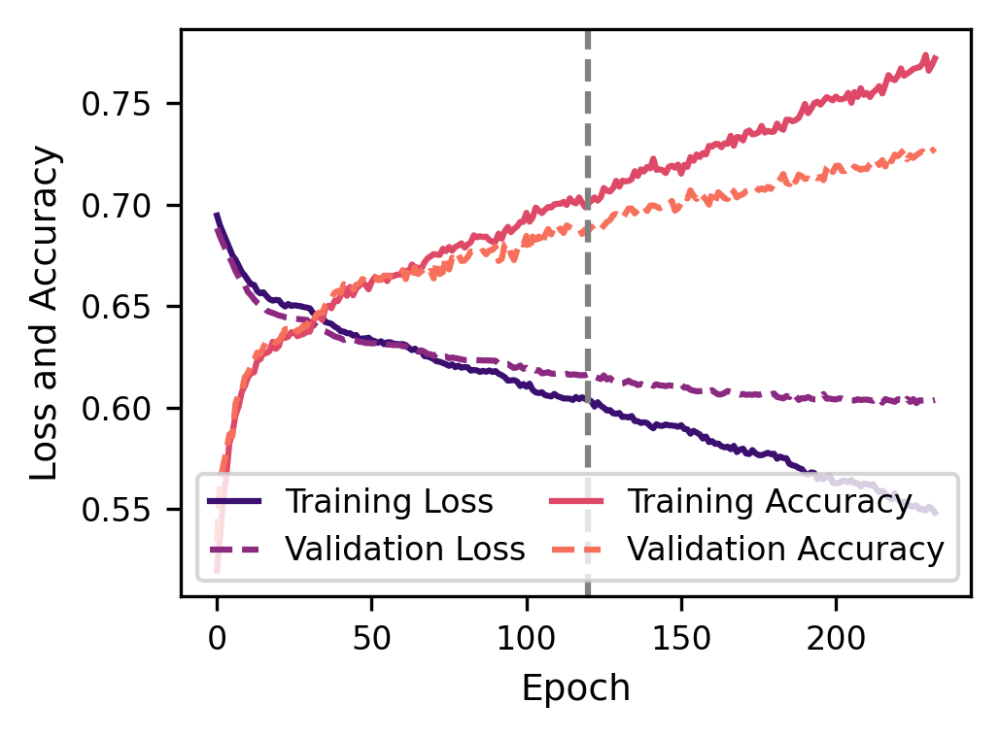

In [22]:
plt.figure(figsize = (3.5,2.6))
plt.plot(np.arange(0,len(trainingloss['train'])), trainingloss['train'], color = color1, label = 'Training Loss')
plt.plot(np.arange(0,len(trainingloss['validation'])), trainingloss['validation'], linestyle = '--', color = color3, label = 'Validation Loss')
#ax1.legend()

plt.plot(np.arange(0,len(trainingacc['train'])), np.array(trainingacc['train'])/100, color = color5, label = 'Training Accuracy')
plt.plot(np.arange(0,len(trainingacc['validation'])), np.array(trainingacc['validation'])/100, linestyle = '--', color = color6, label = 'Validation Accuracy')

plt.axvline(x = checkpoint['epoch'], ymin = 0, ymax = 1, color = 'grey', linestyle="--")
plt.ylabel('Loss and Accuracy') #, fontsize = 'xx-large'
plt.xlabel('Epoch') #, fontsize = 'xx-large'
plt.xticks() #fontsize='large'
plt.yticks() #fontsize='large'
plt.legend(loc=3, ncol = 2, columnspacing=0.8, handlelength=1.5) #, fontsize = 'large'

plt.tight_layout()
plt.savefig('lossANDacc.png', dpi = 300)
plt.show()

In [23]:
# Convert lists to numpy arrays
all_labels = np.array(all_labels)
all_preds = np.array(all_preds)
all_names = np.array(all_names)

In [24]:
print(np.shape(all_labels))

(1254,)


In [25]:
print(np.shape(all_preds))

(1254,)


In [26]:
print(all_preds)

[1 0 1 ... 0 1 0]


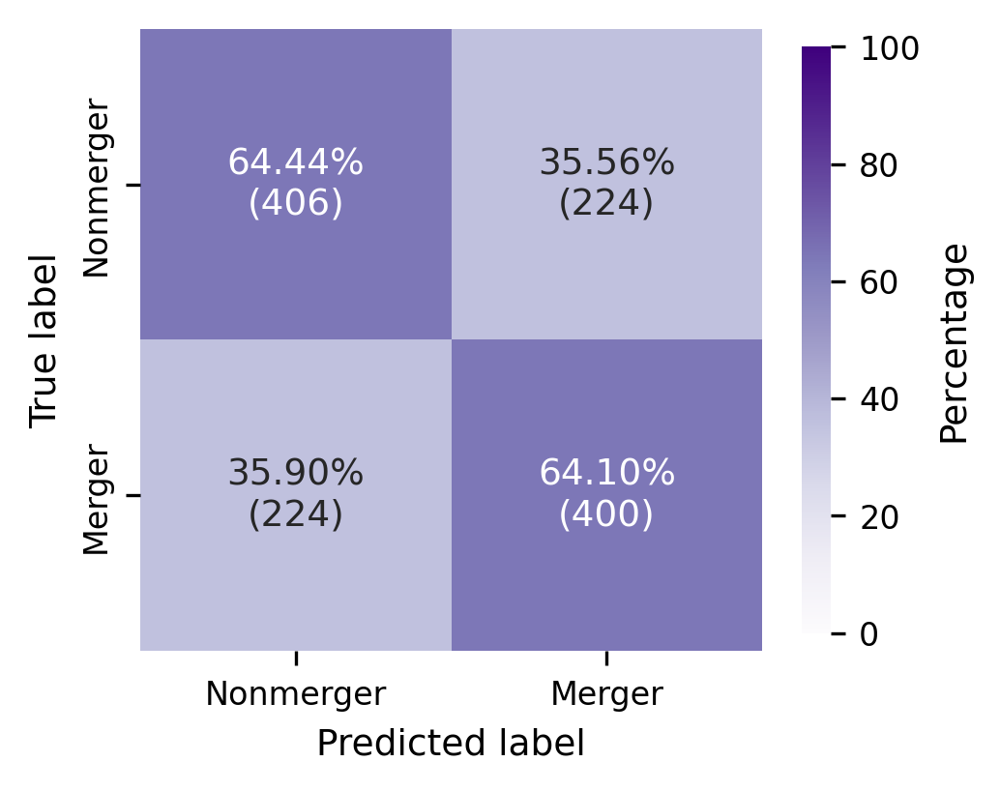

In [27]:
cm = confusion_matrix(all_labels, all_preds)
cmn = (cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]) *100 
TN, FP, FN, TP = cm.ravel()
plot_confusion_matrix(cmn, classes=['Nonmerger', 'Merger'], epoch='Test', cm_raw=cm)


In [28]:
purity = TP / (TP + FP)
completeness = TP / (TP + FN)
print(purity, completeness)

0.6410256410256411 0.6410256410256411


In [29]:
print(np.shape(all_labels))
print(np.shape(all_probabilities[:,0]))
print(np.max(all_probabilities[:,0]))

(1254,)
(1254,)
0.9452548


0.054745194 inf
[0.95202994 0.9398787  0.9368412  0.9342877  0.9329688  0.9129352
 0.91234696 0.90243113 0.89830667 0.88090074 0.87879884 0.86952025
 0.8622378  0.8595874  0.8574708  0.85565263 0.8505955  0.84776884
 0.8458326  0.839473   0.83746725 0.8369254  0.8362708  0.8269046
 0.8241046  0.80674803 0.80487007 0.8048344  0.8037002  0.8034535
 0.80113727 0.79978895 0.79973197 0.7957863  0.79553765 0.79441565
 0.7941679  0.7829819  0.78234744 0.7779243  0.7767768  0.77428126
 0.7739048  0.76873684 0.76762617 0.7580055  0.7553854  0.7525999
 0.7516442  0.7491274  0.74848133 0.737907   0.73769754 0.73526424
 0.735183   0.73505527 0.7344656  0.73122555 0.73063487 0.7281726
 0.72695446 0.7266227  0.7254479  0.71752846 0.71648353 0.7162655
 0.71621203 0.7161272  0.71607536 0.7123785  0.7098519  0.70746815
 0.7073945  0.7030556  0.7020288  0.69989145 0.6993613  0.6956939
 0.6954602  0.69431305 0.6915298  0.6887714  0.6873255  0.68576306
 0.68511254 0.684876   0.6845776  0.68091685 0.680911

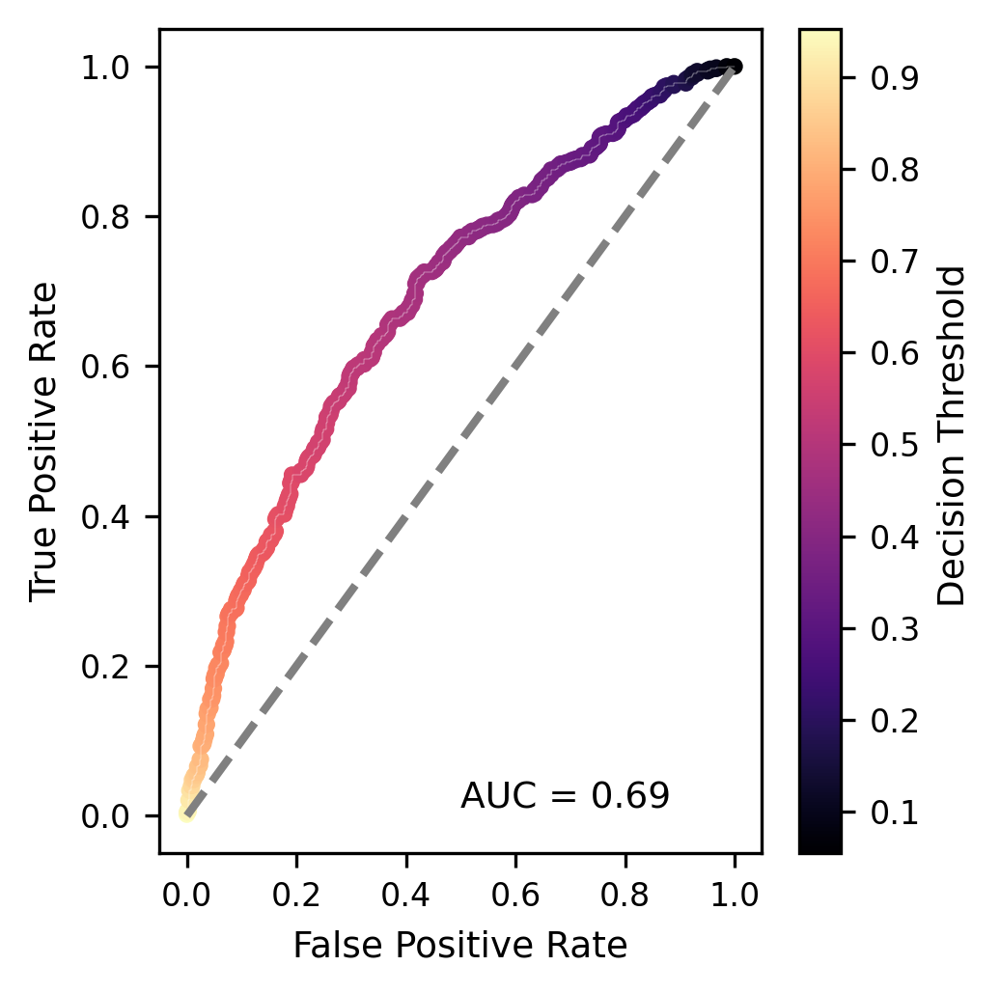

In [30]:
fpr, tpr, thresholds = roc_curve(all_labels, all_probabilities[:,1], pos_label=1)
area = auc(fpr, tpr)
print(np.min(thresholds), np.max(thresholds))
print(thresholds[1:])
#print(fpr, tpr, area)
# Plot ROC curve
plt.figure(figsize=(3.5,3.5))
plt.plot(fpr[1:], tpr[1:], color='white', lw=0.1)
sc = plt.scatter(fpr[1:], tpr[1:], c=thresholds[1:], cmap='magma', s=10)
plt.plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.colorbar(sc, label = ' Decision Threshold')
plt.annotate(text = 'AUC = %0.2f' % area, xy=(0.5,0.01))
#plt.title('ROC Test Set')
#plt.legend(loc="lower right", fontsize = 8)
plt.tight_layout()
plt.savefig('ROC_Test_' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()

In [31]:
correct = []
for i in range(len(all_preds)):
    if all_preds[i] == all_labels[i]:
        correct.append('yes')
    else:
        correct.append('no')

In [32]:
string = '102575_1'
string[:-2]

'102575'

In [33]:
ClassificationInfo = pd.DataFrame(all_names, columns=['Image Name'])
ClassificationInfo['True Label'] = all_labels
ClassificationInfo['Predicted Label'] = all_preds
ClassificationInfo['Correct?'] = correct


ClassificationInfo

,Image Name,True Label,Predicted Label,Correct?
0,550306_4,1,1,yes
1,434122_5,1,0,no
2,527829_5,1,1,yes
3,158285_1,0,1,no
4,540685_5,0,0,yes
...,...,...,...,...
1249,678731_5,0,1,no
1250,653351_4,0,0,yes
1251,357887_2,1,0,no
1252,465702_2,1,1,yes


In [34]:
shids = []
for n in ClassificationInfo['Image Name']:
    #print(n[:-2])
    shids.append(n[:-2])
ClassificationInfo['SubhaloID'] = np.array(shids).astype(int)
shids = list(set(shids))
shids = np.array(shids).astype(int)
print(shids)

[286306 502152 540685 133838 374191 197030 624061 675083 518941 639298
 492232 595535 308519 119693 541965 167640 266035 472772 486234 167856
 571589 338226 559381 532147 582942 408628 438296 184043     16 299152
     12 267974 659259 536542 510232 573149 404548 434122 346813 208269
  25934 619151  74669 553283 273824 561654 489239 413070 683469 431683
 207045 357887 179807 497826 100102 549500 603110 505878 578264 514427
 549751 209243 582874 429842 445318 304170 600936 531792 183287 437412
 285389 550306 636552 463021 474784 477675 502564 544447 505778 445870
 186578 540520 646684 145449 599111 524157 576456 465345 495080 623829
 458629 463603 533331 526488 453895 519340 483393 531709 616523 696171
 239266 543958 628945 613626 299675 566503 396451  79633 522373 553053
 499276 375589 186581 171738 158778  36236 347186 412099 227630 523112
 502560 501001 229981 463291 626646 329990 394377 412395 531893  87012
 297404 610251 209967 249507 459817 248318 431805 435395  55656 496012
 51393

In [35]:
shids.sort()
print(shids)
print(type(shids[0]))

[     3     12     16     36  25934  36234  36236  51917  51921  55656
  74669  79612  79633  87012 100102 119693 133838 135873 145449 158285
 158778 163078 167640 167856 168312 171738 171741 179012 179807 183287
 184043 186578 186581 197030 203574 207045 207053 208269 209243 209967
 217566 223377 227628 227630 229981 235672 239266 244922 248318 249507
 263790 266035 267974 270167 273824 285389 286306 288783 297404 299152
 299675 304170 308519 319900 329990 332258 338226 340254 342238 346813
 347186 349396 349693 357887 361774 366272 374191 375589 385059 389266
 393931 394377 396451 404548 408628 410422 412099 412395 413070 429842
 431683 431805 434122 435395 437412 437919 438296 439679 445318 445870
 450792 453895 456641 457265 458265 458629 459478 459817 463021 463291
 463603 465345 465702 470024 472772 473897 474784 477675 483393 486234
 489239 492155 492232 495080 496012 497826 499276 501001 502152 502560
 502564 505778 505878 510112 510232 511733 513041 513935 514427 515835
 51894

In [36]:
ClassificationInfo = ClassificationInfo.sort_values(by='SubhaloID')
ClassificationInfo

,Image Name,True Label,Predicted Label,Correct?,SubhaloID
619,3_2,0,0,yes,3
879,3_6,0,0,yes,3
745,3_3,0,1,no,3
1037,3_5,0,0,yes,3
692,3_4,0,0,yes,3
...,...,...,...,...,...
130,696171_2,0,0,yes,696171
1231,696171_4,0,0,yes,696171
1182,696171_5,0,0,yes,696171
366,696171_6,0,0,yes,696171


In [37]:
table40 = pd.read_csv('/n/home09/aschechter/code/SubhaloListForMakeMocks40.csv', usecols = ['Subfind_ID', 'Type'])
table50 = pd.read_csv('/n/home09/aschechter/code/SubhaloListForMakeMocks50.csv', usecols = ['Subfind_ID', 'Type'])
bigtable = pd.concat([table40, table50], ignore_index=False)
bigtable

,Subfind_ID,Type
0,289514,Descendant
1,289514,Descendant
2,289514,Descendant
3,289514,Descendant
4,289514,Descendant
...,...,...
3115,118843,0.0
3116,118843,0.0
3117,118843,0.0
3118,118843,0.0


In [38]:
print(type(bigtable['Subfind_ID'][0]))
print(type(shids[0]))

<class 'pandas.core.series.Series'>
<class 'numpy.int64'>


In [39]:
types =[]
for s in shids:
    #print(type(s))
    limit = 6
    result = bigtable.loc[bigtable['Subfind_ID'] == s, 'Type'].values[0]
    print(result)
    while limit != 0:
        types.append(result)
        limit-=1
    

0.0
Descendant
0.0
0.0
0.0
Descendant
Descendant
first_progenitor
0.0
0.0
first_progenitor
Descendant
Merger
Merger
0.0
Descendant
Merger
0.0
Descendant
0.0
0.0
0.0
0.0
first_progenitor
next_progenitor
first_progenitor
first_progenitor
0.0
0.0
next_progenitor
Merger
first_progenitor
0.0
Descendant
first_progenitor
0.0
0.0
next_progenitor
Descendant
0.0
first_progenitor
Merger
Merger
0.0
next_progenitor
0.0
Descendant
0.0
Descendant
0.0
Descendant
0.0
0.0
0.0
0.0
0.0
first_progenitor
0.0
Descendant
0.0
0.0
first_progenitor
0.0
Descendant
Descendant
0.0
Merger
Descendant
Descendant
Descendant
0.0
Descendant
Descendant
Descendant
0.0
first_progenitor
0.0
0.0
next_progenitor
0.0
Descendant
0.0
next_progenitor
0.0
Merger
0.0
0.0
Descendant
first_progenitor
next_progenitor
0.0
first_progenitor
Descendant
first_progenitor
Descendant
0.0
0.0
0.0
Descendant
0.0
0.0
first_progenitor
Merger
0.0
0.0
Merger
Descendant
0.0
0.0
first_progenitor
0.0
0.0
Descendant
next_progenitor
0.0
0.0
Merger
0.0
fi

In [40]:
print(len(types))
ClassificationInfo['Type'] = types
ClassificationInfo

1254


,Image Name,True Label,Predicted Label,Correct?,SubhaloID,Type
619,3_2,0,0,yes,3,0.0
879,3_6,0,0,yes,3,0.0
745,3_3,0,1,no,3,0.0
1037,3_5,0,0,yes,3,0.0
692,3_4,0,0,yes,3,0.0
...,...,...,...,...,...,...
130,696171_2,0,0,yes,696171,0.0
1231,696171_4,0,0,yes,696171,0.0
1182,696171_5,0,0,yes,696171,0.0
366,696171_6,0,0,yes,696171,0.0


### Add Merger Mass Ratio

In [41]:
s_main = 40
s = 40
Subfind_ID_mergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 1, dtype = int)
Subfind_ID_nonmergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 1, dtype = int)
q_mergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 3, dtype = float)
sm_mergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 5, dtype = float)
sm_nonmergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 2, dtype = float)
sfr_mergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 8, dtype = float)
sfr_nonmergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 3, dtype = float)

s_main = 50
s = 50
Subfind_ID_mergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 1, dtype = int)
Subfind_ID_nonmergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 1, dtype = int)
q_mergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 3, dtype = float)
sm_mergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 5, dtype = float)
sm_nonmergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 2, dtype = float)
sfr_mergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 8, dtype = float)
sfr_nonmergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 3, dtype = float)

In [42]:
#print(sfr_nonmergers40)

In [43]:
print()

In [44]:
q= []
sm = []
sfr = []
Subfind_ID = np.concatenate((Subfind_ID_mergers40, Subfind_ID_mergers50))
Subfind_ID_nonmergers = np.concatenate((Subfind_ID_nonmergers40, Subfind_ID_nonmergers50))
q_mergers = np.concatenate((q_mergers40, q_mergers50))
sm_mergers = np.concatenate((sm_mergers40, sm_mergers50))
sm_nonmergers = np.concatenate((sm_nonmergers40, sm_nonmergers50))
sfr_mergers = np.concatenate((sfr_mergers40, sfr_mergers50))
sfr_nonmergers = np.concatenate((sfr_nonmergers40, sfr_nonmergers50))
for s in shids:
    #print(type(s))
    limit = 6
    if s in Subfind_ID:
        index = np.where(Subfind_ID == s)[0][0]
        #print(index[0][0])
        ratio = q_mergers[index]
        stellarmass = np.log10(sm_mergers[index])
        starformation = sfr_mergers[index]
        if ratio < 1:
            while limit != 0:
                q.append(ratio)
                sm.append(stellarmass) 
                sfr.append(starformation)
                limit-=1     
        else:
            while limit != 0:
                q.append(1/ratio)
                sm.append(stellarmass) 
                sfr.append(starformation)
                limit-=1
    else:
        index = np.where(Subfind_ID_nonmergers == s)[0][0]
        while limit != 0:
            q.append(0.0)
            stellarmass = np.log10(sm_nonmergers[index])
            sm.append(stellarmass) 
            starformation = sfr_nonmergers[index]
            sfr.append(starformation)
            limit-=1

q_name = []
for r in q:
    if r== 0.0:
        q_name.append('non')
    elif r >= 0.25:
        q_name.append('major')
    else: 
        q_name.append('minor')
#print(len(q))
ClassificationInfo['Mass Ratio'] = q
ClassificationInfo['Ratio Name'] = q_name
ClassificationInfo['Stellar Mass'] = sm
ClassificationInfo['SFR'] = sfr

In [45]:
ClassificationInfo

,Image Name,True Label,Predicted Label,Correct?,SubhaloID,Type,Mass Ratio,Ratio Name,Stellar Mass,SFR
619,3_2,0,0,yes,3,0.0,0.0,non,10.993829,3.223145
879,3_6,0,0,yes,3,0.0,0.0,non,10.993829,3.223145
745,3_3,0,1,no,3,0.0,0.0,non,10.993829,3.223145
1037,3_5,0,0,yes,3,0.0,0.0,non,10.993829,3.223145
692,3_4,0,0,yes,3,0.0,0.0,non,10.993829,3.223145
...,...,...,...,...,...,...,...,...,...,...
130,696171_2,0,0,yes,696171,0.0,0.0,non,7.979035,0.045210
1231,696171_4,0,0,yes,696171,0.0,0.0,non,7.979035,0.045210
1182,696171_5,0,0,yes,696171,0.0,0.0,non,7.979035,0.045210
366,696171_6,0,0,yes,696171,0.0,0.0,non,7.979035,0.045210


In [46]:
p_class = []
t_class = []

for l in ClassificationInfo['True Label']:
    if l == 0:
        t_class.append('nonmerger')
    else:
        t_class.append('merger')

for l in ClassificationInfo['Predicted Label']:
    if l == 0:
        p_class.append('nonmerger')
    else:
        p_class.append('merger')

ClassificationInfo['True Class'] = t_class
ClassificationInfo['Predicted Class'] = p_class

In [47]:
ClassificationInfo = ClassificationInfo.loc[:, ['SubhaloID', 'Image Name', 'True Class', 'Predicted Class', 'True Label', 'Predicted Label', 'Correct?', 'Type', 'Mass Ratio', 'Ratio Name', 'Stellar Mass', 'SFR']]

In [48]:
ClassificationInfo

,SubhaloID,Image Name,True Class,Predicted Class,True Label,Predicted Label,Correct?,Type,Mass Ratio,Ratio Name,Stellar Mass,SFR
619,3,3_2,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,10.993829,3.223145
879,3,3_6,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,10.993829,3.223145
745,3,3_3,nonmerger,merger,0,1,no,0.0,0.0,non,10.993829,3.223145
1037,3,3_5,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,10.993829,3.223145
692,3,3_4,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,10.993829,3.223145
...,...,...,...,...,...,...,...,...,...,...,...,...
130,696171,696171_2,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
1231,696171,696171_4,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
1182,696171,696171_5,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
366,696171,696171_6,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210


In [49]:
ClassificationInfo.to_csv('CNN_ResultsTable_' + CNNName + '.csv', index=False)

#### How do we do on major vs minor mergers?

In [50]:
allmergers = ClassificationInfo[ClassificationInfo['Mass Ratio'] != 0.0]
allmergers_correct = allmergers[allmergers['Correct?'] == 'yes']
allmergers_accuracy = np.round(len(allmergers_correct)/len(allmergers) *100, 2)
print(allmergers_accuracy)

64.1


In [51]:
major = ClassificationInfo[ClassificationInfo['Ratio Name'] == 'major']
minor = ClassificationInfo[ClassificationInfo['Ratio Name'] == 'minor']
non = ClassificationInfo[ClassificationInfo['Ratio Name'] == 'non']

major_correct = major[major['Correct?'] == 'yes']
minor_correct = minor[minor['Correct?'] == 'yes']
non_correct = non[non['Correct?'] == 'yes']

major_accuracy = np.round(len(major_correct)/len(major) *100, 2)
minor_accuracy = np.round(len(minor_correct)/len(minor)*100, 2)
non_accuracy = np.round(len(non_correct)/len(non)*100, 2)

print(major_accuracy)
print(minor_accuracy)
print(non_accuracy)

67.73
61.11
64.44


In [52]:
corrects = ClassificationInfo[ClassificationInfo['Correct?'] == 'yes']
print(len(corrects)/len(ClassificationInfo))

0.6427432216905901


#### How do we do on different merger stages?

In [53]:
merger= ClassificationInfo[ClassificationInfo['Type'] == 'Merger']
early = ClassificationInfo[(ClassificationInfo['Type'] == 'first_progenitor') | (ClassificationInfo['Type'] == 'next_progenitor')] #| is or but better for this case
late = ClassificationInfo[ClassificationInfo['Type'] == 'Descendant']

merger_correct = merger[merger['Correct?'] == 'yes']
early_correct = early[early['Correct?'] == 'yes']
late_correct = late[late['Correct?'] == 'yes']

merger_accuracy = np.round(len(merger_correct)/len(merger) *100,2)
early_accuracy = np.round(len(early_correct)/len(early)*100,2)
late_accuracy = np.round(len(late_correct)/len(late)*100,2)



print(merger_accuracy)
print(early_accuracy)
print(late_accuracy)

62.5
71.48
56.41


In [54]:
post = ClassificationInfo[(ClassificationInfo['Type'] == 'Merger') | (ClassificationInfo['Type'] == 'Descendant')] #| is or but better for this case
post_correct = post[post['Correct?'] == 'yes']
post_accuracy = len(post_correct)/len(post)
print(post_accuracy)

0.5847457627118644


## How about stage + mass ratio?

In [55]:
# merger= ClassificationInfo[ClassificationInfo['Type'] == 'Merger']
early = ClassificationInfo[(ClassificationInfo['Type'] == 'first_progenitor') | (ClassificationInfo['Type'] == 'next_progenitor')] #| is or but better for this case
# late = ClassificationInfo[ClassificationInfo['Type'] == 'Descendant']
post = ClassificationInfo[(ClassificationInfo['Type'] == 'Merger') | (ClassificationInfo['Type'] == 'Descendant')]

early_major = early[early['Ratio Name'] == 'major']
early_minor = early[early['Ratio Name'] == 'minor']
post_major = post[post['Ratio Name'] == 'major']
post_minor = post[post['Ratio Name'] == 'minor']

# merger_correct = merger[merger['Correct?'] == 'yes']
early_major_correct = early_major[early_major['Correct?'] == 'yes']
early_minor_correct = early_minor[early_minor['Correct?'] == 'yes']
# late_correct = late[late['Correct?'] == 'yes']
post_major_correct = post_major[post_major['Correct?'] == 'yes']
post_minor_correct = post_minor[post_minor['Correct?'] == 'yes']

# merger_accuracy = np.round(len(merger_correct)/len(merger) *100,2)
early_major_accuracy = len(early_major_correct)/len(early_major)*100
early_minor_accuracy = len(early_minor_correct)/len(early_minor)*100
# late_accuracy = len(late_correct)/len(late)*100
post_major_accuracy = len(post_major_correct)/len(post_major)*100
post_minor_accuracy = len(post_minor_correct)/len(post_minor)*100



print(early_major_accuracy)
print(early_minor_accuracy)
print(post_major_accuracy)
print(post_minor_accuracy)

74.16666666666667
69.33333333333334
62.96296296296296
54.6875


# Which galaxies are classified correctly from every angle?

In [56]:
every_angle_correct = []
for s in shids:
    s = s.astype(str)
    angle1 = s+'_1'
    angle2 = s+'_2'
    angle3 = s+'_3'
    angle4 = s+'_4'
    angle5 = s+'_5'
    angle6 = s+'_6'
    a1 = ClassificationInfo[ClassificationInfo['Image Name'] == angle1]
    a2 = ClassificationInfo[ClassificationInfo['Image Name'] == angle2]
    a3 = ClassificationInfo[ClassificationInfo['Image Name'] == angle3]
    a4 = ClassificationInfo[ClassificationInfo['Image Name'] == angle4]
    a5 = ClassificationInfo[ClassificationInfo['Image Name'] == angle5]
    a6 = ClassificationInfo[ClassificationInfo['Image Name'] == angle6]
    
    if a1['Correct?'].values[0] == 'yes' and a2['Correct?'].values[0] == 'yes' and a3['Correct?'].values[0] == 'yes'\
        and a4['Correct?'].values[0] == 'yes' and a5['Correct?'].values[0] == 'yes' and a6['Correct?'].values[0] == 'yes':
        every_angle_correct.append(int(s))
    #print(a1['Correct?'].values[0])
#ClassificationInfo

In [57]:
print(every_angle_correct)

[25934, 55656, 133838, 158778, 167856, 168312, 208269, 209967, 223377, 235672, 244922, 249507, 288783, 299675, 308519, 332258, 338226, 346813, 349693, 366272, 374191, 389266, 413070, 431805, 438296, 445870, 489239, 492155, 502560, 543137, 696171]


In [58]:
EveryAngleCorrect = ClassificationInfo[ClassificationInfo['SubhaloID'].isin(every_angle_correct)]
EveryAngleCorrect

,SubhaloID,Image Name,True Class,Predicted Class,True Label,Predicted Label,Correct?,Type,Mass Ratio,Ratio Name,Stellar Mass,SFR
1097,25934,25934_5,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,8.329661,0.000126
117,25934,25934_4,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,8.329661,0.000126
220,25934,25934_1,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,8.329661,0.000126
974,25934,25934_6,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,8.329661,0.000126
352,25934,25934_2,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,8.329661,0.000126
...,...,...,...,...,...,...,...,...,...,...,...,...
130,696171,696171_2,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
1231,696171,696171_4,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
1182,696171,696171_5,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
366,696171,696171_6,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210


In [59]:
EveryAngleCorrect.to_csv('EveryAngleCorrect_' + CNNName + '.csv', index=False)

# Which galaxies are classified wrong from every angle?

In [60]:
every_angle_wrong = []
for s in shids:
    s = s.astype(str)
    angle1 = s+'_1'
    angle2 = s+'_2'
    angle3 = s+'_3'
    angle4 = s+'_4'
    angle5 = s+'_5'
    angle6 = s+'_6'
    a1 = ClassificationInfo[ClassificationInfo['Image Name'] == angle1]
    a2 = ClassificationInfo[ClassificationInfo['Image Name'] == angle2]
    a3 = ClassificationInfo[ClassificationInfo['Image Name'] == angle3]
    a4 = ClassificationInfo[ClassificationInfo['Image Name'] == angle4]
    a5 = ClassificationInfo[ClassificationInfo['Image Name'] == angle5]
    a6 = ClassificationInfo[ClassificationInfo['Image Name'] == angle6]
    
    if a1['Correct?'].values[0] == 'no' and a2['Correct?'].values[0] == 'no' and a3['Correct?'].values[0] == 'no'\
        and a4['Correct?'].values[0] == 'no' and a5['Correct?'].values[0] == 'no' and a6['Correct?'].values[0] == 'no':
        every_angle_wrong.append(int(s))
    #print(a1['Correct?'].values[0])
#ClassificationInfo
print(every_angle_wrong)

[74669, 158285, 463603, 675083]


In [61]:
EveryAngleWrong = ClassificationInfo[ClassificationInfo['SubhaloID'].isin(every_angle_wrong)]
EveryAngleWrong

,SubhaloID,Image Name,True Class,Predicted Class,True Label,Predicted Label,Correct?,Type,Mass Ratio,Ratio Name,Stellar Mass,SFR
996,74669,74669_2,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
444,74669,74669_6,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
1026,74669,74669_4,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
435,74669,74669_3,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
300,74669,74669_1,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
301,74669,74669_5,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
357,158285,158285_5,nonmerger,merger,0,1,no,0.0,0.000000,non,8.811883,0.568800
1089,158285,158285_3,nonmerger,merger,0,1,no,0.0,0.000000,non,8.811883,0.568800
999,158285,158285_2,nonmerger,merger,0,1,no,0.0,0.000000,non,8.811883,0.568800
137,158285,158285_4,nonmerger,merger,0,1,no,0.0,0.000000,non,8.811883,0.568800


In [62]:
EveryAngleWrong.to_csv('EveryAngleWrong_' + CNNName + '.csv', index=False)

# What is the average number of correct angles per galaxy? Does this change with mass ratio?

In [63]:
num_angle_correct = []
num_angle_correct_nm = []
mass_ratio = []
for s in shids:
    s = s.astype(str)
    angle1 = s+'_1'
    angle2 = s+'_2'
    angle3 = s+'_3'
    angle4 = s+'_4'
    angle5 = s+'_5'
    angle6 = s+'_6'
    a1 = ClassificationInfo[ClassificationInfo['Image Name'] == angle1]
    a2 = ClassificationInfo[ClassificationInfo['Image Name'] == angle2]
    a3 = ClassificationInfo[ClassificationInfo['Image Name'] == angle3]
    a4 = ClassificationInfo[ClassificationInfo['Image Name'] == angle4]
    a5 = ClassificationInfo[ClassificationInfo['Image Name'] == angle5]
    a6 = ClassificationInfo[ClassificationInfo['Image Name'] == angle6]
    count = 0
    for a in [a1, a2, a3, a4, a5, a6]:
        if a['Correct?'].values[0] == 'yes':
            count+=1
    num_angle_correct.append(count)
    mass_ratio.append(a['Mass Ratio'].values[0])
num_angle_correct = np.array(num_angle_correct) 
mass_ratio = np.array(mass_ratio)     
print(np.mean(np.array(num_angle_correct)))    
print(np.median(np.array(num_angle_correct)))    
print(np.std(np.array(num_angle_correct)))    

3.8564593301435406
4.0
1.5149869800699178


In [64]:
bins = np.arange(-0.5,7,1)

In [65]:
inds = np.where(mass_ratio != 0.0)[0]

In [66]:
print(num_angle_correct[~inds])
print(num_angle_correct[inds])
print(np.mean(num_angle_correct[inds]))
print(np.median(num_angle_correct[inds]))

print(np.mean(num_angle_correct[~inds]))
print(np.median(num_angle_correct[~inds]))

[4 4 5 2 5 4 5 3 3 3 4 3 5 5 4 2 5 1 2 2 4 2 3 3 3 4 3 3 5 5 3 4 4 1 1 5 2
 5 5 4 4 3 4 5 3 4 6 6 2 5 4 5 2 0 2 5 4 3 6 6 2 3 3 4 6 1 3 5 4 6 4 4 5 5
 5 6 6 4 6 4 3 1 4 5 3 5 5 4 6 4 6 3 6 3 5 5 5 3 5 6 6 6 2 5]
[2 3 5 5 0 4 4 5 2 6 5 6 6 5 5 5 3 5 3 5 6 3 4 6 5 5 5 5 3 4 4 4 3 3 6 5 3
 6 5 6 4 6 5 4 4 3 1 6 4 6 3 3 4 1 4 3 3 5 4 4 4 4 5 2 6 6 4 5 3 4 4 4 5 2
 5 5 1 4 3 5 2 4 1 4 5 3 4 2 3 3 2 2 4 3 2 2 1 2 5 5 3 2 3 0]
3.8461538461538463
4.0
3.951923076923077
4.0


In [141]:
# At least 1 angle correct
at_least_1 = [shids[i] for i in range(len(shids)) if num_angle_correct[i] >= 1]
AtLeast1AngleCorrect = ClassificationInfo[ClassificationInfo['SubhaloID'].isin(at_least_1)]
print(f"At least 1 angle correct: {len(at_least_1)} galaxies")

# At least 2 angles correct
at_least_2 = [shids[i] for i in range(len(shids)) if num_angle_correct[i] >= 2]
AtLeast2AnglesCorrect = ClassificationInfo[ClassificationInfo['SubhaloID'].isin(at_least_2)]
print(f"At least 2 angles correct: {len(at_least_2)} galaxies")

#At least 4 angles correct
at_least_4 = [shids[i] for i in range(len(shids)) if num_angle_correct[i] >= 4]
AtLeast4AnglesCorrect = ClassificationInfo[ClassificationInfo['SubhaloID'].isin(at_least_4)]
print(f"At least 4 angles correct: {len(at_least_4)} galaxies")

n_galaxies = len(shids)
print(f"At least 1 angle: {len(at_least_1)/n_galaxies*100:.2f}%")
print(f"At least 2 angles: {len(at_least_2)/n_galaxies*100:.2f}%")
print(f"At least 4 angles: {len(at_least_4)/n_galaxies*100:.2f}%")
print(f"All 6 angles: {len(every_angle_correct)/n_galaxies*100:.2f}%")

print(len(every_angle_correct))


At least 1 angle correct: 205 galaxies
At least 2 angles correct: 192 galaxies
At least 4 angles correct: 128 galaxies
At least 1 angle: 98.09%
At least 2 angles: 91.87%
At least 4 angles: 61.24%
All 6 angles: 14.83%
31


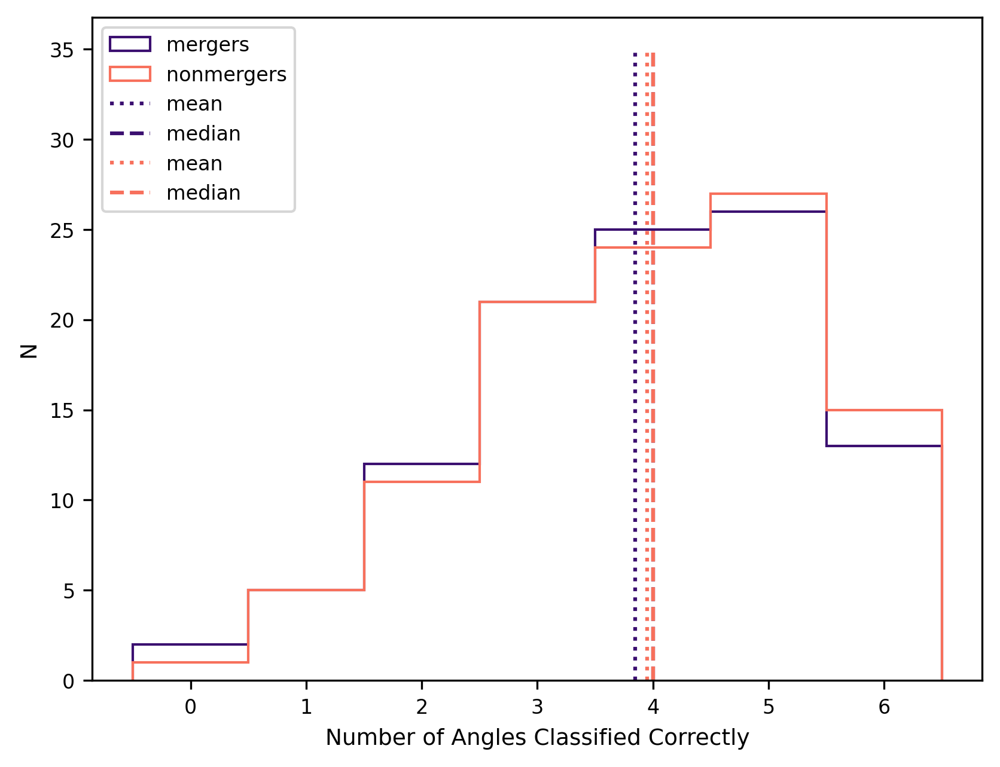

In [68]:
plt.figure()
plt.hist(num_angle_correct[inds], bins = np.arange(-0.5,7,1), histtype='step', color = cmap(0.2), label = 'mergers')
plt.hist(num_angle_correct[~inds], bins = np.arange(-0.5,7,1), histtype='step', color = cmap(0.7), label = 'nonmergers')
plt.vlines(x = np.mean(num_angle_correct[inds]), ymin = 0, ymax = 35, color = cmap(0.2), label = 'mean', linestyle = ':')
plt.vlines(x = np.median(num_angle_correct[inds]), ymin = 0, ymax = 35, color = cmap(0.2), label = 'median', linestyle = '--')
plt.vlines(x = np.mean(num_angle_correct[~inds]), ymin = 0, ymax = 35, color = cmap(0.7), label = 'mean', linestyle = ':')
plt.vlines(x = np.median(num_angle_correct[~inds]), ymin = 0, ymax = 35, color = cmap(0.7), label = 'median', linestyle = '--')
plt.xlabel('Number of Angles Classified Correctly')
plt.ylabel('N')
plt.legend()
plt.show()

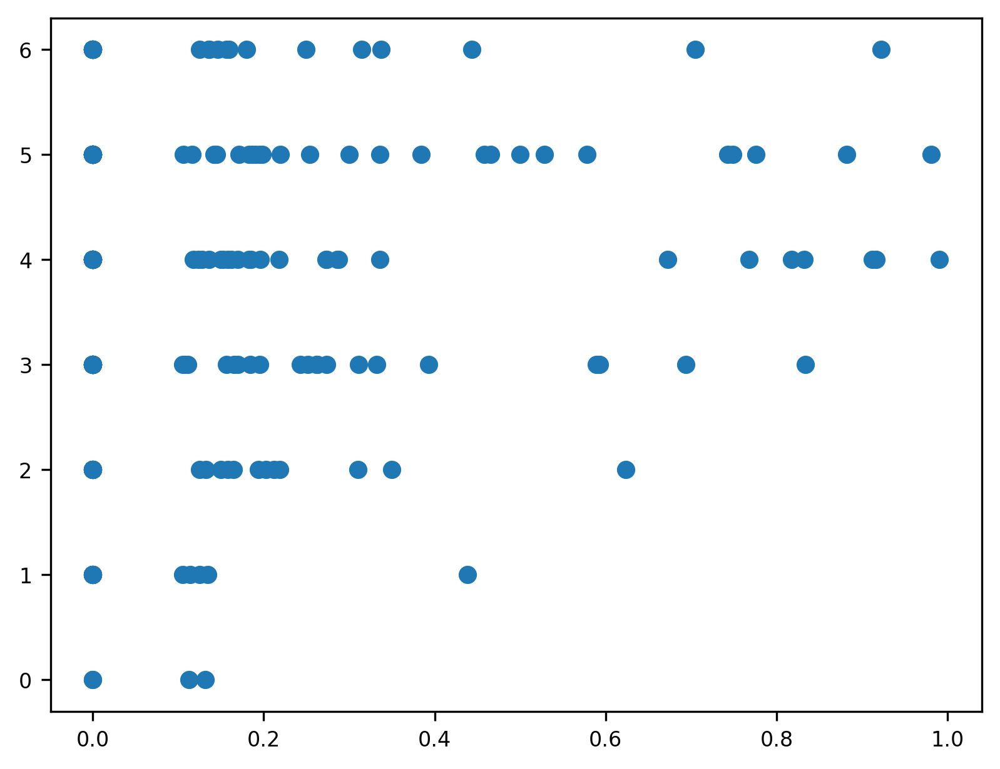

In [69]:
plt.figure()
plt.scatter(mass_ratio, num_angle_correct)
plt.show()

In [70]:
angles_df_q = pd.DataFrame([])
angles_df_q['Number of Angles Correctly Classified'] = num_angle_correct[inds]
angles_df_q['Mass Ratio'] = mass_ratio[inds]

In [71]:
angles_q_ax2_ylabels = []
for c in range(7):
    count = len(angles_df_q[angles_df_q['Number of Angles Correctly Classified'] == c])
    angles_q_ax2_ylabels.append(str(count))

print(angles_q_ax2_ylabels)

['2', '5', '12', '21', '25', '26', '13']


(0.05, 1.05)

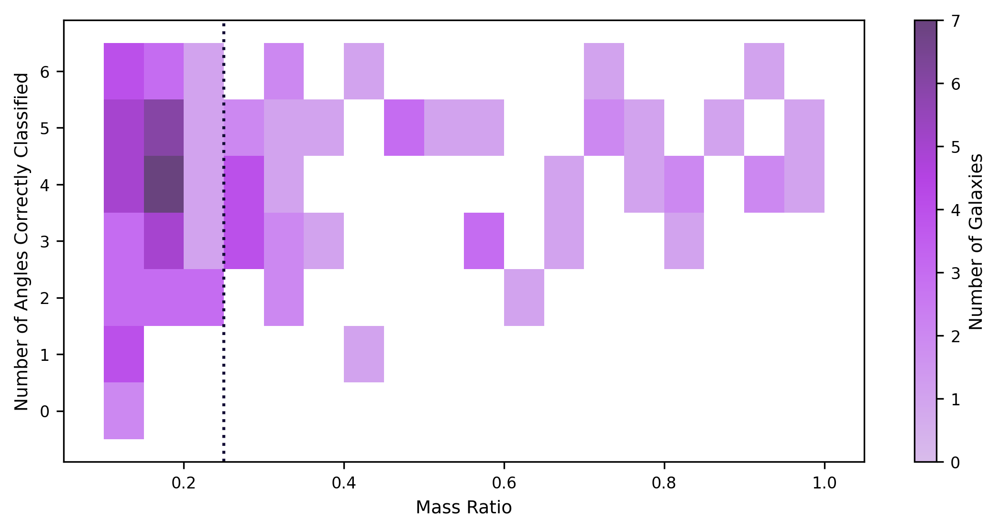

In [72]:
fig, ax = plt.subplots(figsize = (9,4))
#ax.axvspan(xmin = 0.25, xmax= 1, ymin = -1, ymax = 7, alpha = 0.5, color = 'grey')
sns.histplot(data=angles_df_q, x="Mass Ratio", y = "Number of Angles Correctly Classified", 
             bins = (np.arange(0,1.1,0.05), np.arange(-0.5,7,1)), color=cmap(0.3),
             cbar=True, cbar_kws={'label': 'Number of Galaxies'}) #)
ax.axvline(x = 0.25, ymin = 0, ymax = 1, color = cmap(0.1), linestyle=':')

plt.ylim(-.9, 6.9)
plt.xlim(0.05,1.05)

/tmp/ipykernel_2585407/1104540927.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = angles_df_q, x="Mass Ratio", y = "Number of Angles Correctly Classified",


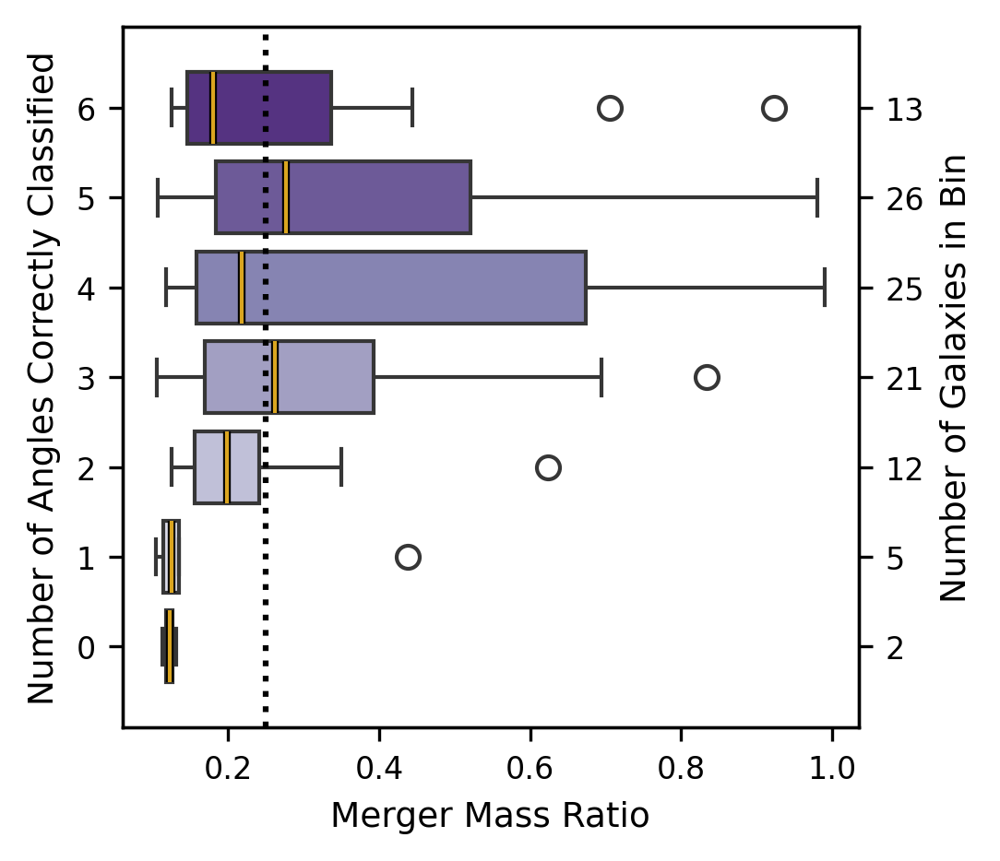

In [73]:
fig, ax = plt.subplots(figsize = (3.5,3), constrained_layout= True)
sns.boxplot(data = angles_df_q, x="Mass Ratio", y = "Number of Angles Correctly Classified", 
            dodge = False, orient = 'h', palette='Purples',
            medianprops={"color": "goldenrod", "linewidth": 1, "zorder": 5,
             "path_effects": [pe.withStroke(linewidth=2, foreground="black")]}

            ).set(xlabel = 'Merger Mass Ratio')
    
            
##medianprops={"color": "white", "linewidth": 2, 'zorder': 5,
ax.axvline(x = 0.25, ymin = 0, ymax = 1, color = 'black', linestyle = ':')
ax.set_xlabel('Merger Mass Ratio') #, fontsize = 'x-large'
ax.set_ylabel("Number of Angles Correctly Classified") # fontsize = 'x-large'
# ax.tick_params(labelsize = 'x-large')
plt.ylim(-.9, 6.9)
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())
ax2.set_yticks(ax.get_yticks())
# ax2.tick_params(axis=u'both', which=u'both',length=0, labelsize = 'x-large')
ax2.set_yticklabels(angles_q_ax2_ylabels)
ax2.set_ylabel('Number of Galaxies in Bin') #, fontsize = 'x-large'
plt.savefig('AnglesCorrect_MassRatio' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()


7
[0.06105277 0.07051293 0.1291544  0.16251596 0.19678509 0.20269249
 0.12942109]
[0.06255093 0.05748448 0.09511277 0.18527232 0.28065532 0.30497352
 0.17202677]
[0.06105277 0.07051293 0.1291544  0.16251596 0.19678509 0.20269249
 0.12942109]
[0. 0. 0. 0. 0. 0. 0.]


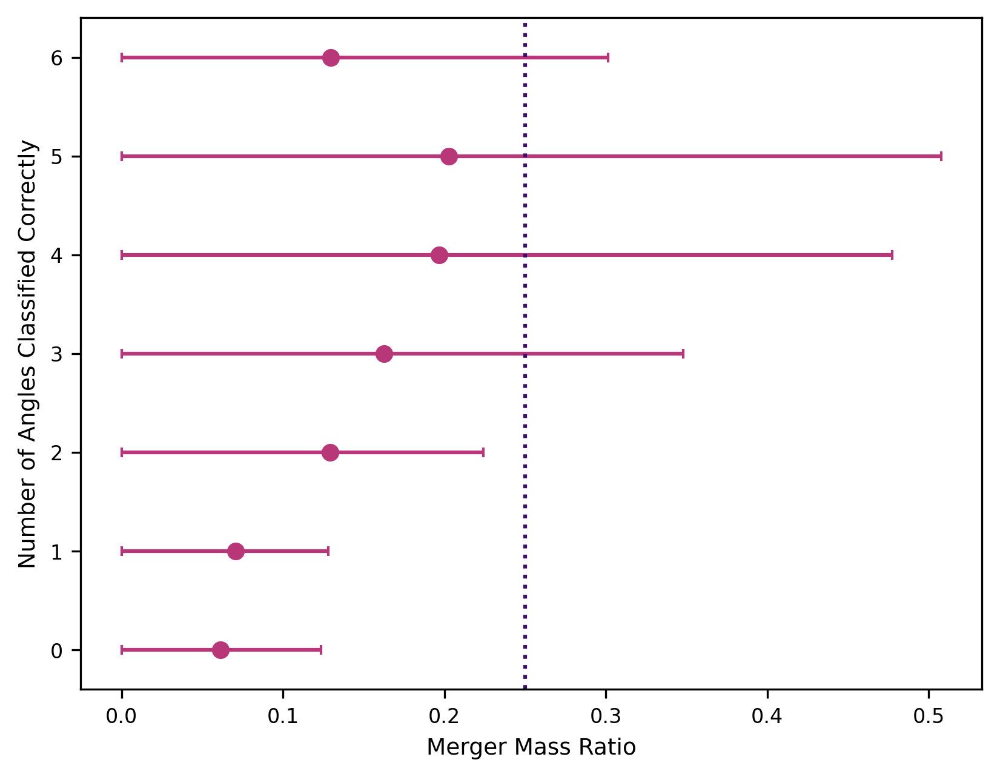

In [74]:

stat, binedges, binnum = binned_statistic(x = num_angle_correct, values = mass_ratio, bins = bins, statistic= 'mean')
print(len(stat))
percentlow, binedges, binnum = binned_statistic(x = num_angle_correct, values = mass_ratio, bins = bins, statistic= lambda mass_ratio:np.percentile(mass_ratio, 16))
percenthigh, binedges, binnum = binned_statistic(x = num_angle_correct, values = mass_ratio, bins = bins, statistic= lambda mass_ratio:np.percentile(mass_ratio, 86))
errlow = stat - percentlow
print(errlow)
errhigh = percenthigh - stat
print(errhigh)
print(stat)
print(percentlow)
plt.figure()
# plt.scatter(num_angle_correct, mass_ratio, s = 10)
# plt.scatter(np.arange(0,7), stat)
plt.errorbar(stat, np.arange(0,7), xerr = (errlow, errhigh), fmt = 'o', color = cmap(0.5), capsize = 2)
plt.vlines(x = 0.25, ymin = -0.5, ymax =7, color = cmap(0.2), linestyle= ':')
plt.ylim(-0.4, 6.4)
plt.xlabel('Merger Mass Ratio')
plt.ylabel('Number of Angles Classified Correctly')
plt.show()

# What is the average number of angles correct based on mass?

In [75]:
num_angle_correct = []
num_angle_correct_nm = []
mass = []
for s in shids:
    s = s.astype(str)
    angle1 = s+'_1'
    angle2 = s+'_2'
    angle3 = s+'_3'
    angle4 = s+'_4'
    angle5 = s+'_5'
    angle6 = s+'_6'
    a1 = ClassificationInfo[ClassificationInfo['Image Name'] == angle1]
    a2 = ClassificationInfo[ClassificationInfo['Image Name'] == angle2]
    a3 = ClassificationInfo[ClassificationInfo['Image Name'] == angle3]
    a4 = ClassificationInfo[ClassificationInfo['Image Name'] == angle4]
    a5 = ClassificationInfo[ClassificationInfo['Image Name'] == angle5]
    a6 = ClassificationInfo[ClassificationInfo['Image Name'] == angle6]
    count = 0
    for a in [a1, a2, a3, a4, a5, a6]:
        if a['Correct?'].values[0] == 'yes':
            count+=1
    num_angle_correct.append(count)
    mass.append(a['Stellar Mass'].values[0])
num_angle_correct = np.array(num_angle_correct) 
mass = np.array(mass)     
print(np.mean(np.array(num_angle_correct)))    
print(np.median(np.array(num_angle_correct)))    
print(np.std(np.array(num_angle_correct)))    

3.8564593301435406
4.0
1.5149869800699178


In [76]:
inds = np.where(mass_ratio != 0.0)[0]

In [77]:
angles_df_sm_mergers = pd.DataFrame([])
angles_df_sm_mergers['Number of Angles Correctly Classified'] = num_angle_correct[inds]
angles_df_sm_mergers['Stellar Mass'] = mass[inds]

angles_df_sm_nonmergers = pd.DataFrame([])
angles_df_sm_nonmergers['Number of Angles Correctly Classified'] = num_angle_correct[~inds]
angles_df_sm_nonmergers['Stellar Mass'] = mass[~inds]

In [78]:
angles_sm_mergers_ax2_ylabels = []
for c in range(7):
    count = len(angles_df_sm_mergers[angles_df_sm_mergers['Number of Angles Correctly Classified'] == c])
    angles_sm_mergers_ax2_ylabels.append(str(count))

print(angles_sm_mergers_ax2_ylabels)

angles_sm_nonmergers_ax2_ylabels = []
for c in range(7):
    count = len(angles_df_sm_nonmergers[angles_df_sm_nonmergers['Number of Angles Correctly Classified'] == c])
    angles_sm_nonmergers_ax2_ylabels.append(str(count))

print(angles_sm_nonmergers_ax2_ylabels)

['2', '5', '12', '21', '25', '26', '13']
['1', '5', '11', '21', '24', '27', '15']


/tmp/ipykernel_2585407/1158797746.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = angles_df_sm_mergers, x="Stellar Mass", y = "Number of Angles Correctly Classified",


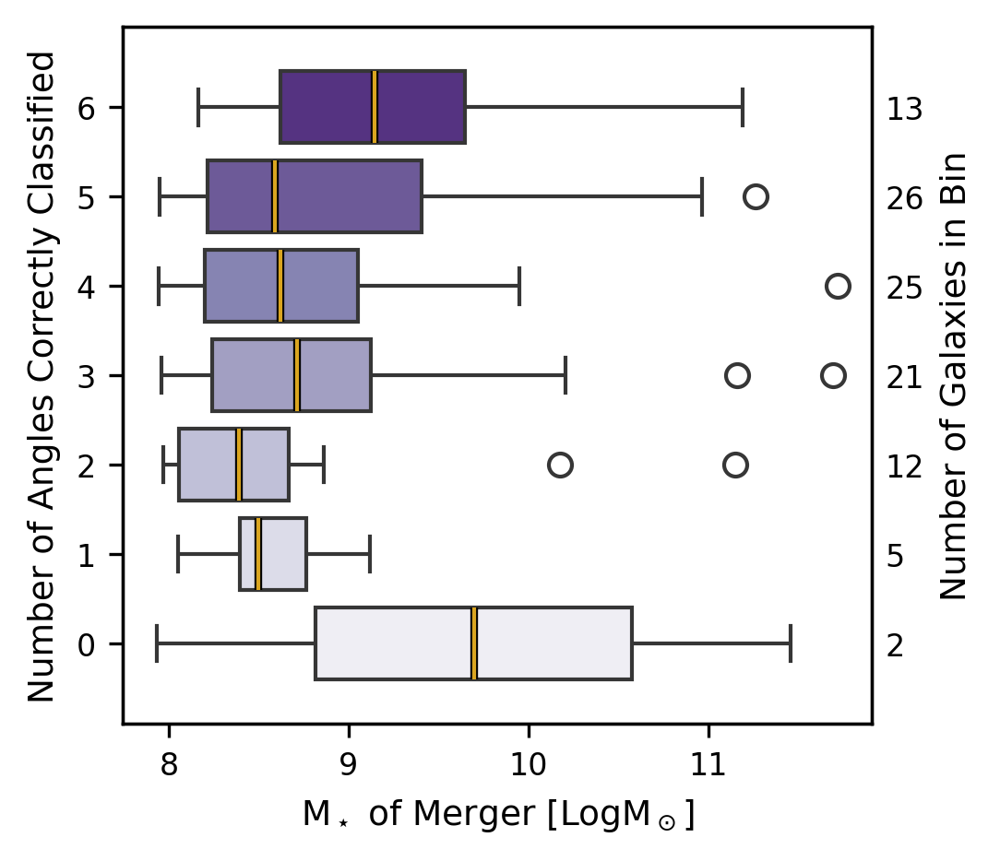

/tmp/ipykernel_2585407/1158797746.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = angles_df_sm_nonmergers, x="Stellar Mass", y = "Number of Angles Correctly Classified",


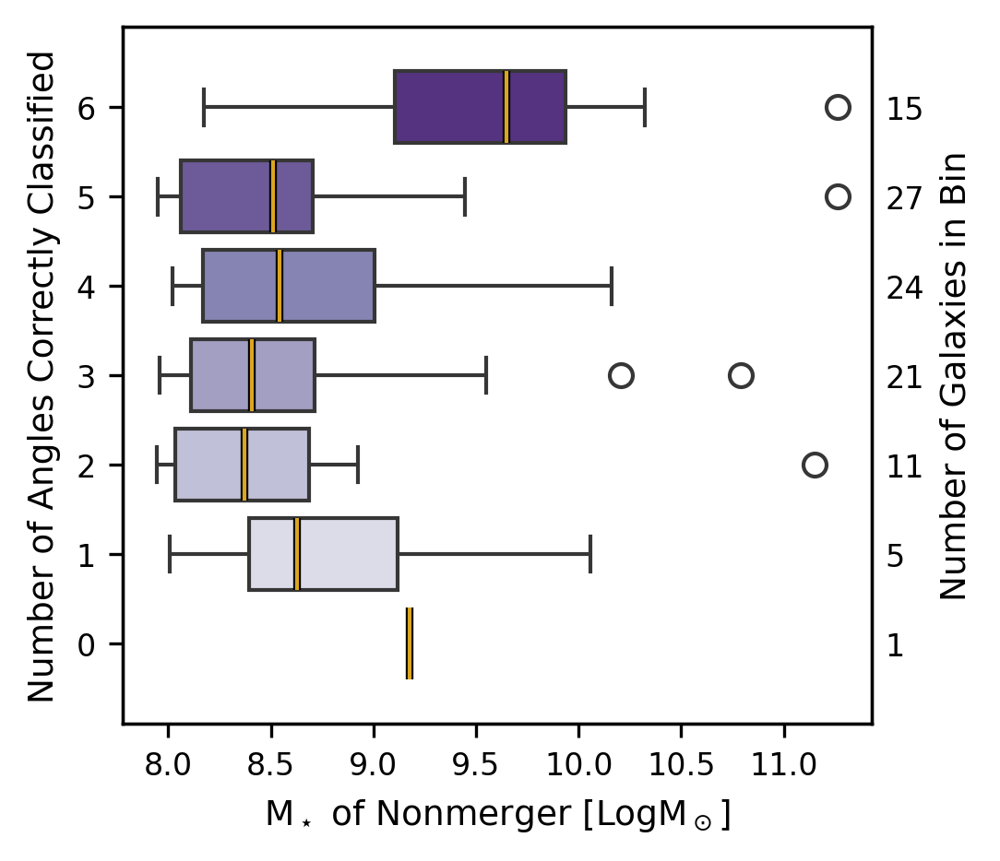

In [79]:
fig, ax = plt.subplots(figsize = (3.5,3), constrained_layout=True)
sns.boxplot(data = angles_df_sm_mergers, x="Stellar Mass", y = "Number of Angles Correctly Classified", 
            dodge = False, orient = 'h', palette='Purples',
            medianprops={"color": "goldenrod", "linewidth": 1, "zorder": 5,
             "path_effects": [pe.withStroke(linewidth=2, foreground="black")]}).set(xlabel = r"M$_\star$ of Merger [LogM$_\odot$]")
plt.ylim(-.9, 6.9)
ax.set_xlabel(r"M$_\star$ of Merger [LogM$_\odot$]") #, fontsize = 'x-large'
ax.set_ylabel("Number of Angles Correctly Classified") #,fontsize = 'x-large'
# ax.tick_params(labelsize = 'x-large')
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())
ax2.set_yticks(ax.get_yticks())
ax2.tick_params(axis=u'both', which=u'both',length=0) #, labelsize = 'x-large'
ax2.set_yticklabels(angles_sm_mergers_ax2_ylabels) #, fontsize = 'x-large'
ax2.set_ylabel('Number of Galaxies in Bin') #, fontsize = 'x-large'
#plt.tight_layout()
plt.savefig('AnglesCorrect_StellarMass_Merger' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()


fig, ax = plt.subplots(figsize = (3.5,3), constrained_layout=True)
sns.boxplot(data = angles_df_sm_nonmergers, x="Stellar Mass", y = "Number of Angles Correctly Classified", 
            dodge = False, orient = 'h', palette='Purples',
            medianprops={"color": "goldenrod", "linewidth": 1, "zorder": 5,
             "path_effects": [pe.withStroke(linewidth=2, foreground="black")]}).set(xlabel = r"M$_\star$ of Nonmerger [LogM$_\odot$]",)
plt.ylim(-.9, 6.9)
ax.set_xlabel(r"M$_\star$ of Nonmerger [LogM$_\odot$]") #, fontsize = 'x-large'
ax.set_ylabel("Number of Angles Correctly Classified") #,fontsize = 'x-large'
# ax.tick_params(labelsize = 'x-large')
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())
ax2.set_yticks(ax.get_yticks())
ax2.tick_params(axis=u'both', which=u'both',length=0) #, labelsize = 'x-large'
ax2.set_yticklabels(angles_sm_nonmergers_ax2_ylabels) #, fontsize = 'x-large'
ax2.set_ylabel('Number of Galaxies in Bin') #, fontsize = 'x-large'
#plt.tight_layout()
plt.savefig('AnglesCorrect_StellarMass_Nonmerger' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()


# What is the average number of angles correct based on SFR?

In [80]:
num_angle_correct = []
num_angle_correct_nm = []
sfr = []
for s in shids:
    s = s.astype(str)
    angle1 = s+'_1'
    angle2 = s+'_2'
    angle3 = s+'_3'
    angle4 = s+'_4'
    angle5 = s+'_5'
    angle6 = s+'_6'
    a1 = ClassificationInfo[ClassificationInfo['Image Name'] == angle1]
    a2 = ClassificationInfo[ClassificationInfo['Image Name'] == angle2]
    a3 = ClassificationInfo[ClassificationInfo['Image Name'] == angle3]
    a4 = ClassificationInfo[ClassificationInfo['Image Name'] == angle4]
    a5 = ClassificationInfo[ClassificationInfo['Image Name'] == angle5]
    a6 = ClassificationInfo[ClassificationInfo['Image Name'] == angle6]
    count = 0
    for a in [a1, a2, a3, a4, a5, a6]:
        if a['Correct?'].values[0] == 'yes':
            count+=1
    num_angle_correct.append(count)
    sfr.append(a['SFR'].values[0])
num_angle_correct = np.array(num_angle_correct) 
sfr = np.array(sfr) 
sfr = np.log10(sfr)    
print(np.mean(np.array(num_angle_correct)))    
print(np.median(np.array(num_angle_correct)))    
print(np.std(np.array(num_angle_correct)))    

3.8564593301435406
4.0
1.5149869800699178


In [81]:
inds = np.where(mass_ratio != 0.0)[0]

In [82]:
angles_df_sfr_mergers = pd.DataFrame([])
angles_df_sfr_mergers['Number of Angles Correctly Classified'] = num_angle_correct[inds]
angles_df_sfr_mergers['SFR'] = sfr[inds]

angles_df_sfr_nonmergers = pd.DataFrame([])
angles_df_sfr_nonmergers['Number of Angles Correctly Classified'] = num_angle_correct[~inds]
angles_df_sfr_nonmergers['SFR'] = sfr[~inds]

In [83]:
angles_sfr_mergers_ax2_ylabels = []
for c in range(7):
    count = len(angles_df_sfr_mergers[angles_df_sfr_mergers['Number of Angles Correctly Classified'] == c])
    angles_sfr_mergers_ax2_ylabels.append(str(count))

print(angles_sfr_mergers_ax2_ylabels)

angles_sfr_nonmergers_ax2_ylabels = []
for c in range(7):
    count = len(angles_df_sfr_nonmergers[angles_df_sfr_nonmergers['Number of Angles Correctly Classified'] == c])
    angles_sfr_nonmergers_ax2_ylabels.append(str(count))

print(angles_sfr_nonmergers_ax2_ylabels)

['2', '5', '12', '21', '25', '26', '13']
['1', '5', '11', '21', '24', '27', '15']


/tmp/ipykernel_2585407/567280130.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = angles_df_sfr_mergers, x="SFR", y = "Number of Angles Correctly Classified",


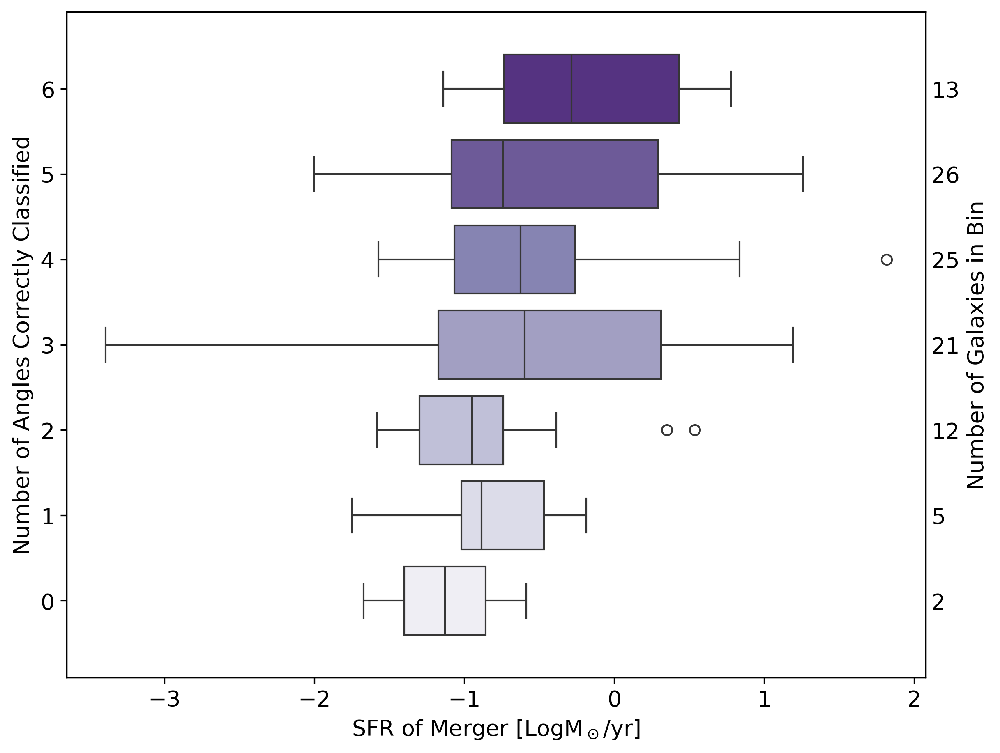

/tmp/ipykernel_2585407/567280130.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = angles_df_sfr_nonmergers, x="SFR", y = "Number of Angles Correctly Classified",


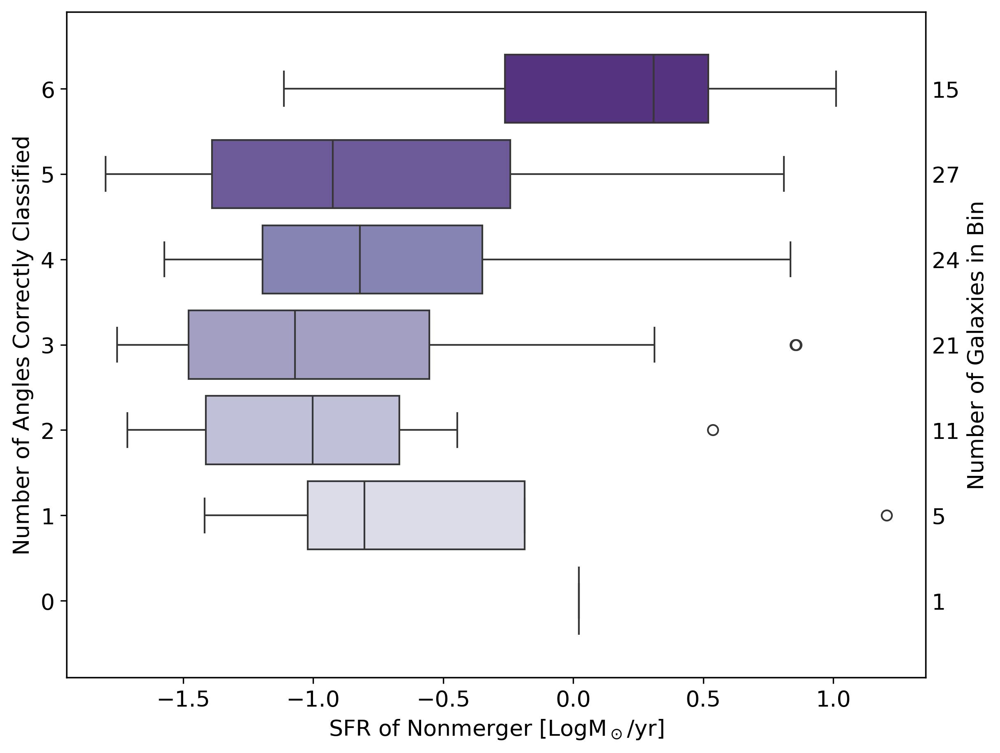

In [84]:
fig, ax = plt.subplots(figsize = (8,6), constrained_layout=True)
sns.boxplot(data = angles_df_sfr_mergers, x="SFR", y = "Number of Angles Correctly Classified", 
            dodge = False, orient = 'h', palette='Purples').set(xlabel = r"SFR of Merger [LogM$_\odot$/yr]")
plt.ylim(-.9, 6.9)
ax.set_xlabel(r"SFR of Merger [LogM$_\odot$/yr]", fontsize = 'x-large')
ax.set_ylabel("Number of Angles Correctly Classified",fontsize = 'x-large')
ax.tick_params(labelsize = 'x-large')
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())
ax2.set_yticks(ax.get_yticks())
ax2.tick_params(axis=u'both', which=u'both',length=0, labelsize = 'x-large')
ax2.set_yticklabels(angles_sfr_mergers_ax2_ylabels, fontsize = 'x-large')
ax2.set_ylabel('Number of Galaxies in Bin', fontsize = 'x-large')
#plt.tight_layout()
plt.savefig('AnglesCorrect_SFR_Merger' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()


fig, ax = plt.subplots(figsize = (8,6), constrained_layout=True)
sns.boxplot(data = angles_df_sfr_nonmergers, x="SFR", y = "Number of Angles Correctly Classified", 
            dodge = False, orient = 'h', palette='Purples').set(xlabel = r"SFR of Nonmerger [LogM$_\odot$/yr]",)
plt.ylim(-.9, 6.9)
ax.set_xlabel(r"SFR of Nonmerger [LogM$_\odot$/yr]", fontsize = 'x-large')
ax.set_ylabel("Number of Angles Correctly Classified",fontsize = 'x-large')
ax.tick_params(labelsize = 'x-large')
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())
ax2.set_yticks(ax.get_yticks())
ax2.tick_params(axis=u'both', which=u'both',length=0, labelsize = 'x-large')
ax2.set_yticklabels(angles_sfr_nonmergers_ax2_ylabels, fontsize = 'x-large')
ax2.set_ylabel('Number of Galaxies in Bin', fontsize = 'x-large')
#plt.tight_layout()
plt.savefig('AnglesCorrect_SFR_Nonmerger' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()


now go see what their grad cams look like

# SNS jointplot

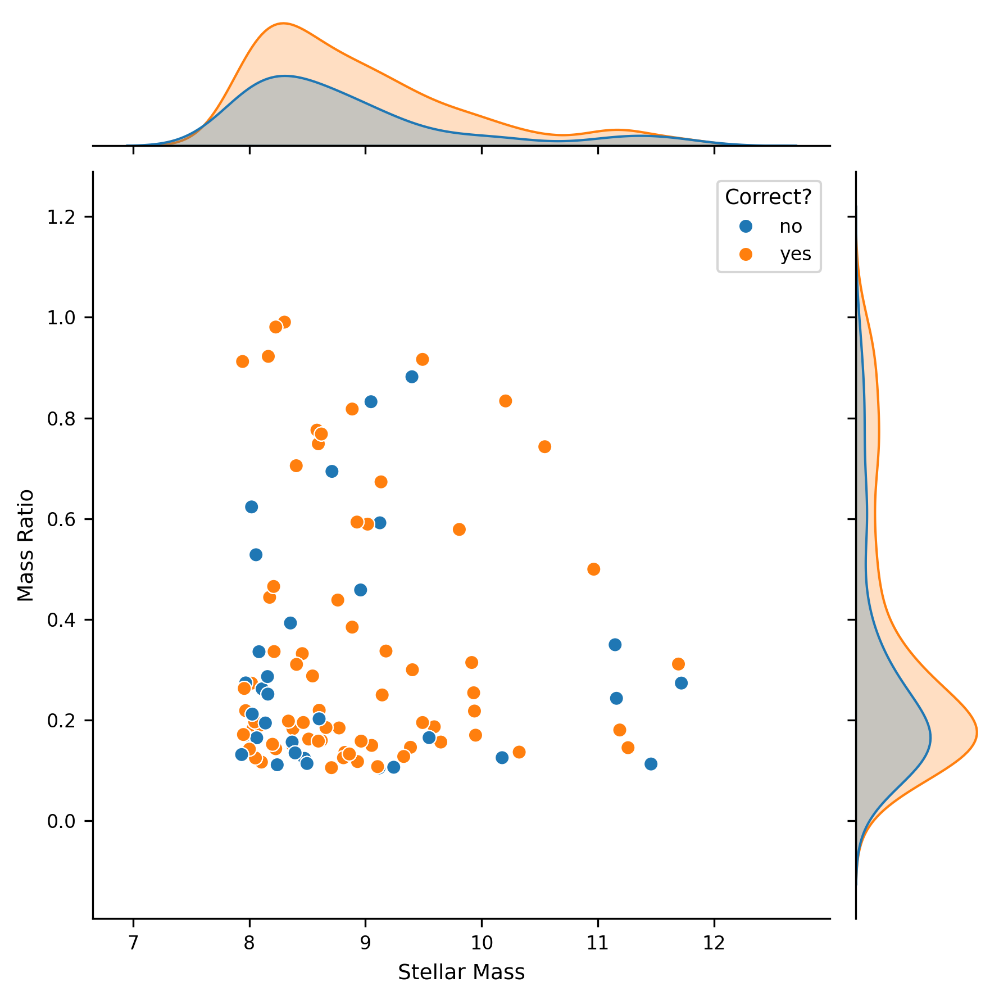

In [85]:
sns.jointplot(data=ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0], x="Stellar Mass", y="Mass Ratio", hue="Correct?")


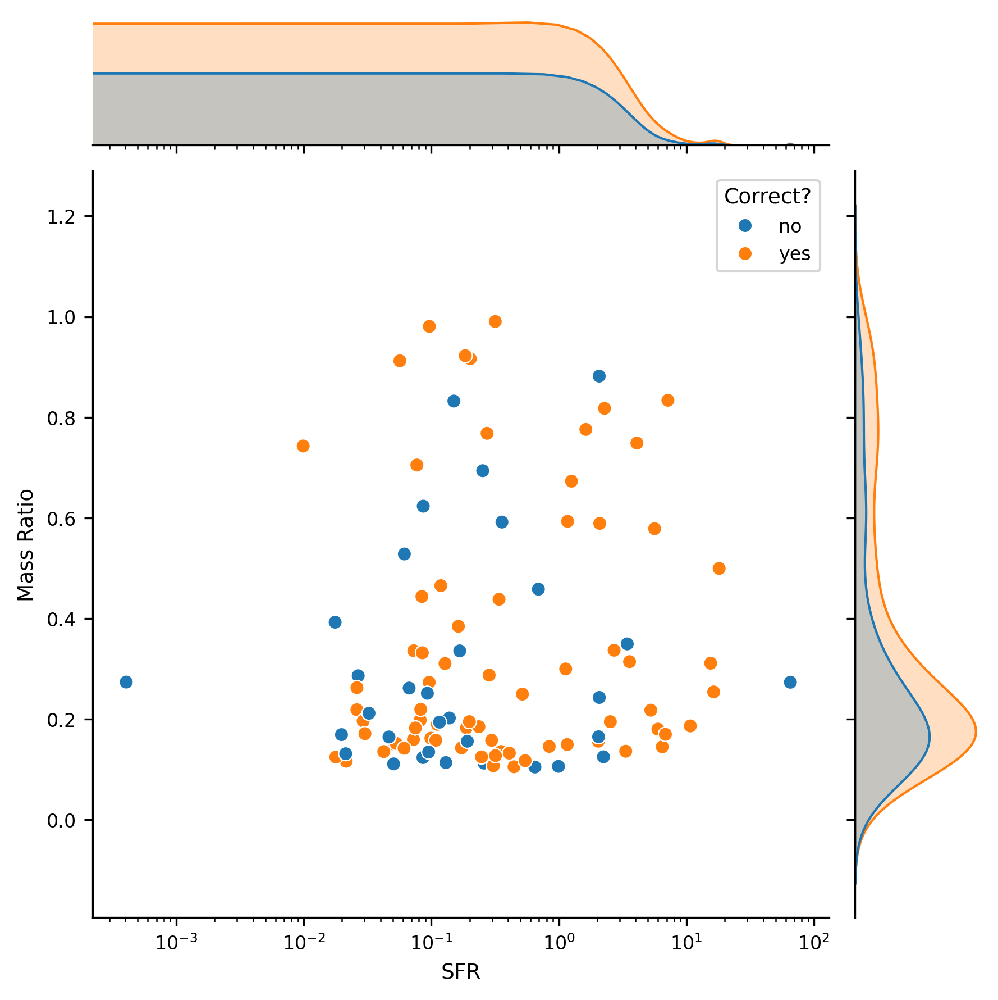

In [86]:
sns.jointplot(data=ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0], x="SFR", y="Mass Ratio", hue="Correct?").ax_joint.set_xscale('log')


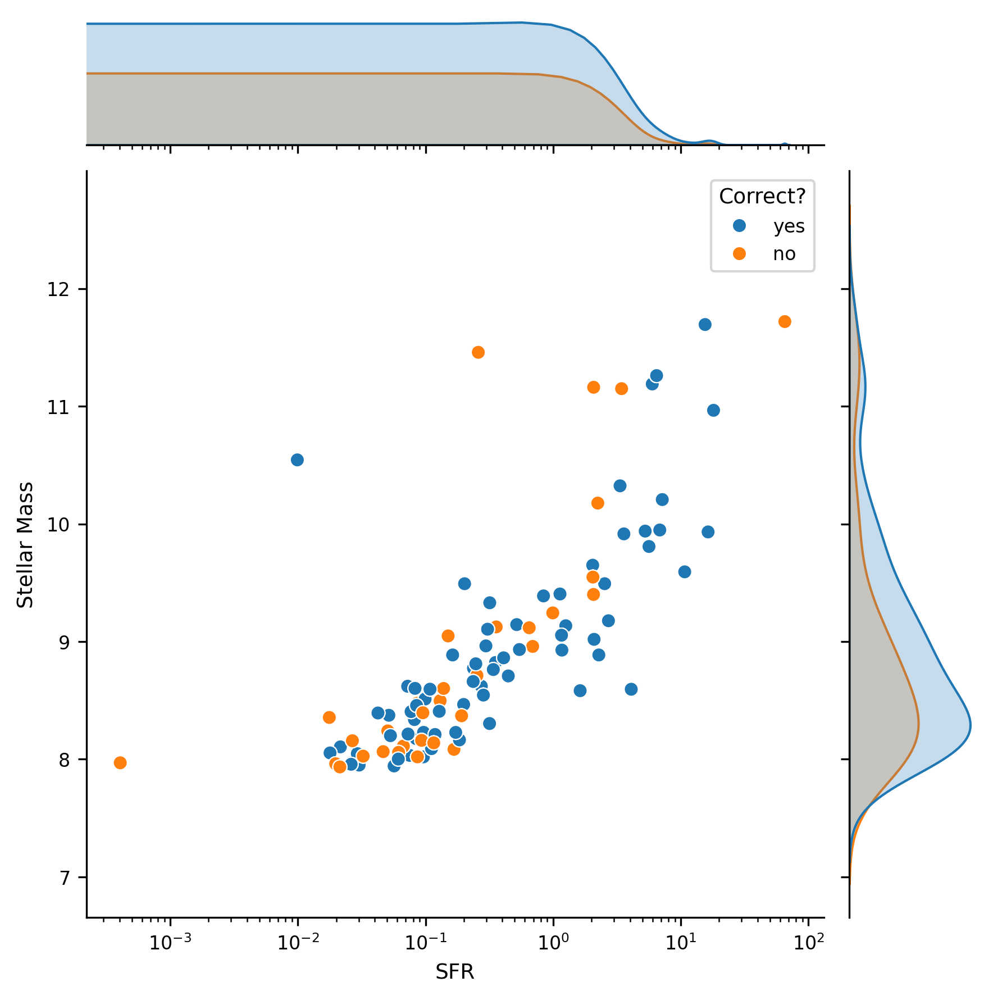

In [87]:
sns.jointplot(data=ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0], x="SFR", y="Stellar Mass", hue="Correct?", hue_order = ['yes', 'no']).ax_joint.set_xscale('log')


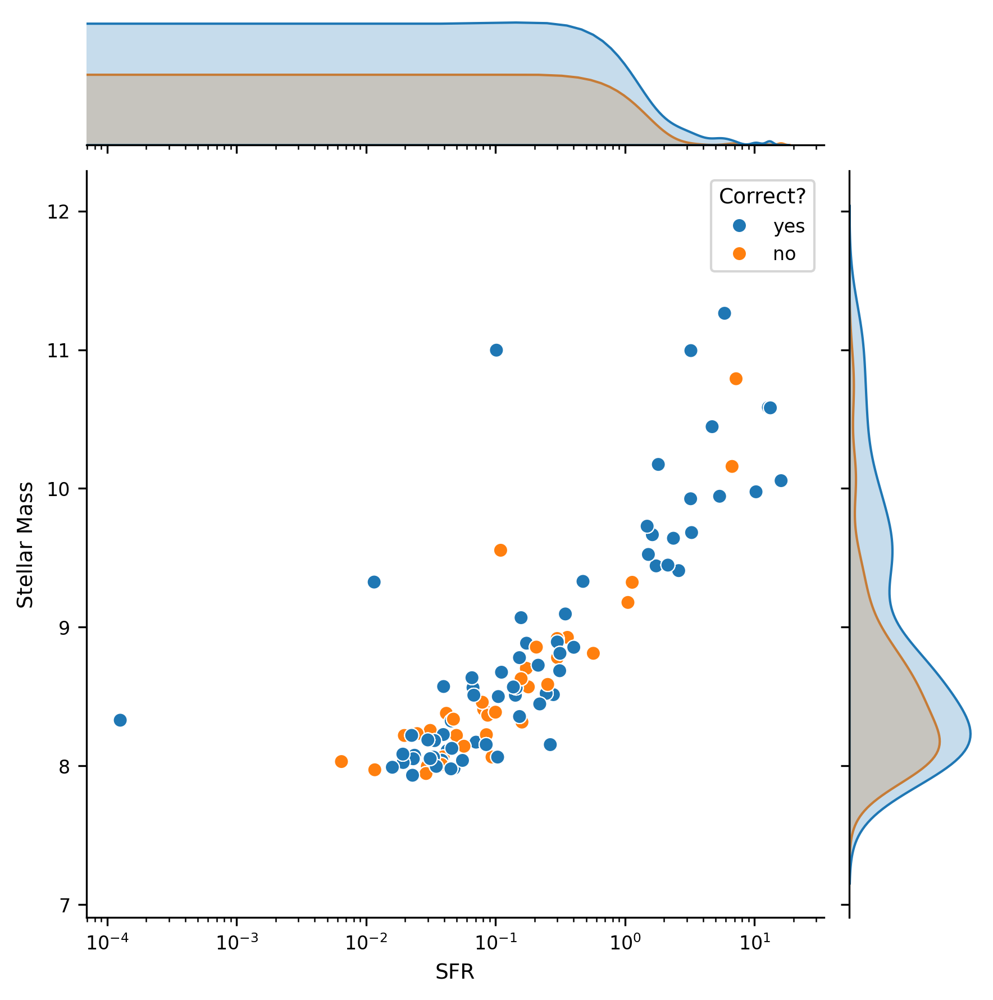

In [88]:
sns.jointplot(data=ClassificationInfo[ClassificationInfo['Mass Ratio']== 0.0], x="SFR", y="Stellar Mass", hue="Correct?", hue_order = ['yes', 'no']).ax_joint.set_xscale('log')


# SFR with right or wrong

In [89]:
cmap = matplotlib.colormaps['magma']

mergers_color = cmap(0.2)
nonmergers_color = cmap(0.7)
nonmergers_color_wrong = cmap(0.65)
nonmergers_line = cmap(0.55)

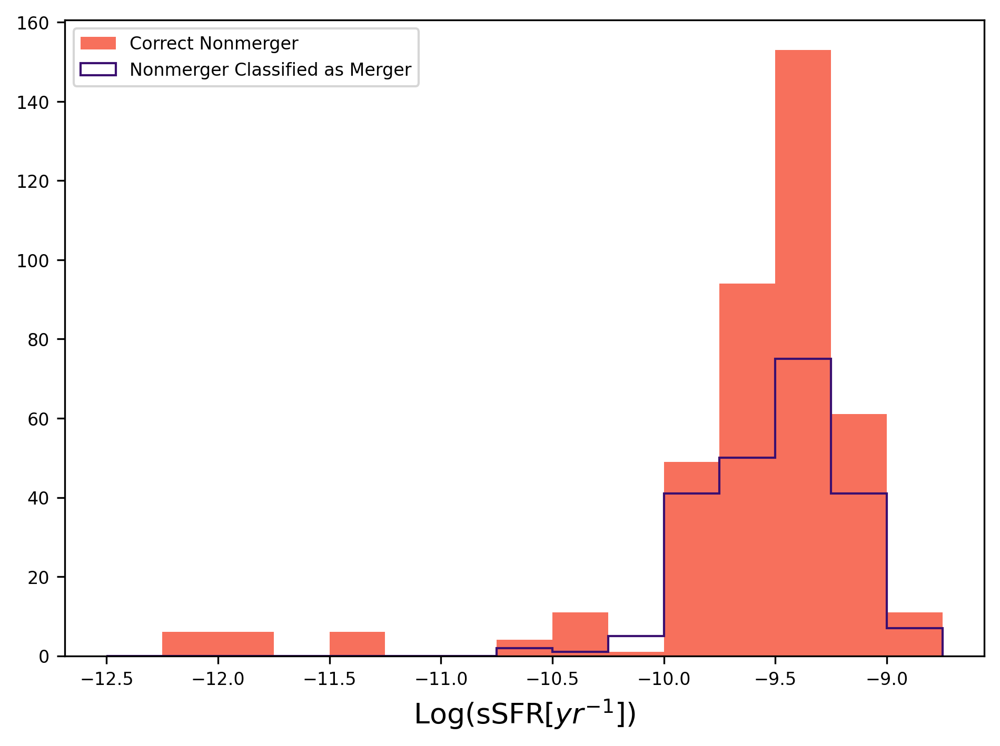

In [90]:
nonmerger_sfr = ClassificationInfo[ClassificationInfo['Mass Ratio']== 0.0]['SFR']
nonmerger_mass = ClassificationInfo[ClassificationInfo['Mass Ratio']== 0.0]['Stellar Mass']
nonmerger_mass = 10**nonmerger_mass
nonmerger_ssfr = nonmerger_sfr/nonmerger_mass

nonmerger_sfr_correct = nonmerger_sfr[ClassificationInfo['Correct?'] == 'yes']
nonmerger_sfr_incorrect = nonmerger_sfr[ClassificationInfo['Correct?'] == 'no']

nonmerger_ssfr_correct = nonmerger_ssfr[ClassificationInfo['Correct?'] == 'yes']
nonmerger_ssfr_incorrect = nonmerger_ssfr[ClassificationInfo['Correct?'] == 'no']

plt.figure()
plt.hist(np.log10(nonmerger_ssfr_correct), color = nonmergers_color, bins = np.arange(-12.5, -8.5, 0.25), label = 'Correct Nonmerger')
plt.hist(np.log10(nonmerger_ssfr_incorrect), color = mergers_color, histtype = 'step', bins = np.arange(-12.5, -8.5, 0.25), label = 'Nonmerger Classified as Merger')
plt.xlabel(r'Log(sSFR[$yr^{-1}$])', fontsize = 'x-large')
plt.legend()
plt.tight_layout()

plt.show()
#ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0]

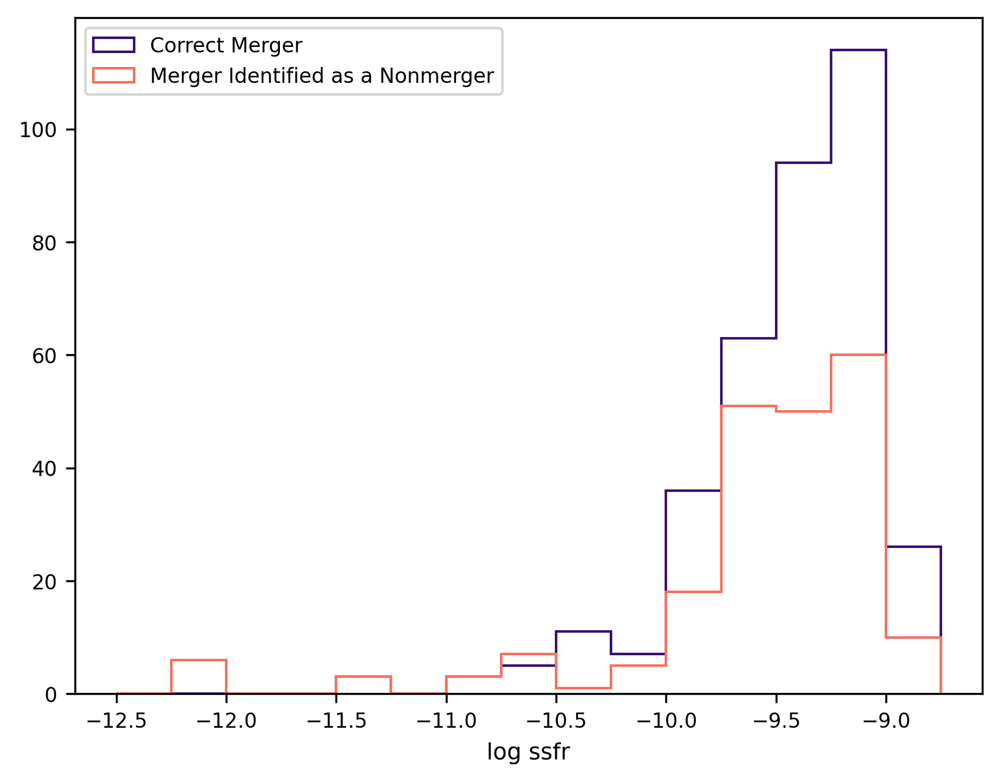

In [91]:
merger_sfr = ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0]['SFR']
merger_mass = ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0]['Stellar Mass']
merger_mass = 10**merger_mass
merger_ssfr = merger_sfr/merger_mass

merger_sfr_correct = merger_sfr[ClassificationInfo['Correct?'] == 'yes']
merger_sfr_incorrect = merger_sfr[ClassificationInfo['Correct?'] == 'no']

merger_ssfr_correct = merger_ssfr[ClassificationInfo['Correct?'] == 'yes']
merger_ssfr_incorrect = merger_ssfr[ClassificationInfo['Correct?'] == 'no']

plt.figure()
plt.hist(np.log10(merger_ssfr_correct), color = mergers_color, histtype = 'step', bins = np.arange(-12.5, -8.5, 0.25), label = 'Correct Merger')
plt.hist(np.log10(merger_ssfr_incorrect), color = nonmergers_color, histtype = 'step', bins = np.arange(-12.5, -8.5, 0.25), label = 'Merger Identified as a Nonmerger')
plt.xlabel('log ssfr')
plt.legend()
plt.show()
#ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0]

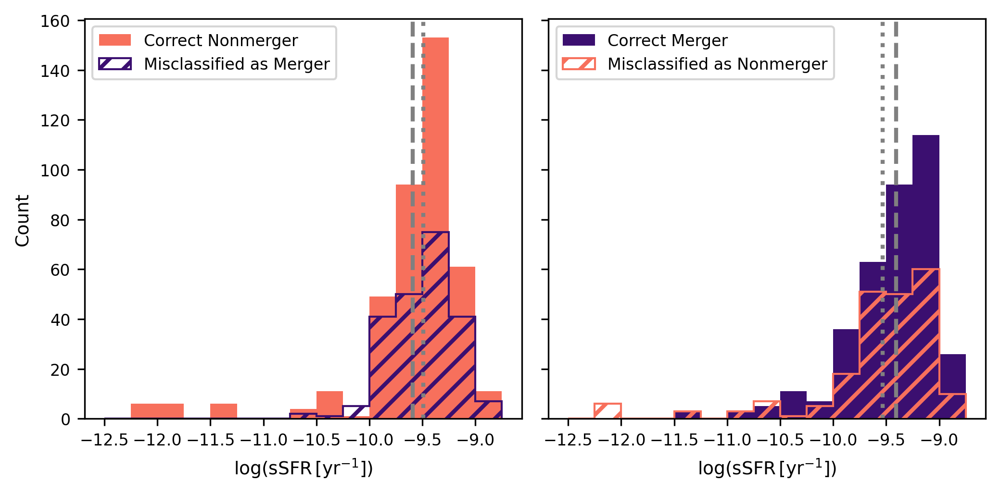

In [92]:
plt.rcParams['hatch.linewidth'] = 2.0 
fig, axes = plt.subplots(1, 2, figsize=(7,3.5), sharey=True)  # 2 columns, 1 row

# Panel 1: Nonmergers
axes[0].hist(np.log10(nonmerger_ssfr_correct), color=nonmergers_color, 
             bins=np.arange(-12.5, -8.5, 0.25), label='Correct Nonmerger')
axes[0].hist(np.log10(nonmerger_ssfr_incorrect), color=mergers_color,
             histtype='step', hatch='//', bins=np.arange(-12.5, -8.5, 0.25), label='Misclassified as Merger')
axes[0].axvline(np.mean(np.log10(nonmerger_ssfr_correct)), color = 'grey', linestyle = '--', linewidth = 2)
axes[0].axvline(np.mean(np.log10(nonmerger_ssfr_incorrect)), color = 'grey', linestyle = ':', linewidth = 2)
axes[0].set_xlabel(r'$\log(\mathrm{sSFR}\,[\mathrm{yr}^{-1}])$') #, fontsize='x-large'
axes[0].set_ylabel('Count') #, fontsize='x-large'
axes[0].legend( loc = 'upper left') #fontsize='medium',

# Panel 2: Mergers
axes[1].hist(np.log10(merger_ssfr_correct), color=mergers_color,  
             bins=np.arange(-12.5, -8.5, 0.25), label='Correct Merger')
axes[1].hist(np.log10(merger_ssfr_incorrect), color=nonmergers_color, histtype = 'step', hatch = '//',
             bins=np.arange(-12.5, -8.5, 0.25), label='Misclassified as Nonmerger')
axes[1].axvline(np.mean(np.log10(merger_ssfr_incorrect)), color = 'grey', linestyle = ':', linewidth =2)
axes[1].axvline(np.mean(np.log10(merger_ssfr_correct)), color = 'grey', linestyle = '--', linewidth = 2)

axes[1].set_xlabel(r'$\log(\mathrm{sSFR}\,[\mathrm{yr}^{-1}])$') #, fontsize='x-large'
axes[1].legend( loc = 'upper left') #fontsize='medium',


# Adjust layout
plt.tight_layout()
plt.savefig('ssfr_rightandwrong.png', dpi=300, bbox_inches='tight')
plt.show()

# Calibration Error

## Brier Score

In [93]:
brier = brier_score_loss(y_true = all_labels, y_proba = all_probabilities[:,1], pos_label = 1)
print(brier)

0.22357529779683724


## Expected Calibration Error

In [94]:
#confidences = probabiliies (I think we use all_probabilities here)
print(all_probabilities)
print(np.min(all_probabilities))
print(type(all_labels[0]))

[[0.3271597  0.6728403 ]
 [0.7900533  0.2099467 ]
 [0.4748066  0.52519345]
 ...
 [0.5148981  0.48510185]
 [0.49393538 0.50606465]
 [0.6943856  0.30561435]]
0.04797001
<class 'numpy.int64'>


In [95]:
#https://towardsdatascience.com/expected-calibration-error-ece-a-step-by-step-visual-explanation-with-python-code-c3e9aa12937d/
def ECE(samples, labels, numbins = 10):
    # uniform binning approach with M number of bins
    bin_boundaries = np.linspace(0, 1, numbins + 1)
    bin_lowers = bin_boundaries[:-1]
    bin_uppers = bin_boundaries[1:]
    
    # get max probability per sample i
    confidences = np.max(samples, axis=1)
    # get predictions from confidences (positional in this case)
    predicted_label = np.argmax(samples, axis=1)
    
    # get a boolean list of correct/false predictions
    accuracies = predicted_label==labels

    ece = np.zeros(1)
    bin_accs = []
    bin_confs = []
    bin_nums = [] 
    for bin_lower, bin_upper in zip(bin_lowers, bin_uppers):
        # determine if sample is in bin m (between bin lower &amp; upper)
        in_bin = np.logical_and(confidences > bin_lower.item(), confidences <= bin_upper.item())
        nums= in_bin.sum()
        # can calculate the empirical probability of a sample falling into bin m: (|Bm|/n)
        prob_in_bin = in_bin.mean()

        if prob_in_bin.item() > 0:
            bin_nums.append(nums)
            # get the accuracy of bin m: acc(Bm)
            accuracy_in_bin = accuracies[in_bin].mean()
            bin_accs.append(accuracy_in_bin)
            # get the average confidence of bin m: conf(Bm)
            avg_confidence_in_bin = confidences[in_bin].mean()
            bin_confs.append(avg_confidence_in_bin)
            # calculate |acc(Bm) - conf(Bm)| * (|Bm|/n) for bin m and add to the total ECE
            ece += np.abs(avg_confidence_in_bin - accuracy_in_bin) * prob_in_bin
        else:
            bin_accs.append(np.nan)
            bin_confs.append(np.nan)
            bin_nums.append(np.nan)
    return ece, np.array(bin_accs), np.array(bin_confs), bin_nums

In [96]:
ece, accs, confs, nums = ECE(all_probabilities, all_labels)
gap = confs - accs
print(ece)

[0.03249877]


In [97]:
print(nums)

[nan, nan, nan, nan, nan, 485, 374, 224, 124, 47]


In [98]:
print(accs)

bin_boundaries = np.linspace(0, 1, 10 + 1)
bin_lowers = bin_boundaries[:-1]
bin_uppers = bin_boundaries[1:]

bin_centers = ((bin_uppers - bin_lowers) /2) + bin_boundaries[:-1]
print(bin_centers)

[       nan        nan        nan        nan        nan 0.57319588
 0.62566845 0.70535714 0.75806452 0.89361702]
[0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95]


In [99]:
print(gap)

[        nan         nan         nan         nan         nan -0.02300447
  0.02167668  0.04148065  0.08825522  0.02667869]


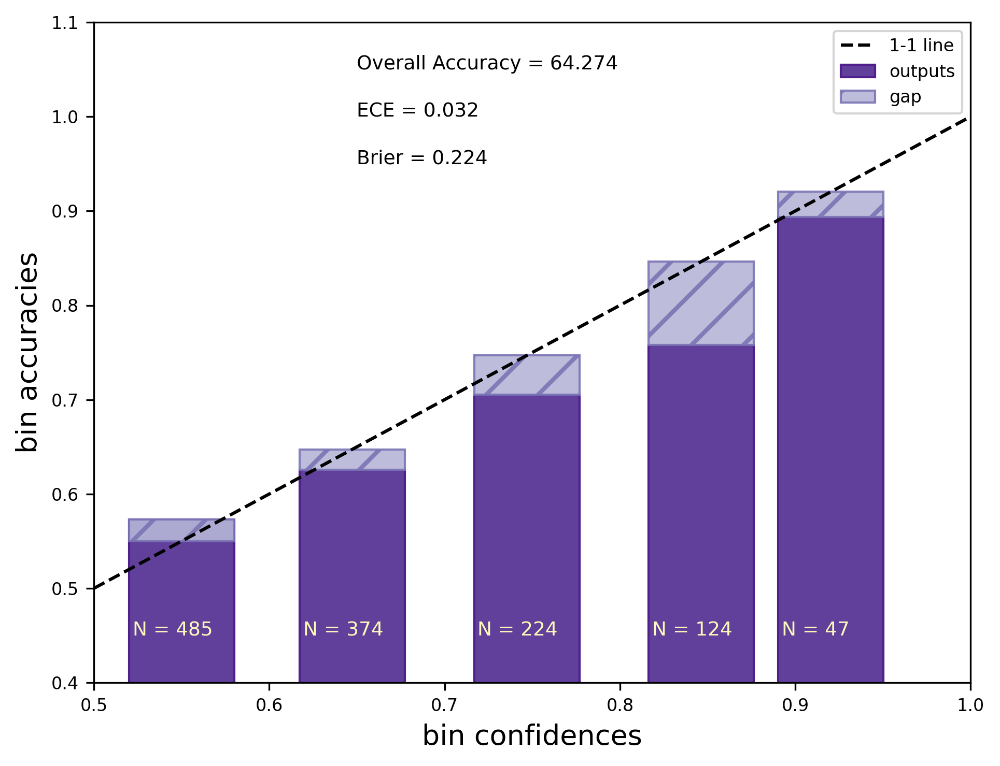

In [100]:
purples = matplotlib.colormaps['Purples']
fig, ax = plt.subplots(figsize=(width*2, height*2))
plt.bar(confs, accs, width = 0.06, edgecolor = purples(0.9), color = purples(0.8), label = 'outputs')
plt.bar(confs, gap, bottom = accs, width = 0.06, hatch = '/', edgecolor = purples(0.65), color = purples(0.4), label = 'gap', alpha = 0.9)
ax.axline((0, 0), slope=1, color='k', linestyle='--', label='1-1 line')
plt.xlabel('bin confidences', fontsize = 'x-large')
plt.ylabel('bin accuracies', fontsize = 'x-large')
#plt.title(CNNName)
plt.ylim(0.4,1.1)
plt.xlim(0.5,1)
ax.annotate(text = 'Overall Accuracy = ' + str(np.round(test_accuracy,3)), xy = (0.65, 1.05))
ax.annotate(text = 'ECE = ' + str(np.round(ece[0],3)), xy = (0.65, 1))
ax.annotate(text = 'Brier = ' + str(np.round(brier,3)), xy = (0.65, 0.95))
for i in range(len(nums)):
    ax.annotate(text = 'N = ' +str(nums[i]), xy = (confs[i]-0.028, 0.45), color = cmap(0.99))
plt.legend()
plt.tight_layout()
plt.savefig('ECE_' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()

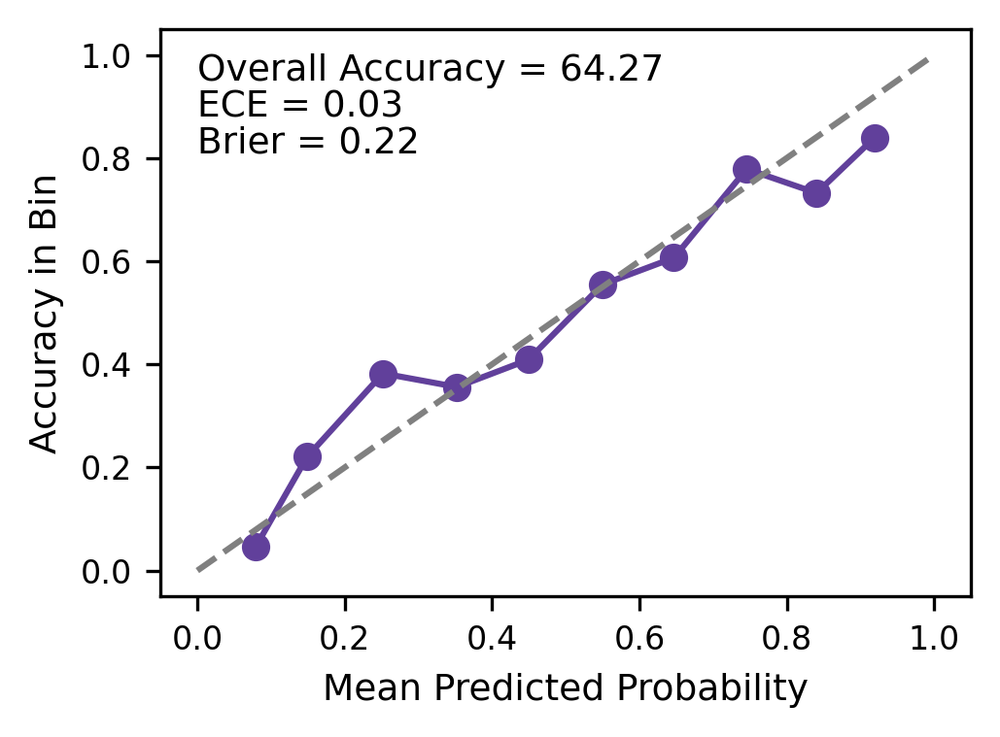

In [101]:
# Compute calibration curve
prob_true, prob_pred = calibration_curve(all_labels, all_probabilities[:, 1], n_bins=10, strategy='uniform', pos_label = 1)
#print(prob_true)
# Plot
plt.figure(figsize=(3.5, 2.6))
plt.plot(prob_pred, prob_true, marker='o', color = purples(0.8))
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('Mean Predicted Probability') #, fontsize = 'x-large'
plt.ylabel('Accuracy in Bin') #, fontsize = 'x-large'
plt.annotate(text = 'Overall Accuracy = ' + str(np.round(test_accuracy,2)), xy = (0, 0.95))
plt.annotate(text = 'ECE = ' + str(np.round(ece[0],2)), xy = (0, 0.88))
plt.annotate(text = 'Brier = ' + str(np.round(brier,2)), xy = (0, 0.81))
plt.tight_layout()
plt.savefig('CalibrationCurve.png', dpi = 300)
plt.show()

## Brier Score

# Sort Grad-CAMs

In [102]:
# to find patterns we want to look at specific grad cams at a time
# gradcam_filenames = glob.glob('/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/*.png')
#gradcam_filenames[0][110:-4] this gets just the image name!

In [103]:
# gradcam_filenames[0]

In [104]:
# major = ClassificationInfo[ClassificationInfo['Ratio Name'] == 'major']
# minor = ClassificationInfo[ClassificationInfo['Ratio Name'] == 'minor']
# non = ClassificationInfo[ClassificationInfo['Ratio Name'] == 'non']
# allmergers = ClassificationInfo[ClassificationInfo['Mass Ratio'] != 0.0]
# lowmass = ClassificationInfo[ClassificationInfo['Stellar Mass'] <= 9.5]
# highmass = ClassificationInfo[ClassificationInfo['Stellar Mass'] > 9.5]
# firstprogs = ClassificationInfo[ClassificationInfo['Type'] == 'first_progenitor']
# nextprogs = ClassificationInfo[ClassificationInfo['Type'] == 'next_progenitor']
# merger = ClassificationInfo[ClassificationInfo['Type'] == 'Merger']
# descs = ClassificationInfo[ClassificationInfo['Type'] == 'Descendant']

# earlymergers = pd.concat((firstprogs, nextprogs))
# latemergers = pd.concat((merger, descs))

In [105]:
# gradcam_sourcepath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/gradcam_test_image_'

# gradcam_minorpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/gradcam_sorted_by_types/minor/gradcam_test_image_'
# for minmerg in minor['Image Name']:
#     #print(minmerg)
#     shutil.copy(gradcam_sourcepath + minmerg + '.png', gradcam_minorpath + minmerg + '.png')

# gradcam_majorpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/gradcam_sorted_by_types/major/gradcam_test_image_'
# for majmerg in major['Image Name']:
#     #print(minmerg)
#     shutil.copy(gradcam_sourcepath + majmerg + '.png', gradcam_majorpath + majmerg + '.png')

# gradcam_lowpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/gradcam_sorted_by_types/lowmass/gradcam_test_image_'
# for low in lowmass['Image Name']:
#     #print(low)
#     shutil.copy(gradcam_sourcepath + low + '.png', gradcam_lowpath + low + '.png')

# gradcam_highpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/gradcam_sorted_by_types/highmass/gradcam_test_image_'
# for high in highmass['Image Name']:
#     #print(minmerg)
#     shutil.copy(gradcam_sourcepath + high + '.png', gradcam_highpath + high + '.png')

# gradcam_earlypath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/gradcam_sorted_by_types/earlymergers/gradcam_test_image_'
# for early in earlymergers['Image Name']:
#     #print(early)
#     shutil.copy(gradcam_sourcepath + early + '.png', gradcam_earlypath + early + '.png')

# gradcam_latepath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/gradcam_sorted_by_types/latemergers/gradcam_test_image_'
# for late in latemergers['Image Name']:
#     #print(late)
#     shutil.copy(gradcam_sourcepath + late + '.png', gradcam_latepath + late + '.png')
    
# gradcam_allpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/gradcam_sorted_by_types/allmergers/gradcam_test_image_'
# for allmerg in allmergers['Image Name']:
#     #print(allmerg)
#     shutil.copy(gradcam_sourcepath + allmerg + '.png', gradcam_allpath + allmerg + '.png')

# gradcam_nonpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/nonmergers/gradcam_test_image_'
# for nonmerg in non['Image Name']:
#     #print(nonmerg)
#     shutil.copy(gradcam_sourcepath + nonmerg + '.png', gradcam_nonpath + nonmerg + '.png')

In [106]:
# high_major = major[major['Stellar Mass'] > 9.5]
# high_minor = minor[minor['Stellar Mass'] > 9.5]
# low_major = major[major['Stellar Mass'] <= 9.5]
# low_minor = minor[minor['Stellar Mass'] <= 9.5]

# high_merger = pd.concat((high_major, high_minor))
# low_merger = pd.concat((low_major, low_minor))

In [107]:
# gradcam_lowminorpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/lowmass+minor/gradcam_test_image_'
# for lowmin in low_minor['Image Name']:
#     #print(minmerg)
#     shutil.copy(gradcam_sourcepath + lowmin + '.png', gradcam_lowminorpath + lowmin + '.png')

# gradcam_lowmajorpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/lowmass+major/gradcam_test_image_'
# for lowmaj in low_major['Image Name']:
#     #print(majmerg)
#     shutil.copy(gradcam_sourcepath + lowmaj + '.png', gradcam_lowmajorpath + lowmaj + '.png')

# gradcam_highminorpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/highmass+minor/gradcam_test_image_'
# for highmin in high_minor['Image Name']:
#     #print(minmerg)
#     shutil.copy(gradcam_sourcepath + highmin + '.png', gradcam_highminorpath + highmin + '.png')

# gradcam_highmajorpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/highmass+major/gradcam_test_image_'
# for highmaj in high_major['Image Name']:
#     #print(majmerg)
#     shutil.copy(gradcam_sourcepath + highmaj + '.png', gradcam_highmajorpath + highmaj + '.png')

# gradcam_lowmergerpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/lowmass+merger/gradcam_test_image_'
# for lowmerg in low_merger['Image Name']:
#     #print(mergmerg)
#     shutil.copy(gradcam_sourcepath + lowmerg + '.png', gradcam_lowmergerpath + lowmerg + '.png')

# gradcam_highmergerpath = '/n/home09/aschechter/code/BinaryCNNTesting/PytorchCNNs/gradcam/Adam_Cyclic/test/bothlabels/highmass+merger/gradcam_test_image_'
# for highmerg in high_merger['Image Name']:
#     #print(mergmerg)
#     shutil.copy(gradcam_sourcepath + highmerg + '.png', gradcam_highmergerpath + highmerg + '.png')


# Feature Activation

In [108]:
# # Choose a convolutional layer to visualize
# activation = {}
# def get_activation(name):
#     def hook(model, input, output):
#         activation[name] = output.detach()
#     return hook

# # Hook into layer — for ResNet18 you might try:
# model.layer1[0].conv1.register_forward_hook(get_activation('conv1'))

# # Prepare your input

# image_tensor = test_dataloader.dataset[0][0].unsqueeze(0).to(device).float()  # shape: [1, C, H, W]

# # Forward pass
# output = model(image_tensor)

# # Get activations
# act = activation['conv1'].squeeze()  # shape: [num_features, H, W]

# # Plot first 8 activation maps
# fig, axes = plt.subplots(1, 8, figsize=(20, 5))
# for idx in range(8):
#     axes[idx].imshow(act[idx].cpu(), cmap='viridis')
#     axes[idx].axis('off')
#     axes[idx].set_title(f'Feature {idx}')
# plt.tight_layout()
# plt.show()

# Isomap

In [109]:
cmap = matplotlib.colormaps['magma']

mergers_color = cmap(0.2)
nonmergers_color = cmap(0.7)
colors = [mergers_color, nonmergers_color]  # List of colors
cmap_name = "my_cmap"  # Name for your colormap
cmap_binary = LinearSegmentedColormap.from_list(cmap_name, colors)
print(cmap_binary)


In [110]:
print(np.shape(all_extracted_features))
print(np.shape(all_logits))

(1254, 2)
(1254, 2)


In [111]:
iso = Isomap(n_neighbors=25, n_components=2)
from sklearn.preprocessing import StandardScaler
#X_scaled = StandardScaler().fit_transform(all_extracted_features)
#isomap_results = iso.fit_transform(all_probabilities) #can also use output after softmax but this can contain more data
isomap_results = iso.fit_transform(all_extracted_features) #used to be all_logits
#isomap_results = iso.fit_transform(X_scaled)
print(f"Shape of Isomap results: {isomap_results.shape}")


Shape of Isomap results: (1254, 2)


In [112]:
print(all_names[0])
print(all_labels_for_isomap_plot)

550306_4
[1 1 1 ... 1 1 0]


In [113]:
# custom labels
wordlabels = []

for l in range(len(all_labels_for_isomap_plot)):
    if all_labels_for_isomap_plot[l] == 0:
        wordlabels.append('nonmerger')
    else:
        wordlabels.append('merger')
        
print(wordlabels)

['merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'no

In [114]:
np.array(all_labels) == np.array(all_labels_for_isomap_plot)

array([ True,  True,  True, ...,  True,  True,  True])

/tmp/ipykernel_2585407/1127829978.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = plt.scatter(isomap_results[merger_mask, 0], isomap_results[merger_mask, 1],
/tmp/ipykernel_2585407/1127829978.py:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = plt.scatter(isomap_results[nonmerger_mask, 0], isomap_results[nonmerger_mask, 1],
/n/home09/aschechter/.local/lib/python3.10/site-packages/matplotlib/collection

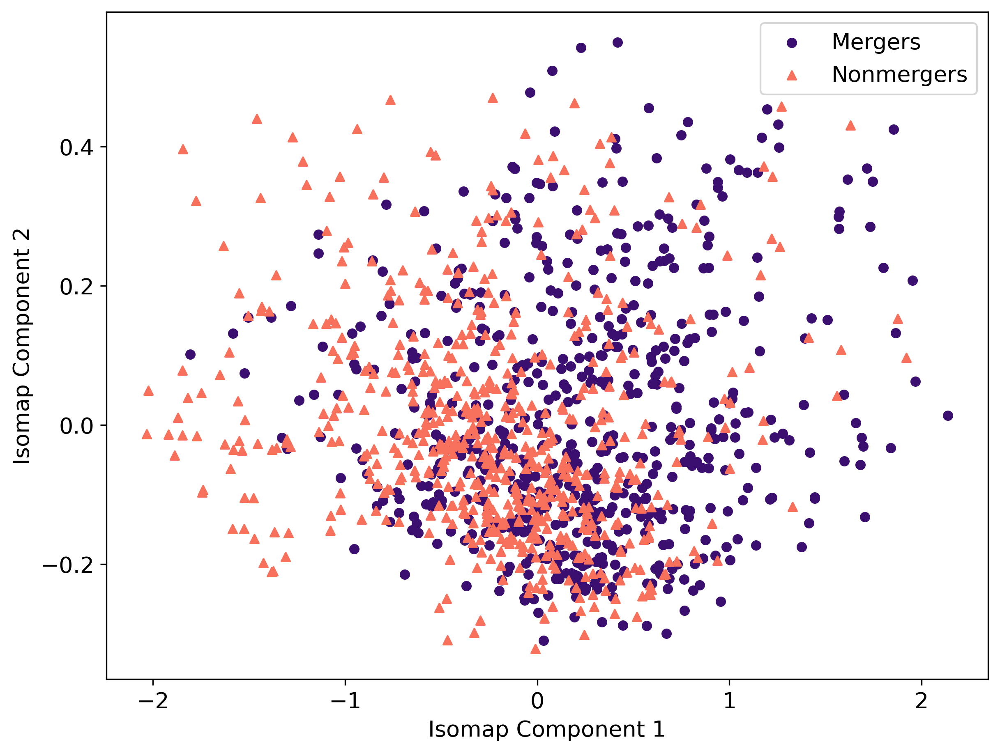

In [115]:
# 3. Visualize the Isomap embedding (optional, but helpful)
merger_mask = (all_labels_for_isomap_plot == 1)
nonmerger_mask = (all_labels_for_isomap_plot == 0)

plt.figure(figsize=(8,6), constrained_layout = True)
scatter = plt.scatter(isomap_results[merger_mask, 0], isomap_results[merger_mask, 1], 
                      c=cmap(0.2),s = 25, label = 'Mergers')

scatter = plt.scatter(isomap_results[nonmerger_mask, 0], isomap_results[nonmerger_mask, 1], 
                      c=cmap(0.7),s = 25, marker = '^', label = 'Nonmergers')
#plt.title('Isomap projection of the test set outputs')
plt.xlabel('Isomap Component 1',fontsize = 'x-large')
plt.ylabel('Isomap Component 2', fontsize = 'x-large')
# Create a legend if you have a manageable number of classes
plt.xticks(fontsize='x-large')
plt.yticks(fontsize='x-large')
legend_elements = scatter.legend_elements()
plt.legend(fontsize = 'x-large')
plt.savefig('isomap_classes.png', dpi = 300)
plt.show()

In [116]:
# custom pred labels
pred_wordlabels = []

for l in range(len(all_preds)):
    if all_preds[l] == 0:
        pred_wordlabels.append('merger')
    else:
        pred_wordlabels.append('nonmerger')
        
print(pred_wordlabels)

['nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger',

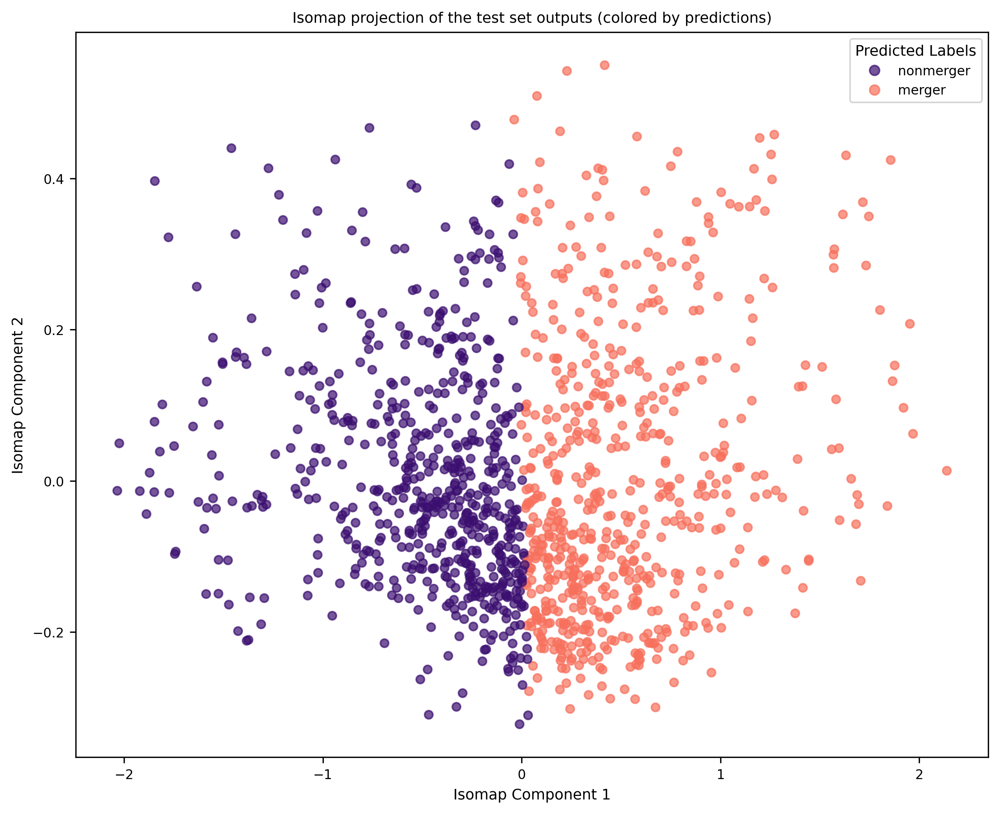

In [117]:
#You can also color by predictions:
plt.figure(figsize=(10, 8))
scatter_preds = plt.scatter(isomap_results[:, 0], isomap_results[:, 1], c=all_preds, cmap=cmap_binary, alpha=0.7, s = 25)
plt.title('Isomap projection of the test set outputs (colored by predictions)')
plt.xlabel('Isomap Component 1')
plt.ylabel('Isomap Component 2')
try:
    legend_preds_elements = scatter_preds.legend_elements()
    if legend_preds_elements and legend_preds_elements[0]:
       plt.legend(handles=legend_preds_elements[0], labels=pred_wordlabels, title="Predicted Labels")
    else:
       plt.colorbar(scatter_preds, label='Predicted Labels (Encoded)')
except Exception as e:
    print(f"Could not create detailed prediction legend: {e}")
    plt.colorbar(scatter_preds, label='Predicted Labels (Encoded)')
plt.show()


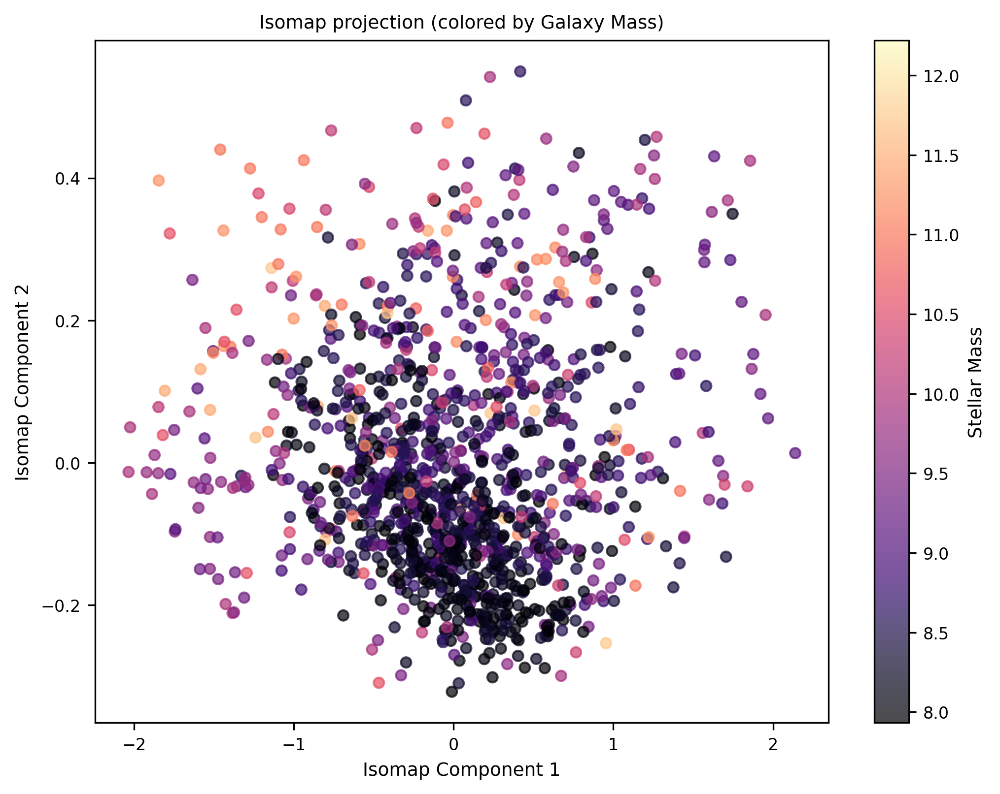

In [118]:
masses_in_order = []

for name in all_names:
    mass = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'Stellar Mass'].iloc[0]
    masses_in_order.append(mass)
masses_in_order = np.array(masses_in_order)
norm_mass = Normalize(vmin=np.min(masses_in_order), vmax=np.max(masses_in_order)+0.5)
plt.figure(figsize=(8,6)) # Adjusted for colorbar
# Use a colormap suitable for continuous data, e.g., 'viridis', 'plasma', 'coolwarm', 'magma'
scatter = plt.scatter(
    isomap_results[:, 0],
    isomap_results[:, 1],
    c=masses_in_order, # Color by mass
    cmap='magma',       # Choose a colormap
    alpha=0.7,
    s=25,
    norm = norm_mass
)

plt.title('Isomap projection (colored by Galaxy Mass)')
plt.xlabel('Isomap Component 1')
plt.ylabel('Isomap Component 2')

# Add a colorbar to show the mass scale
cbar = plt.colorbar(scatter)
cbar.set_label('Stellar Mass') # Update label with units

plt.show()

[0.20243274, 0.10546916, 0.19640149, 0.0, 0.0, 0.19640149, 0.0, 0.0, 0.0, 0.0, 0.1562853, 0.99038935, 0.0, 0.34962659999999995, 0.10546916, 0.0, 0.0, 0.0, 0.0, 0.7758559825091027, 0.8818440999999999, 0.18267076, 0.5917554383656235, 0.0, 0.0, 0.0, 0.0, 0.14225239, 0.7429124112953295, 0.0, 0.0, 0.13636528, 0.18298434, 0.0, 0.0, 0.18986602, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.15954891, 0.43834287, 0.19418514, 0.0, 0.0, 0.0, 0.76816285, 0.0, 0.0, 0.18663451, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.16998231, 0.24320558, 0.0, 0.39276493, 0.18267076, 0.0, 0.0, 0.28760183, 0.0, 0.0, 0.8322622811327057, 0.0, 0.24987264, 0.0, 0.0, 0.0, 0.0, 0.5891441999999999, 0.24987264, 0.99038935, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8177481, 0.1851274, 0.16474542, 0.0, 0.43834287, 0.13636528, 0.0, 0.0, 0.13572223, 0.0, 0.111217, 0.11758917, 0.0, 0.0, 0.0, 0.0, 0.18663451, 0.2541805, 0.0, 0.0, 0.8322622811327057, 0.0, 0.13579404, 0.0, 0.25151910000000005, 0.0, 0.8322622811327057, 0.29991812, 0.33709320000000004

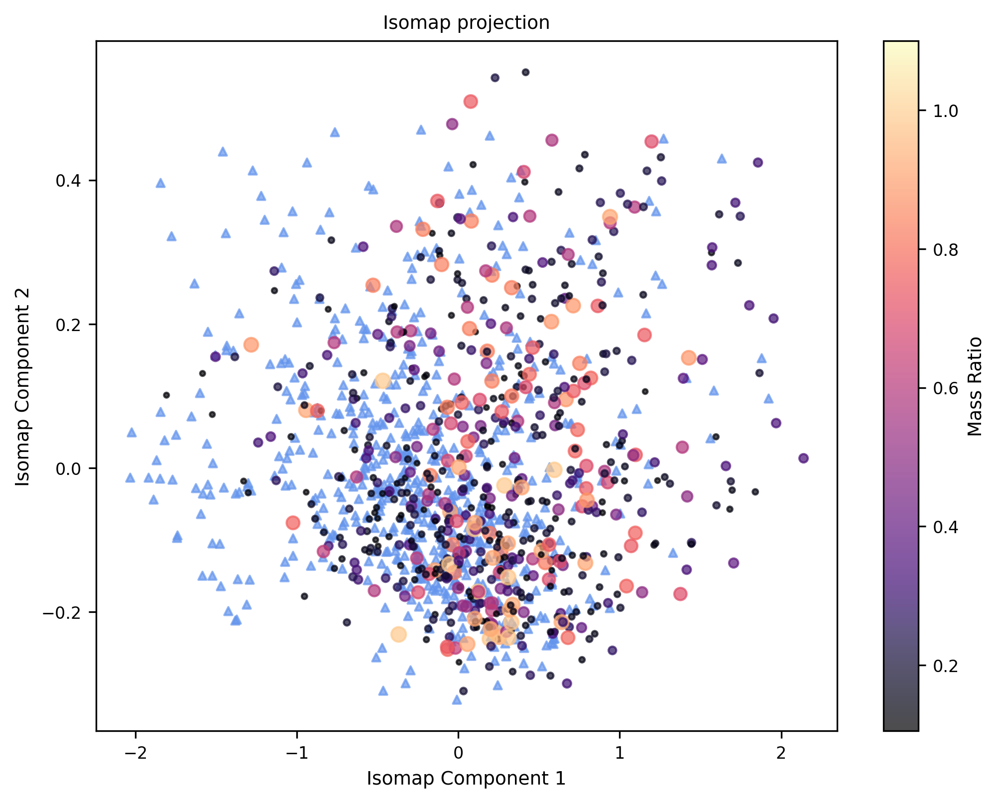

In [119]:
ratios_in_order = []

for name in all_names:
    ratio = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'Mass Ratio'].iloc[0]
    ratios_in_order.append(ratio)
    
print(ratios_in_order)
ratios_in_order = np.array(ratios_in_order)
zero_ratio_indices = np.where(ratios_in_order == 0.0)[0]
non_zero_ratio_indices = np.where(ratios_in_order != 0.0)[0]

plt.figure(figsize=(8,6)) # Adjusted for colorbar
# Use a colormap suitable for continuous data, e.g., 'viridis', 'plasma', 'coolwarm', 'magma'

scatter_zero = plt.scatter(
isomap_results[:, 0][zero_ratio_indices],
isomap_results[:, 1][zero_ratio_indices],
color='cornflowerblue',       # Choose a distinct color
alpha=0.7,
s=15,              # Maybe make them slightly larger
marker='^',
label='Nonmergers' # Add a label for the legend
)

scatter = plt.scatter(
    isomap_results[:, 0][non_zero_ratio_indices],
    isomap_results[:, 1][non_zero_ratio_indices],
    c=ratios_in_order[non_zero_ratio_indices], # Color by mass
    cmap='magma',       # Choose a colormap
    alpha=0.7,
    s=np.array(ratios_in_order[non_zero_ratio_indices])*50,
    vmax = 1.1,
    label = 'Mergers'
)
plt.title('Isomap projection')
plt.xlabel('Isomap Component 1')
plt.ylabel('Isomap Component 2')

# Add a colorbar to show the mass scale
cbar = plt.colorbar(scatter)
cbar.set_label('Mass Ratio') # Update label with units

plt.show()

['Merger', 'Descendant', 'first_progenitor', '0.0', '0.0', 'first_progenitor', '0.0', '0.0', '0.0', '0.0', 'Merger', 'Merger', '0.0', 'Descendant', 'Descendant', '0.0', '0.0', '0.0', '0.0', 'next_progenitor', 'Descendant', 'next_progenitor', 'Descendant', '0.0', '0.0', '0.0', '0.0', 'Merger', 'first_progenitor', '0.0', '0.0', 'first_progenitor', 'Descendant', '0.0', '0.0', 'first_progenitor', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', 'first_progenitor', 'Descendant', 'first_progenitor', '0.0', '0.0', '0.0', 'first_progenitor', '0.0', '0.0', 'next_progenitor', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', 'first_progenitor', 'Descendant', '0.0', 'first_progenitor', 'next_progenitor', '0.0', '0.0', 'first_progenitor', '0.0', '0.0', 'Descendant', '0.0', 'Descendant', '0.0', '0.0', '0.0', '0.0', 'Descendant', 'Descendant', 'Merger', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', 'next_progenitor', 'first_progenitor', 'Descendant', '0.0', 'Descendant', 'first_progenitor', '0.0',

/tmp/ipykernel_2585407/1204844930.py:15: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = plt.scatter(


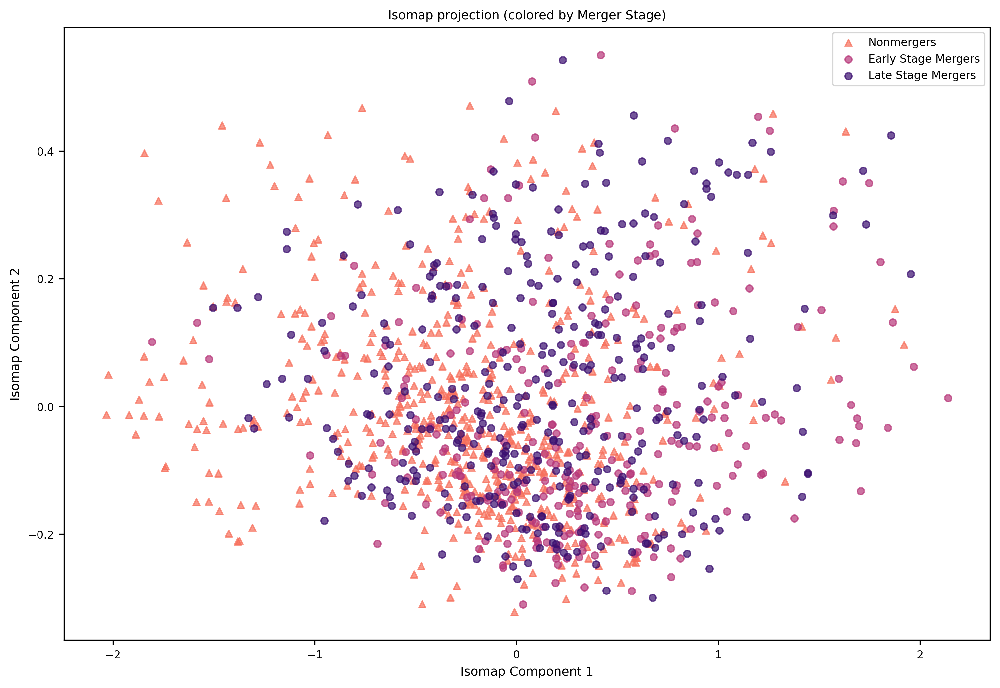

In [120]:
types_in_order = []

for name in all_names:
    typeofmerg = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'Type'].iloc[0]
    types_in_order.append(typeofmerg)
    
print(types_in_order)
types_in_order = np.array(types_in_order)
nostage = np.where(types_in_order == '0.0')[0]
earlystage = np.where((types_in_order == 'first_progenitor') | (types_in_order == 'next_progenitor'))[0]
latestage = np.where((types_in_order == 'Merger') | (types_in_order == 'Descendant'))[0]

plt.figure(figsize=(12, 8)) # Adjusted for colorbar
# Use a colormap suitable for continuous data, e.g., 'viridis', 'plasma', 'coolwarm', 'magma'
scatter = plt.scatter(
    isomap_results[:, 0][nostage],
    isomap_results[:, 1][nostage],
    c=nonmergers_color, 
    #cmap='magma',       # Choose a colormap
    alpha=0.7,
    s=25,
    marker = '^',
    label = 'Nonmergers'
)

scatter_zero = plt.scatter(
    isomap_results[:, 0][earlystage],
    isomap_results[:, 1][earlystage],
    color=cmap(0.5),       # Choose a distinct color
    alpha=0.7,
    s=25,              # Maybe make them slightly larger
    marker='o',
    label='Early Stage Mergers' # Add a label for the legend
)

scatter_zero = plt.scatter(
    isomap_results[:, 0][latestage],
    isomap_results[:, 1][latestage],
    color=cmap(0.2),       # Choose a distinct color
    alpha=0.7,
    s=25,              # Maybe make them slightly larger
    marker='o',
    label='Late Stage Mergers' # Add a label for the legend
)

plt.title('Isomap projection (colored by Merger Stage)')
plt.xlabel('Isomap Component 1')
plt.ylabel('Isomap Component 2')

# # Add a colorbar to show the mass scale
# cbar = plt.colorbar(scatter)
# cbar.set_label('Mass Ratio)') # Update label with units
plt.legend()
plt.show()

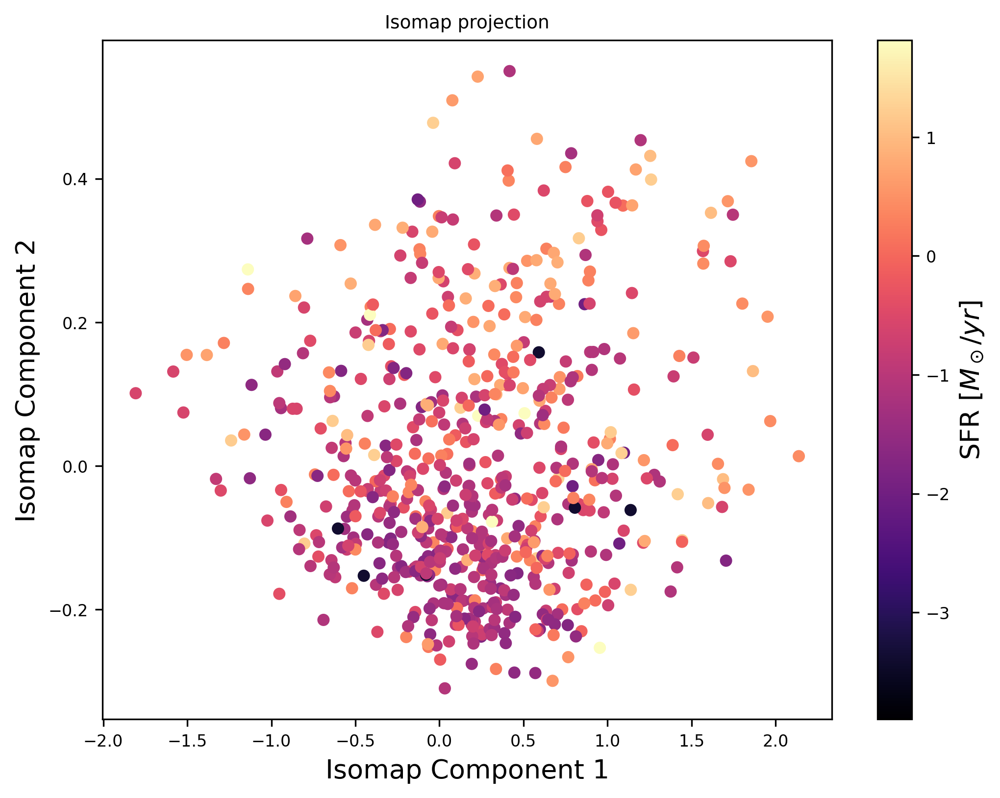

In [121]:
sfrs_in_order = []

for name in all_names:
    sfr = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'SFR'].iloc[0]
    sfrs_in_order.append(sfr)
    
log_sfr_array = np.log10(np.array(sfrs_in_order))
norm_sfr = Normalize(vmin=np.min(log_sfr_array), vmax=np.max(log_sfr_array))
plt.figure(figsize=(8,6)) # Adjusted for colorbar
# Use a colormap suitable for continuous data, e.g., 'viridis', 'plasma', 'coolwarm', 'magma'
scatter = plt.scatter(
    isomap_results[:, 0][non_zero_ratio_indices],
    isomap_results[:, 1][non_zero_ratio_indices],
    c=log_sfr_array[non_zero_ratio_indices], # Color by mass
    cmap='magma',       # Choose a colormap
    #alpha=0.7,
    #s=np.array(sfrs_in_order)[non_zero_ratio_indices]*3,
    s = 25,
    label = 'Mergers',
    norm = norm_sfr
    #,vmax = 75,
    
)

# scatter = plt.scatter(
#     isomap_results[:, 0][zero_ratio_indices],
#     isomap_results[:, 1][zero_ratio_indices],
#     c=np.array(sfrs_in_order)[zero_ratio_indices], # Color by mass
#     cmap='magma',       # Choose a colormap
#     alpha=0.7,
#     marker = '^',
#     s=np.array(sfrs_in_order)[zero_ratio_indices]*3,
#     label = 'Nonmergers'
#     ,vmax = 75,
    
# )

plt.title('Isomap projection')
plt.xlabel('Isomap Component 1', fontsize = 'x-large')
plt.ylabel('Isomap Component 2', fontsize = 'x-large')

# Add a colorbar to show the mass scale
cbar = plt.colorbar(scatter)
cbar.set_label(r'SFR [$M_\odot/yr$]', fontsize = 'x-large') # Update label with units

plt.show()

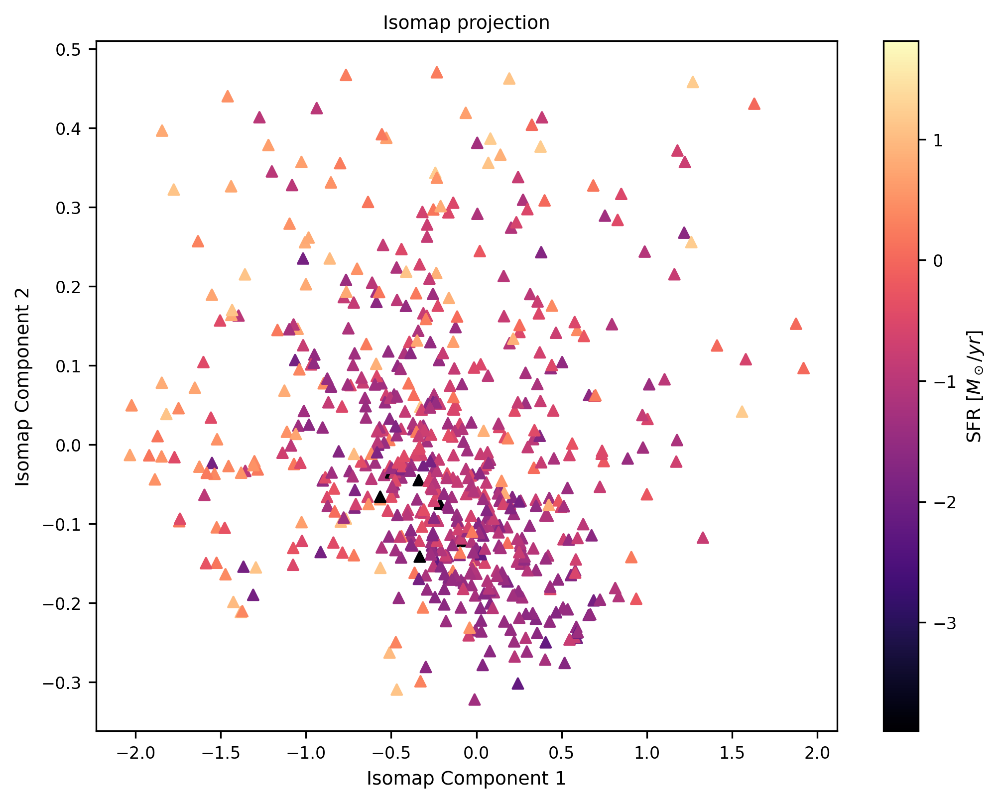

In [122]:
sfrs_in_order = []

for name in all_names:
    sfr = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'SFR'].iloc[0]
    sfrs_in_order.append(sfr)
plt.figure(figsize=(8,6)) # Adjusted for colorbar
# Use a colormap suitable for continuous data, e.g., 'viridis', 'plasma', 'coolwarm', 'magma'
# scatter = plt.scatter(
#     isomap_results[:, 0][non_zero_ratio_indices],
#     isomap_results[:, 1][non_zero_ratio_indices],
#     c=np.array(sfrs_in_order)[non_zero_ratio_indices], # Color by mass
#     cmap='magma',       # Choose a colormap
#     alpha=0.7,
#     s=np.array(sfrs_in_order)[non_zero_ratio_indices]*3,
#     label = 'Mergers'
#     ,vmax = 75,
    
# )

scatter = plt.scatter(
    isomap_results[:, 0][zero_ratio_indices],
    isomap_results[:, 1][zero_ratio_indices],
    c=log_sfr_array[zero_ratio_indices], # Color by mass
    cmap='magma',       # Choose a colormap
    #alpha=0.7,
    marker = '^',
    s=25,#np.array(sfrs_in_order)[zero_ratio_indices]*30,
    label = 'Nonmergers',
    norm = norm_sfr
    #,vmax = 75,
    
)

plt.title('Isomap projection')
plt.xlabel('Isomap Component 1')
plt.ylabel('Isomap Component 2')

# Add a colorbar to show the mass scale
cbar = plt.colorbar(scatter)
cbar.set_label(r'SFR [$M_\odot/yr$]') # Update label with units

plt.show()

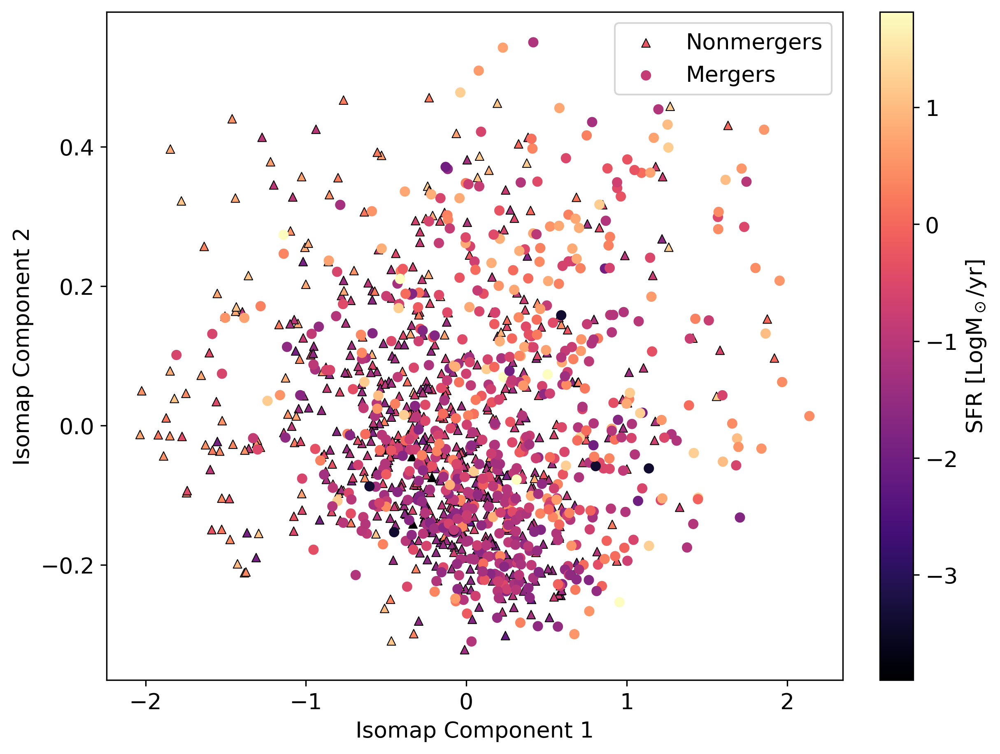

In [123]:
sfrs_in_order = []

for name in all_names:
    sfr = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'SFR'].iloc[0]
    sfrs_in_order.append(sfr)
plt.figure(figsize=(8,6), constrained_layout=True) # Adjusted for colorbar
# Use a colormap suitable for continuous data, e.g., 'viridis', 'plasma', 'coolwarm', 'magma'


scatter = plt.scatter(
    isomap_results[:, 0][zero_ratio_indices],
    isomap_results[:, 1][zero_ratio_indices],
    c=log_sfr_array[zero_ratio_indices], # Color by mass
    cmap='magma',       # Choose a colormap
    #alpha=0.5,
    marker = '^',
    linewidth=0.5,
    edgecolor = 'k',
    s=25, #np.array(sfrs_in_order)[zero_ratio_indices]*3,
    label = 'Nonmergers',
    norm = norm_sfr
    #,vmax = 75,
    
)

scatter = plt.scatter(
    isomap_results[:, 0][non_zero_ratio_indices],
    isomap_results[:, 1][non_zero_ratio_indices],
    c=log_sfr_array[non_zero_ratio_indices], # Color by mass
    cmap='magma',       # Choose a colormap
    #alpha=0.7,
    s=25, #np.array(sfrs_in_order)[non_zero_ratio_indices]*3,
    label = 'Mergers',
    norm = norm_sfr
    #,vmax = 75,
    
)

#plt.title('Isomap projection')
plt.xlabel('Isomap Component 1', fontsize = 'x-large')
plt.ylabel('Isomap Component 2', fontsize = 'x-large')
plt.xticks(fontsize = 'x-large')
plt.yticks(fontsize = 'x-large')
# Add a colorbar to show the mass scale
cbar = plt.colorbar(scatter)
cbar.set_label(r'SFR [LogM$_\odot$/yr]', fontsize = 'x-large') # Update label with units
cbar.ax.tick_params(labelsize='x-large')
plt.legend(fontsize = 'x-large')
plt.savefig('isomap_SFR_' + CNNName + '.png', dpi = 300)
plt.show()

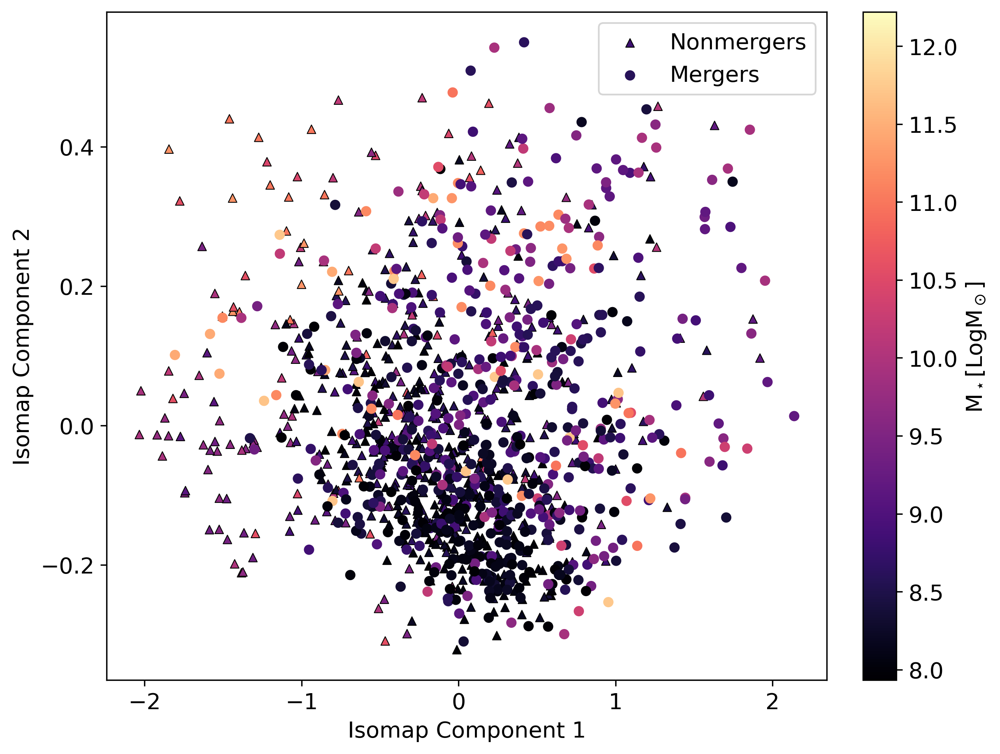

In [124]:
masses_in_order = []

for name in all_names:
    mass = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'Stellar Mass'].iloc[0]
    masses_in_order.append(mass)
masses_in_order = np.array(masses_in_order)

plt.figure(figsize=(8,6), constrained_layout=True) # Adjusted for colorbar
# Use a colormap suitable for continuous data, e.g., 'viridis', 'plasma', 'coolwarm', 'magma'
scatter = plt.scatter(
    isomap_results[:, 0][zero_ratio_indices],
    isomap_results[:, 1][zero_ratio_indices],
    c=masses_in_order[zero_ratio_indices], # Color by mass
    cmap='magma',       # Choose a colormap
    #alpha=0.7,
    #vmax = 12.5,
    marker = '^',
    s=25,
    edgecolor = 'k',
    linewidth = 0.5,
    label = 'Nonmergers',
    norm = norm_mass
)


scatter = plt.scatter(
    isomap_results[:, 0][non_zero_ratio_indices],
    isomap_results[:, 1][non_zero_ratio_indices],
    c=masses_in_order[non_zero_ratio_indices], # Color by mass
    cmap='magma',       # Choose a colormap
    #alpha=0.7,
    s=25, #np.array(sfrs_in_order)[non_zero_ratio_indices]*3,
    label = 'Mergers',
    norm = norm_mass
    #,vmax = 75,
    
)
#plt.title('Isomap projection (colored by Galaxy Mass)')
plt.xlabel('Isomap Component 1', fontsize = 'x-large')
plt.ylabel('Isomap Component 2', fontsize = 'x-large')
plt.legend(fontsize = 'x-large')
plt.xticks(fontsize = 'x-large')
plt.yticks(fontsize = 'x-large')
# Add a colorbar to show the mass scale
cbar = plt.colorbar(scatter)
cbar.set_label(r'M$_\star$[LogM$_\odot$] ', fontsize = 'x-large') # Update label with units
cbar.ax.tick_params(labelsize='x-large')
plt.savefig('isomap_mass.png', dpi = 300)
plt.show()

# Umap

In [125]:
reducer = umap.UMAP(n_components=2, n_neighbors=50, random_state=626)

umap_embedding = reducer.fit_transform(all_extracted_features)

/n/home09/aschechter/.conda/envs/zoobot2/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [126]:
reducer_enc = umap.UMAP(n_components=2, n_neighbors=50, random_state=626)
umap_embedding_enc = reducer_enc.fit_transform(all_encoder_features)
print("Encoder UMAP embedding shape:", umap_embedding_enc.shape)

/n/home09/aschechter/.conda/envs/zoobot2/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Encoder UMAP embedding shape: (1254, 2)


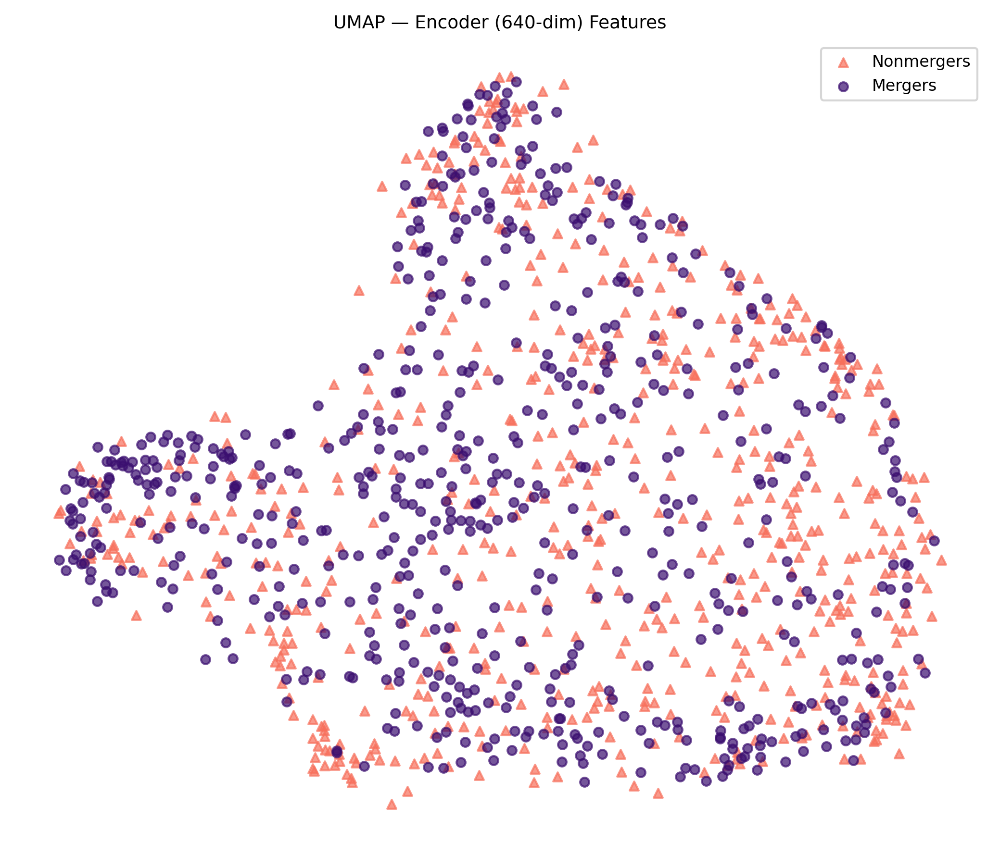

In [127]:
merger_mask = (all_labels_for_isomap_plot == 1)
nonmerger_mask = (all_labels_for_isomap_plot == 0)

plt.figure(figsize=(7, 6))
plt.axis('off')
plt.scatter(
    umap_embedding_enc[nonmerger_mask, 0],
    umap_embedding_enc[nonmerger_mask, 1],
    color=nonmergers_color, alpha=0.7, s=20, marker='^', label='Nonmergers'
)
plt.scatter(
    umap_embedding_enc[merger_mask, 0],
    umap_embedding_enc[merger_mask, 1],
    color=mergers_color, alpha=0.7, s=20, marker='o', label='Mergers'
)
plt.legend()
plt.title('UMAP — Encoder (640-dim) Features')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
# plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [128]:
print("UMAP embedding shape:", umap_embedding.shape) # Should be (num_samples, 2)

UMAP embedding shape: (1254, 2)


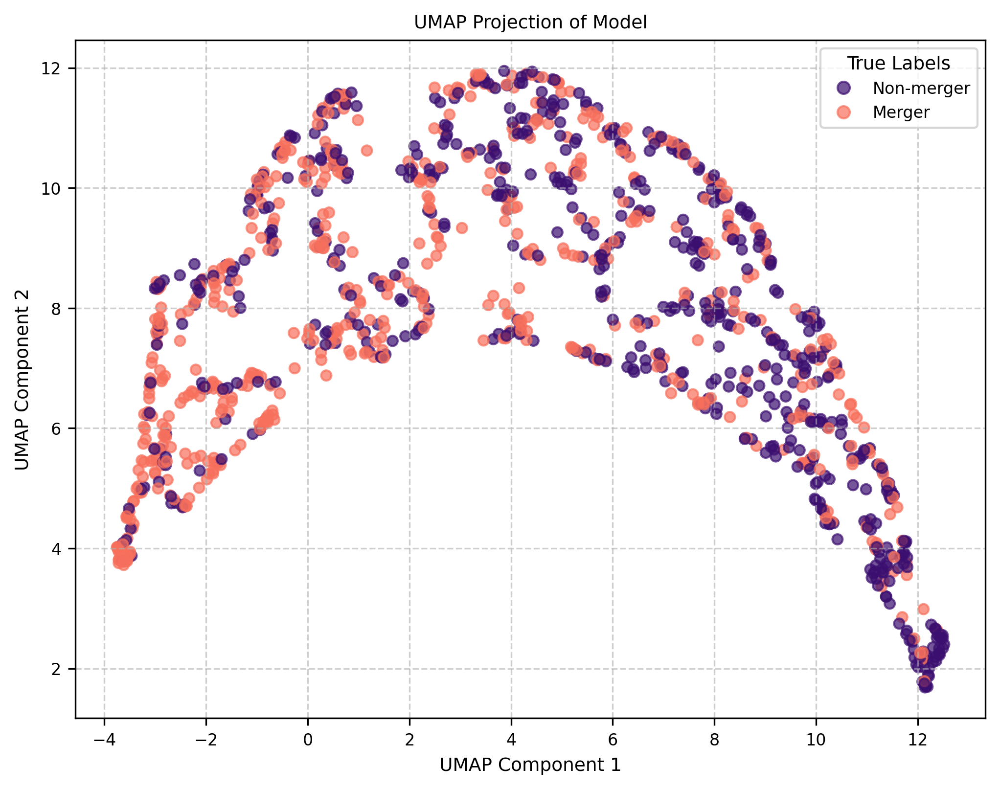

In [129]:
plt.figure(figsize=(8, 6))

# Define custom labels for the legend
custom_labels = {1: 'Merger', 0: 'Non-merger'}
legend_labels = [custom_labels[label] for label in sorted(np.unique(all_labels))]

# You can color the points by their true labels (all_labels)
# or by predicted labels (all_preds) to see how well they separate.
scatter = plt.scatter(
    umap_embedding[:, 0],
    umap_embedding[:, 1],
    c=all_labels, # Color by true labels
    cmap=cmap_binary, # Choose a colormap, e.g., 'viridis', 'plasma', 'coolwarm'
    s=25,           # Marker size
    alpha=0.7       # Transparency
)


#plt.axes('off')
# Add legend for true labels
handles, _ = scatter.legend_elements() # Get default handles for the scatter points
plt.legend(handles=handles, labels=legend_labels, title="True Labels")

plt.title('UMAP Projection of Model')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

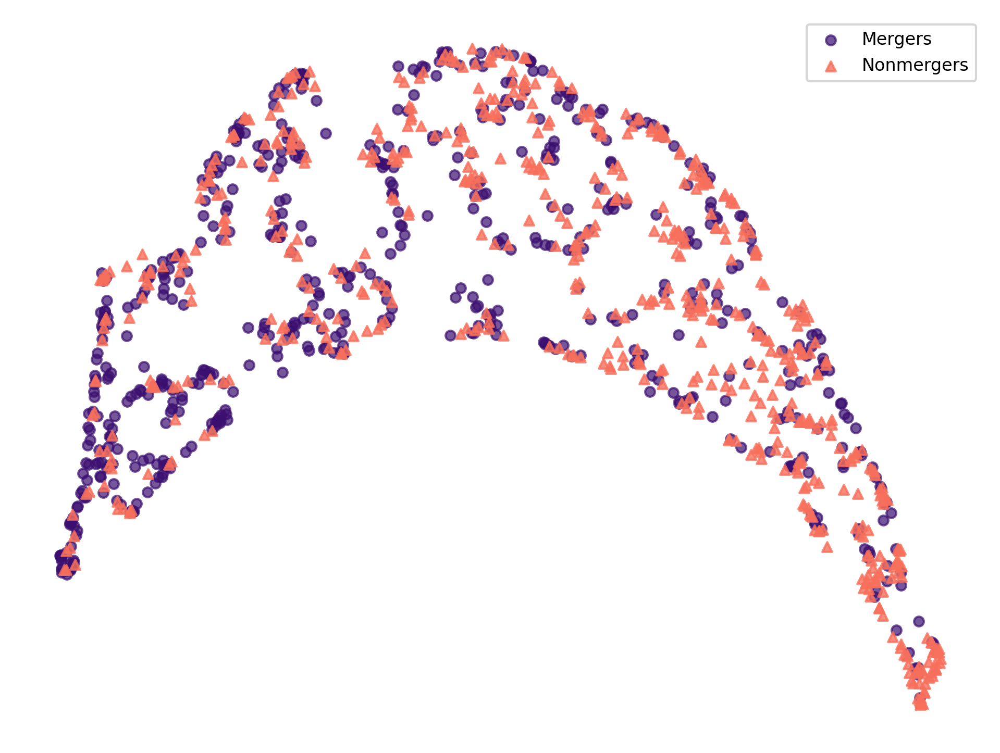

In [130]:
plt.figure(figsize=(8,6))
plt.axis('off')
# Identify indices for mass ratio = 0 and mass ratio != 0
# Filter out NaNs if any were introduced
valid_indices = ~np.isnan(ratios_in_order)
zero_ratio_indices = np.where((ratios_in_order == 0) & valid_indices)[0]
non_zero_ratio_indices = np.where((ratios_in_order != 0) & valid_indices)[0]

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = plt.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    #c=ratios_in_order[non_zero_ratio_indices], # Color by mass ratio
    color=mergers_color,       # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.7,
    s = 20,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
# cbar = plt.colorbar(scatter_non_zero)
# cbar.set_label('Mass Ratio')

# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = plt.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    color=nonmergers_color,       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    s=20,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    label='Nonmergers'
)

#plt.title('UMAP Projection (colored by Mass Ratio)')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.grid(True, linestyle='--', alpha=0.6)

# Add a legend for the fixed-color 'Mass Ratio = 0' points
plt.legend(loc='best') # 'best' attempts to place it where it won't overlap much

plt.show()


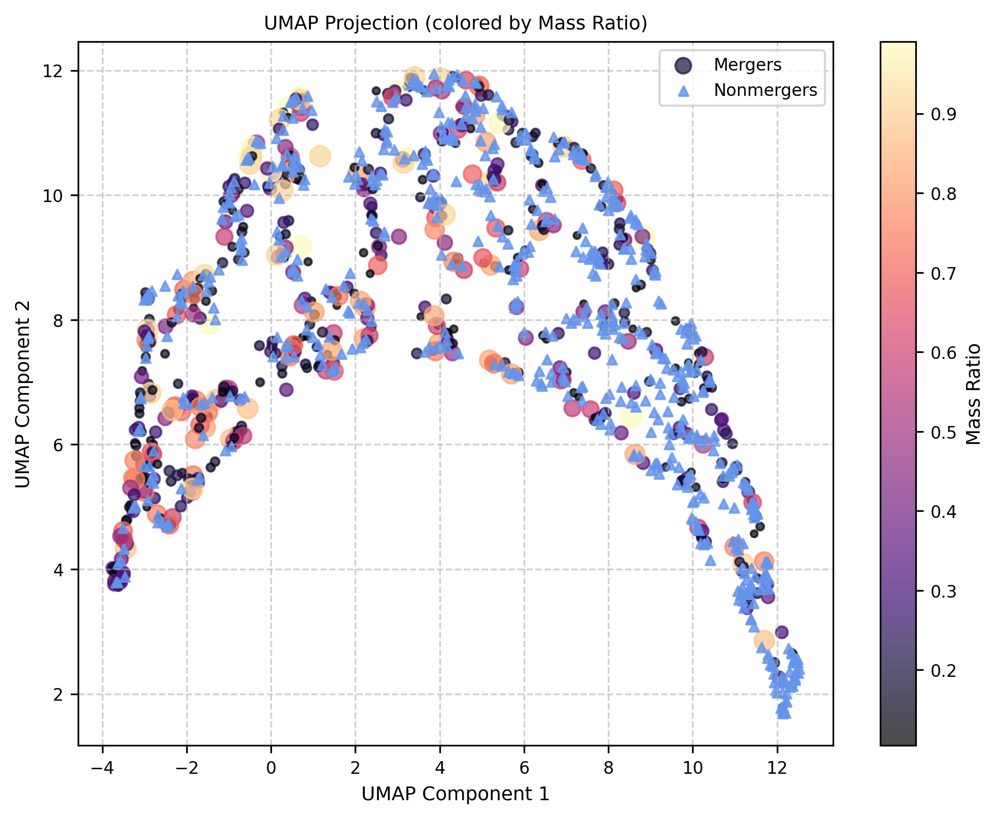

In [131]:
plt.figure(figsize=(8,6))

# Identify indices for mass ratio = 0 and mass ratio != 0
# Filter out NaNs if any were introduced
valid_indices = ~np.isnan(ratios_in_order)
zero_ratio_indices = np.where((ratios_in_order == 0) & valid_indices)[0]
non_zero_ratio_indices = np.where((ratios_in_order != 0) & valid_indices)[0]

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = plt.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    c=ratios_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',       # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.7,
    s = np.array(ratios_in_order[non_zero_ratio_indices])*100,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = plt.colorbar(scatter_non_zero)
cbar.set_label('Mass Ratio')

# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = plt.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    color='cornflowerblue',       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    s=20,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    label='Nonmergers'
)

plt.title('UMAP Projection (colored by Mass Ratio)')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.grid(True, linestyle='--', alpha=0.6)

# Add a legend for the fixed-color 'Mass Ratio = 0' points
plt.legend(loc='best') # 'best' attempts to place it where it won't overlap much

plt.show()


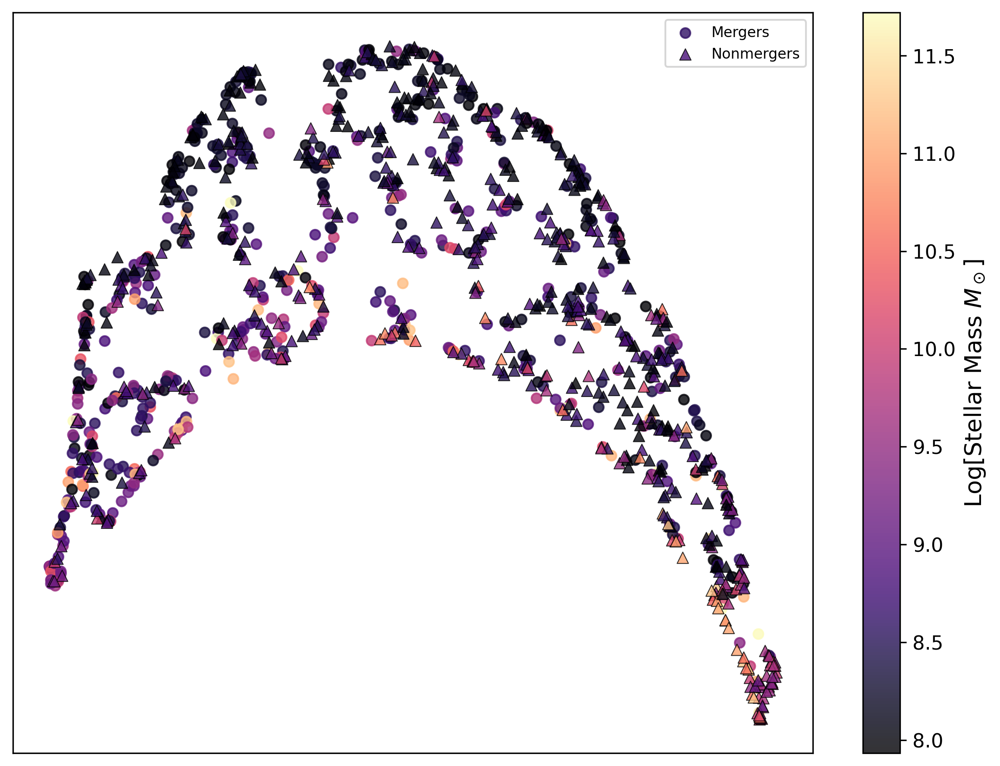

In [132]:
vmin = masses_in_order.min()
vmax = masses_in_order.max()
plt.figure(figsize=(8,6)) # Adjusted for colorbar
# Use a colormap suitable for continuous data, e.g., 'viridis', 'plasma', 'coolwarm', 'magma'
# scatter = plt.scatter(
#     umap_embedding[:, 0],
#     umap_embedding[:, 1],
#     c=masses_in_order, # Color by mass
#     cmap='magma',       # Choose a colormap
#     alpha=0.7,
#     s=np.array(masses_in_order) * 2
# )

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = plt.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    c=masses_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=vmin, vmax=vmax,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = plt.colorbar(scatter_non_zero)
cbar.set_label(r'Log[Stellar Mass $M_\odot$]', fontsize = 'x-large')
cbar.ax.tick_params(labelsize='large')

# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = plt.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    c=masses_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=vmin, vmax=vmax,  # Sync color scale
    s=40,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)

#plt.title('UMAP projection (colored by Galaxy Mass)')
# plt.xlabel('UMAP Component 1')
# plt.ylabel('UMAP Component 2')
plt.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 
# # Add a colorbar to show the mass scale
# cbar = plt.colorbar(scatter)
# cbar.set_label('Stellar Mass') # Update label with units
plt.legend()
plt.tight_layout()
plt.savefig('umap_stellarmass.png', dpi = 300)
plt.show()

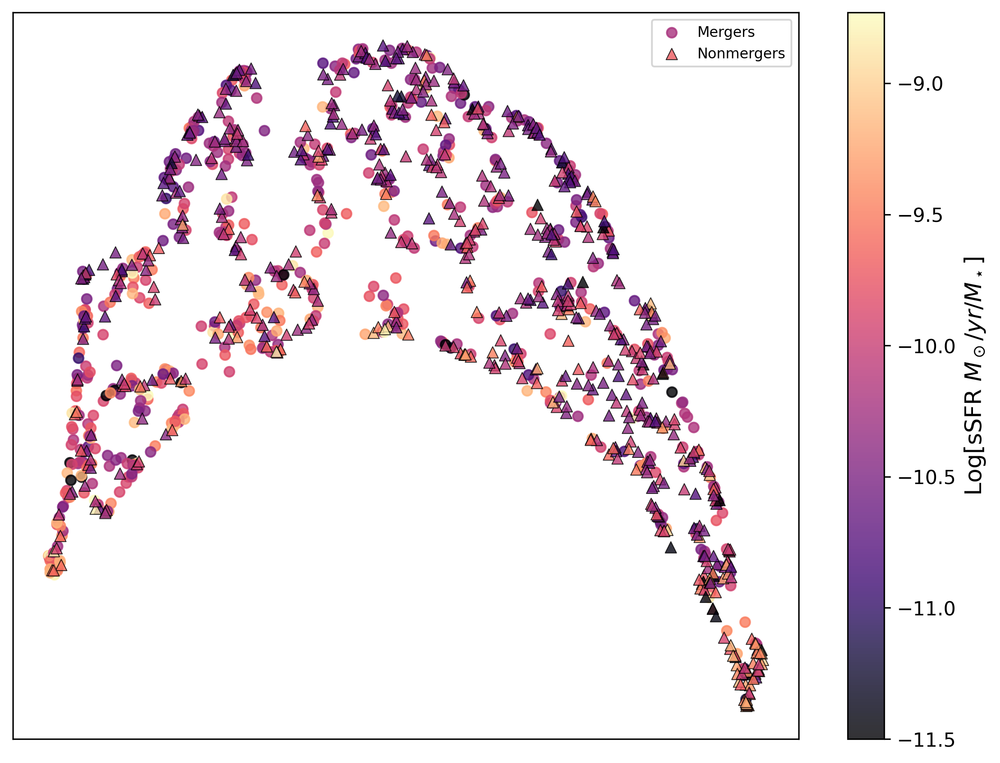

In [133]:
ssfrs_in_order = np.array(np.array(sfrs_in_order)/((np.array(masses_in_order)**(10))))
ssfrs_in_order = np.log10(ssfrs_in_order)
vmin = ssfrs_in_order.min()
vmax = ssfrs_in_order.max()
#print(ssfrs_in_order)
plt.figure(figsize=(8,6)) # Adjusted for colorbar
# Use a colormap suitable for continuous data, e.g., 'viridis', 'plasma', 'coolwarm', 'magma'
# scatter = plt.scatter(
#     umap_embedding[:, 0],
#     umap_embedding[:, 1],
#     c=sfrs_in_order, # Color by mass
#     cmap='magma',       # Choose a colormap
#     alpha=0.7,
#     s=np.array(sfrs_in_order) * 2
# )

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = plt.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    c=ssfrs_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=-11.5, vmax=vmax,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = plt.colorbar(scatter_non_zero)
cbar.set_label(r'Log[sSFR $M_\odot/yr/M_\star$]', fontsize = 'x-large')
cbar.ax.tick_params(labelsize='large')
# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = plt.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    c=ssfrs_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=-11.5, vmax=vmax,  # Sync color scale
    s=40,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)

# plt.title('UMAP projection (colored by sSFR)')
# plt.xlabel('UMAP Component 1')
# plt.ylabel('UMAP Component 2')
plt.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 
# # Add a colorbar to show the mass scale
# cbar = plt.colorbar(scatter)
# cbar.set_label('Stellar Mass') # Update label with units
plt.legend()
plt.tight_layout()
plt.savefig('umap_ssfr.png', dpi = 300)

plt.show()

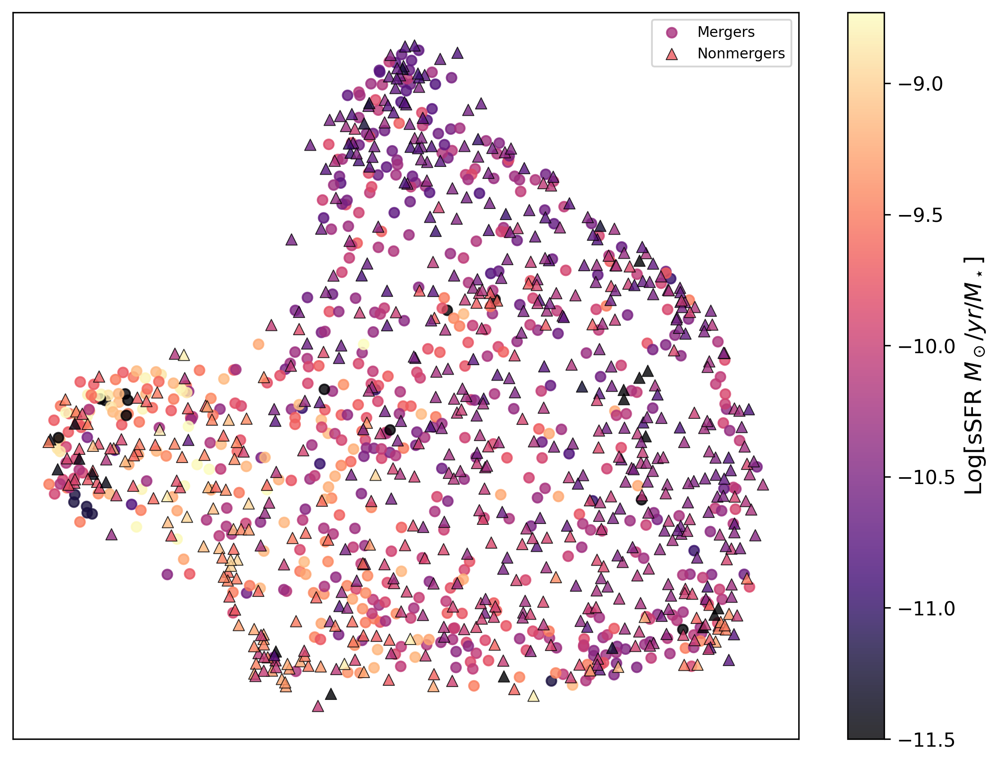

In [134]:
ssfrs_in_order = np.array(np.array(sfrs_in_order)/((np.array(masses_in_order)**(10))))
ssfrs_in_order = np.log10(ssfrs_in_order)
vmin = ssfrs_in_order.min()
vmax = ssfrs_in_order.max()
#print(ssfrs_in_order)
plt.figure(figsize=(8,6)) # Adjusted for colorbar
# Use a colormap suitable for continuous data, e.g., 'viridis', 'plasma', 'coolwarm', 'magma'
# scatter = plt.scatter(
#     umap_embedding[:, 0],
#     umap_embedding[:, 1],
#     c=sfrs_in_order, # Color by mass
#     cmap='magma',       # Choose a colormap
#     alpha=0.7,
#     s=np.array(sfrs_in_order) * 2
# )

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = plt.scatter(
    umap_embedding_enc[non_zero_ratio_indices, 0],
    umap_embedding_enc[non_zero_ratio_indices, 1],
    c=ssfrs_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=-11.5, vmax=vmax,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = plt.colorbar(scatter_non_zero)
cbar.set_label(r'Log[sSFR $M_\odot/yr/M_\star$]', fontsize = 'x-large')
cbar.ax.tick_params(labelsize='large')
# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = plt.scatter(
    umap_embedding_enc[zero_ratio_indices, 0],
    umap_embedding_enc[zero_ratio_indices, 1],
    c=ssfrs_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=-11.5, vmax=vmax,  # Sync color scale
    s=40,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)

# plt.title('UMAP projection (colored by sSFR)')
# plt.xlabel('UMAP Component 1')
# plt.ylabel('UMAP Component 2')
plt.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 
# # Add a colorbar to show the mass scale
# cbar = plt.colorbar(scatter)
# cbar.set_label('Stellar Mass') # Update label with units
plt.legend()
plt.tight_layout()
plt.savefig('umap_ssfr.png', dpi = 300)

plt.show()

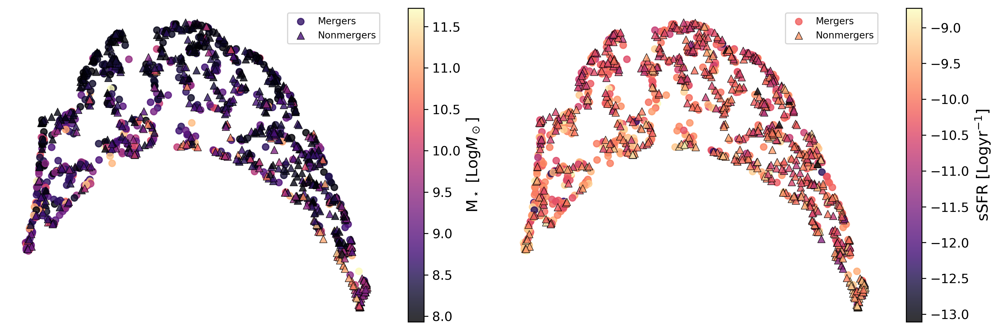

In [135]:
vmin_mass = masses_in_order.min()
vmax_mass = masses_in_order.max()
vmin_ssfr = ssfrs_in_order.min()
vmax_ssfr = ssfrs_in_order.max()
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (12, 4))

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = ax1.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    c=masses_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=vmin_mass, vmax=vmax_mass,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = fig.colorbar(scatter_non_zero, ax=ax1)
cbar.set_label(r'M$_\star$ [Log$M_\odot$]', fontsize='x-large')
cbar.ax.tick_params(labelsize='large')

# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = ax1.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    c=masses_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=vmin_mass, vmax=vmax_mass,  # Sync color scale
    s=40,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)


ax1.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 

ax1.legend()
ax1.axis('off')

scatter_non_zero = ax2.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    c=ssfrs_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=vmin_ssfr, vmax=vmax_ssfr,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar2 = fig.colorbar(scatter_non_zero, ax=ax2)
cbar2.set_label(r'sSFR [Logyr$^{-1}$]', fontsize='x-large')
cbar2.ax.tick_params(labelsize='large')
# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = ax2.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    c=ssfrs_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=vmin_ssfr, vmax=vmax_ssfr,  # Sync color scale
    s=40,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)

# ax2.title('UMAP projection (colored by sSFR)')
# ax2.xlabel('UMAP Component 1')
# ax2.ylabel('UMAP Component 2')
ax2.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 
# # Add a colorbar to show the mass scale
# cbar = ax2.colorbar(scatter)
# cbar.set_label('Stellar Mass') # Update label with units
ax2.legend()
ax2.axis('off')

plt.tight_layout()
plt.axis('off')
plt.savefig('UMAP_mass_ssfr_panel.png', dpi=300)
plt.show()

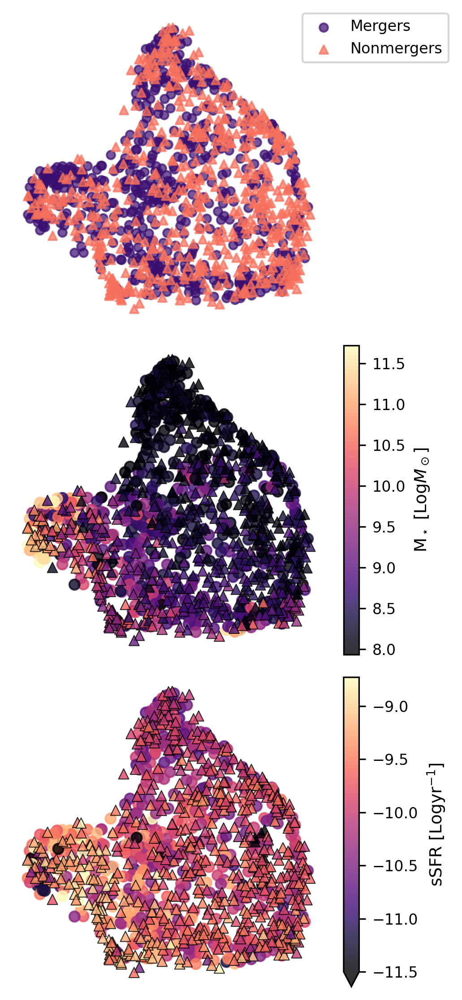

In [136]:
vmin_mass = masses_in_order.min()
vmax_mass = masses_in_order.max()
vmin_ssfr = ssfrs_in_order.min()
vmax_ssfr = ssfrs_in_order.max()
fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize = (3.5, 7.5), sharex=True, sharey=True)

scatter_true_mergers = ax1.scatter(
    umap_embedding_enc[merger_mask, 0],
    umap_embedding_enc[merger_mask, 1],
    color=mergers_color, alpha=0.7, s=20, marker='o', label='Mergers'
)
scatter_true_nonmergers = ax1.scatter(
    umap_embedding_enc[nonmerger_mask, 0],
    umap_embedding_enc[nonmerger_mask, 1],
    color=nonmergers_color, alpha=0.7, s=20, marker='^', label='Nonmergers'
)
cbar = plt.colorbar(scatter_true_mergers, ax=ax1)
cbar.ax.set_visible(False)
ax1.legend(loc='upper right', bbox_to_anchor=(1.4, 1), borderaxespad=0)
ax1.axis('off')

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = ax2.scatter(
    umap_embedding_enc[non_zero_ratio_indices, 0],
    umap_embedding_enc[non_zero_ratio_indices, 1],
    c=masses_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=vmin_mass, vmax=vmax_mass,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = fig.colorbar(scatter_non_zero, ax=ax2)
cbar.set_label(r'M$_\star$ [Log$M_\odot$]') # fontsize='x-large'
# cbar.ax.tick_params(labelsize='large')

# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = ax2.scatter(
    umap_embedding_enc[zero_ratio_indices, 0],
    umap_embedding_enc[zero_ratio_indices, 1],
    c=masses_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=vmin_mass, vmax=vmax_mass,  # Sync color scale
    s=30,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)


ax2.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 

# ax2.legend()
ax2.axis('off')

scatter_non_zero = ax3.scatter(
    umap_embedding_enc[non_zero_ratio_indices, 0],
    umap_embedding_enc[non_zero_ratio_indices, 1],
    c=ssfrs_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=-11.5, vmax=vmax_ssfr,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar2 = fig.colorbar(scatter_non_zero, ax=ax3, extend='min')
cbar2.set_label(r'sSFR [Logyr$^{-1}$]')
# cbar2 = fig.colorbar(scatter_non_zero, ax=ax3)
# cbar2.set_label(r'sSFR [Logyr$^{-1}$]') #, fontsize='x-large')
# cbar2.ax.tick_params(labelsize='large')
# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = ax3.scatter(
    umap_embedding_enc[zero_ratio_indices, 0],
    umap_embedding_enc[zero_ratio_indices, 1],
    c=ssfrs_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=vmin_ssfr, vmax=vmax_ssfr,  # Sync color scale
    s=30,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)

# ax2.title('UMAP projection (colored by sSFR)')
# ax2.xlabel('UMAP Component 1')
# ax2.ylabel('UMAP Component 2')
ax3.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 
# # Add a colorbar to show the mass scale
# cbar = ax2.colorbar(scatter)
# cbar.set_label('Stellar Mass') # Update label with unit
# ax3.legend()
ax3.axis('off')

ax3.set_xlabel('UMAP 1')
ax2.set_ylabel('UMAP 2')


plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.axis('off')
plt.savefig('UMAP_mass_ssfr_panel.png', dpi=300)
plt.show()

## UMAP clump

In [137]:
print(all_names[umap_embedding[:,0] > 6])

['434122_5' '540685_5' '620813_2' '135873_6' '244922_4' '119693_4'
 '667382_3' '543958_6' '678731_3' '235672_1' '543958_5' '472772_2'
 '55656_2' '135873_3' '445870_6' '600936_2' '543137_1' '55656_6'
 '158778_2' '515835_6' '332258_5' '197030_6' '696171_3' '626646_6'
 '495080_4' '389266_5' '209967_1' '299152_5' '616523_4' '610251_5'
 '25934_3' '555091_4' '332258_1' '445318_1' '184043_1' '55656_3'
 '179807_1' '639298_2' '549500_3' '505878_3' '636552_5' '624061_6'
 '696171_2' '438296_5' '186581_5' '678731_4' '267974_4' '563042_4'
 '434122_2' '683469_1' '578264_5' '550306_2' '288783_2' '477675_1'
 '502564_3' '87012_1' '566503_1' '340254_2' '209967_4' '659259_2'
 '510112_2' '207045_1' '465702_5' '511733_4' '515835_5' '576456_3'
 '474784_3' '434122_3' '675083_4' '438296_4' '389266_6' '408628_4'
 '539924_4' '611832_5' '536542_1' '410422_5' '510232_1' '285389_4'
 '375589_2' '332258_3' '51921_2' '25934_1' '531893_1' '450792_3'
 '492232_6' '184043_2' '465702_3' '319900_5' '209243_3' '207045_6'
 '

In [138]:
if tsne == 'yes':
    continue
else:
    STOP

SyntaxError: 'continue' not properly in loop (3533268638.py, line 2)

# tsne

In [ ]:
#t-SNE plot!
print('shape preds', np.shape(all_extracted_features))
perplexity = [5, 10, 15, 20, 30, 50, 70, 100] #changing this really changes results
colors_tSNE = [nonmergers_color if label == 1 else mergers_color for label in all_labels] 
for p in perplexity:
    tSNE = TSNE(n_components = 2, perplexity= p, learning_rate="auto")
    tSNE_transforms = tSNE.fit_transform(all_extracted_features)
    plt.figure()
    plt.scatter(tSNE_transforms[:, 0], tSNE_transforms[:, 1], c = colors_tSNE)
    plt.title('t-SNE visualization | perplexity = ' + str(p))
    plt.xlabel('t-SNE component 1')
    plt.ylabel('t-SNE component 2')
    plt.savefig('tsne/tSNE_perplexity' + str(p) + '.png')
    plt.show()


: 

: 

In [ ]:
#t-SNE plot by mass!
print('shape preds', np.shape(all_logits))
perplexity = [30, 70, 100] #changing this really changes results
#colors_tSNE = ['orange' if label == 1 else 'purple' for label in all_labels] 
for p in perplexity:
    tSNE = TSNE(n_components = 2, perplexity= p, learning_rate="auto")
    tSNE_transforms = tSNE.fit_transform(all_logits)
    plt.figure()
        # 1. Plot galaxies with non-zero mass ratio (continuous colormap)
    scatter_non_zero = plt.scatter(
        tSNE_transforms[non_zero_ratio_indices, 0],
        tSNE_transforms[non_zero_ratio_indices, 1],
        c=ratios_in_order[non_zero_ratio_indices], # Color by mass ratio
        cmap='magma',       # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
        alpha=0.7,
        s=20,
        label='Mass Ratio > 0'
    )

    # Add a colorbar for the continuous mass ratios
    cbar = plt.colorbar(scatter_non_zero)
    cbar.set_label('Mass Ratio')

    # 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
    scatter_zero = plt.scatter(
        tSNE_transforms[zero_ratio_indices, 0],
        tSNE_transforms[zero_ratio_indices, 1],
        color='cornflowerblue',       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
        alpha=0.8,
        s=20,               # Make them slightly larger or use a different marker for emphasis
        marker='o',
        label='Mass Ratio = 0'
    )
    plt.title('t-SNE visualization | perplexity = ' + str(p))
    plt.xlabel('t-SNE component 1')
    plt.ylabel('t-SNE component 2')
    plt.savefig('tsne/tSNE_perplexity' + str(p) + '.png')
    plt.show()


: 

: 

In [ ]:
#t-SNE plot by mass!
print('shape preds', np.shape(all_logits))
perplexity = [30, 70, 100] #changing this really changes results
#colors_tSNE = ['orange' if label == 1 else 'purple' for label in all_labels] 
for p in perplexity:
    tSNE = TSNE(n_components = 2, perplexity= p, learning_rate="auto")
    tSNE_transforms = tSNE.fit_transform(all_logits)
    plt.figure()
        # 1. Plot galaxies with non-zero mass ratio (continuous colormap)
    #t-SNE plot by mass!
print('shape preds', np.shape(all_logits))
perplexity = [30, 70, 100] #changing this really changes results
#colors_tSNE = ['orange' if label == 1 else 'purple' for label in all_labels] 
for p in perplexity:
    tSNE = TSNE(n_components = 2, perplexity= p, learning_rate="auto")
    tSNE_transforms = tSNE.fit_transform(all_logits)
    plt.figure()
        # 1. Plot galaxies with non-zero mass ratio (continuous colormap)
    scatter = plt.scatter(
    isomap_results[:, 0],
    isomap_results[:, 1],
    c=masses_in_order, # Color by mass
    cmap='magma',       # Choose a colormap
    alpha=0.7,
    s=20
    )
    plt.title('t-SNE visualization | perplexity = ' + str(p))
    plt.xlabel('t-SNE component 1')
    plt.ylabel('t-SNE component 2')
    plt.savefig('tsne/tSNE_perplexity' + str(p) + '.png')
    plt.show()
    cbar = plt.colorbar(scatter)
    cbar.set_label('Mass Ratio')


: 

: 

# Only 10% Mergers

In [ ]:
sub = int(len(test_mergers_dataset_orig) * 0.1)
print(sub)

random_indices = torch.randperm(len(test_mergers_dataset_orig)).tolist()[:sub]
subset = Subset(test_mergers_dataset_orig, random_indices)

# Create a DataLoader for the subset
test_dataset_subset= torch.utils.data.ConcatDataset([subset, test_nonmergers_dataset_orig])
test_subset_loader = DataLoader(test_dataset_subset, batch_size=BATCH_SIZE, shuffle=False)

: 

: 

In [ ]:
all_labels_subset = []
all_preds_subset = []
all_names_subset = []
all_probabilities_subset = []


with torch.no_grad():  # No need to track gradients during inference
    for images, labels, names in tqdm(test_subset_loader):
        #print(type(names))
        images = torch.tensor(images, dtype=torch.float32).to(device)
        labels = torch.tensor(labels, dtype=torch.long).to(device)
        # Forward pass
        outputs = model(images)
        #print(outputs)
        #print(outputs.shape)
        probabilities = torch.softmax(outputs, dim=1)
        pred = torch.argmax(outputs, dim=1)   # Convert to binary (0 or 1)
        pred = pred.to(device=device) #dtype=torch.float32
        maxvals, pred_index = torch.max(outputs, 1)
        # Collect labels and predictions
        all_labels_subset.extend(labels.cpu().numpy())
        all_preds_subset.extend(pred.cpu().numpy())
        all_names_subset.extend(names)
        all_probabilities_subset.extend(probabilities.cpu().numpy())
# 4. Compute accuracy or other evaluation metrics (e.g., confusion matrix)
# Convert lists to numpy arrays
all_labels_subset = np.array(all_labels_subset)
#all_preds = np.squeeze(np.array(all_preds))
all_preds_subset = np.array(all_preds_subset)
all_names_subset = np.array(all_names_subset)
all_probabilities_subset = np.array(all_probabilities_subset)
test_accuracy_subset = get_accuracy(all_preds_subset, all_labels_subset)
#test_accuracy = np.mean(np.array(test_acc))
print(f"Subset Test Accuracy: {test_accuracy_subset:.2f}%")


: 

: 

In [ ]:
cm = confusion_matrix(all_labels_subset, all_preds_subset)
cmn = (cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]) *100 
plot_confusion_matrix(cmn, classes=['Merger', 'Non-merger'], epoch='Subset Test', cm_raw=cm)


: 

: 

# Testing Contours

In [ ]:
print(test_dataloader.dataset[0])

: 

: 

In [ ]:
im = test_dataloader.dataset[10][0].unsqueeze(0).numpy()
print(type(im))
print(np.shape(np.sum(im, axis = 1)[0]))
im = np.sum(im, axis = 1)[0]
mean = np.mean(im)
std = np.std(im)
contour_levels = [mean + i * std for i in [1,3,5]]
fig, ax = plt.subplots()
ax.imshow(im, norm = LogNorm(), cmap = 'magma')
ax.contour(im, colors = 'white', levels = contour_levels)
plt.show()

: 

: 

In [ ]:
threshold = mean + std
segmap = detect_sources(np.log10(im), np.log10(threshold), npixels = 500)
print(segmap.nlabels)
plt.figure()
plt.imshow(segmap)
plt.show()
print(segmap.data[segmap.data == 1].size)
print(segmap.data[segmap.data == 0].size)
print(224*224)

: 

: 

In [ ]:
for image in test_dataloader.dataset[0][0].unsqueeze(0).numpy():
    im = test_dataloader.dataset[0][0].unsqueeze(0).numpy()

: 

: 

: 

: 

In [ ]:
bg = glob.glob('/n/holystore01/LABS/hernquist_lab/Users/aschechter/background_cutouts/*150.1733263597_2.3234301196.npy')
print(len(bg))
b0 = resize(np.load(bg[0]), (154,154))
b1 = resize(np.load(bg[1]), (154,154))
b2 = resize(np.load(bg[2]), (154,154))
b3 = resize(np.load(bg[3]), (154,154))
bkgsum = b0+b1+b2+b3
bkgsum = bkgsum * 1e20
norm = simple_norm(bkgsum, 'log', log_a=2e5)
bkgsum = norm(bkgsum)
plt.figure()
plt.imshow(bkgsum[0:40,100:])
plt.show()

bkmean = np.mean(bkgsum[0:40,100:])
bkstd = np.std(bkgsum[0:40,100:])

: 

: 

In [ ]:
%matplotlib inline

: 

: 

In [ ]:
counter = 0
for batch_idx, (images, labels, names) in enumerate(test_dataloader):
    if batch_idx == 0: #plot only first batch while testing
        # Loop through images in the batch
        for image_idx, (image, name) in enumerate(zip(images, names)):
    #         print('hello')
            image = image.numpy()
            z1path = '/n/holystore01/LABS/hernquist_lab/Users/aschechter/mocks_nobackground_z1/' + name + 'wfc3_ir_f125w.npy'
            z15path = '/n/holystore01/LABS/hernquist_lab/Users/aschechter/mocks_nobackground_z15/' + name + 'wfc3_ir_f125w.npy'
            #print(z1path)
            if os.path.exists(z1path):
                #print('z1')
                all = glob.glob('/n/holystore01/LABS/hernquist_lab/Users/aschechter/mocks_nobackground_z1/' + name + '*.npy')
                i0 = resize(np.load(all[0]), (224,224))
                i1 = resize(np.load(all[1]), (224,224))
                i2 = resize(np.load(all[2]), (224,224))
                i3 = resize(np.load(all[3]), (224,224))
                ibig = i0 + i1 + i2 + i3
                mean = np.mean(ibig)
                std = np.std(ibig) 
                contour_levels = [mean + i * std for i in [1,3,5]]
                #print(len(all))
            elif os.path.exists(z15path):
                #print('z15')
                all = glob.glob('/n/holystore01/LABS/hernquist_lab/Users/aschechter/mocks_nobackground_z15/' + name + '*.npy')
                i0 = resize(np.load(all[0]), (224,224))
                i1 = resize(np.load(all[1]), (224,224))
                i2 = resize(np.load(all[2]), (224,224))
                i3 = resize(np.load(all[3]), (224,224))
                ibig = i0 + i1 + i2 + i3
                mean = np.mean(ibig)
                std = np.std(ibig) 
                contour_levels = [mean + i * std for i in [1,3,5]]
                #print(len(all))
            else:
                print('uhhh')
    #         #print(type(image), np.shape(image))
    #         #print(np.shape(np.sum(image, axis = 0)))
    #         image = np.sum(image, axis = 0)
    #         mean = np.mean(image)
    #         std = np.std(image)        
    #         threshold = bkmean + 3* bkstd
    #         try:
    #             segmap = detect_sources(image, threshold, npixels = 50)
    #             print(segmap)
    #             if segmap.nlabels > 1:
    #                 fig, (ax1, ax2)  = plt.subplots(1,2)
    #                 ax1.imshow(image, norm = LogNorm(), cmap = 'magma')
    #                 ax1.contour(image, colors = 'white', levels = contour_levels)
    #                 ax2.imshow(segmap)
    #                 plt.savefig('segmap/' + str(counter) + '.png')
    #                 plt.show()
    #                 plt.clf()
    #             elif segmap.nlabels == 1:
    #                 fig, (ax1, ax2)  = plt.subplots(1,2)
    #                 ax1.imshow(image, norm = LogNorm(), cmap = 'magma')
    #                 ax1.contour(image, colors = 'white', levels = contour_levels)
    #                 ax2.imshow(segmap)
    #                 plt.savefig('segmap/' + str(counter) + '.png')
    #                 plt.show()
    #                 plt.clf()
    #         except AttributeError:
    #             fig, ax = plt.subplots()
    #             ax.imshow(image, norm = LogNorm(), cmap = 'magma')
    #             ax.contour(image, colors = 'white', levels = contour_levels)
    #             ax.set_title('NO SOURCE')
    #             plt.savefig('segmap/' + str(counter) + '.png')
    #             plt.show()
    #             plt.clf()
    #         counter += 1
        

: 

: 

: 

: 